In [ ]:
#Célula1
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#Célula2
# importando bibliotecas
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pandas.plotting import scatter_matrix



# Caminhos dos arquivos no Google Drive
path_train = '/content/drive/MyDrive/CreditScoreClassification/train.csv'
path_test = '/content/drive/MyDrive/CreditScoreClassification/test.csv'

# Carregando os arquivos CSV
df_train = pd.read_csv(path_train)
df_test = pd.read_csv(path_test)

# Exibindo as primeiras linhas de ambos os DataFrames para verificar o carregamento
print("Primeiras 5 linhas do DataFrame de Treino (df_train):")
print(df_train.head())
print("\nPrimeiras 5 linhas do DataFrame de Teste (df_test):")
print(df_test.head())

# Exibindo as informações de ambos os DataFrames
print("\nInformações do DataFrame de Treino (df_train):")
df_train.info()
print("\nInformações do DataFrame de Teste (df_test):")
df_test.info()



<ipython-input-2-b75c2257925a>:16: DtypeWarning: Columns (26) have mixed types. Specify dtype option on import or set low_memory=False.
  df_train = pd.read_csv(path_train)


Primeiras 5 linhas do DataFrame de Treino (df_train):
       ID Customer_ID     Month           Name   Age          SSN Occupation  \
0  0x1602   CUS_0xd40   January  Aaron Maashoh    23  821-00-0265  Scientist   
1  0x1603   CUS_0xd40  February  Aaron Maashoh    23  821-00-0265  Scientist   
2  0x1604   CUS_0xd40     March  Aaron Maashoh  -500  821-00-0265  Scientist   
3  0x1605   CUS_0xd40     April  Aaron Maashoh    23  821-00-0265  Scientist   
4  0x1606   CUS_0xd40       May  Aaron Maashoh    23  821-00-0265  Scientist   

  Annual_Income  Monthly_Inhand_Salary  Num_Bank_Accounts  ...  Credit_Mix  \
0      19114.12            1824.843333                  3  ...           _   
1      19114.12                    NaN                  3  ...        Good   
2      19114.12                    NaN                  3  ...        Good   
3      19114.12                    NaN                  3  ...        Good   
4      19114.12            1824.843333                  3  ...        Good 

In [ ]:
#Célula 3
# Lista de colunas a serem excluídas dos datasets
colunas_para_excluir = [
    'ID',
    'Customer_ID',
    'Name',
    'SSN',
    'Month',
    'Occupation',
    'Type_of_Loan',
    'Changed_Credit_Limit',
    'Payment_Behaviour',
    'Annual_Income'
]

# Remove as colunas indesejadas do DataFrame de TREINO
df_train = df_train.drop(columns=colunas_para_excluir)

# Remove as colunas indesejadas do DataFrame de TESTE
df_test = df_test.drop(columns=colunas_para_excluir)

# Exibe as 10 primeiras linhas de ambos os DataFrames para verificar a remoção
print("Primeiras 10 linhas do DataFrame de Treino (df_train) após exclusão de colunas:")
print(df_train.head(10))

print("\nPrimeiras 10 linhas do DataFrame de Teste (df_test) após exclusão de colunas:")
print(df_test.head(10))

# Motivos da exclusão:
# ID e Customer_ID: identificadores irrelevantes para o treinamento.
# Name e SSN: dados sensíveis e pessoais, sem valor preditivo.
# Month: representa apenas o mês de coleta do dado. Sem análise temporal, não agrega valor.
# Occupation: variável categórica de alta cardinalidade, já representada indiretamente por renda e número de empréstimos.
# Type_of_Loan: variável textual com múltiplos valores, difícil de codificar e redundante com Num_of_Loan.
# Changed_Credit_Limit: redundante com outras variáveis mais diretas como Credit_Utilization_Ratio e Outstanding_Debt.
# Payment_Behaviour: categórica subjetiva, difícil de padronizar, e com comportamento já refletido em outras variáveis.
# Annual_Income: redundante com Monthly_Inhand_Salary, que reflete melhor a renda real disponível.


Primeiras 10 linhas do DataFrame de Treino (df_train) após exclusão de colunas:
    Age  Monthly_Inhand_Salary  Num_Bank_Accounts  Num_Credit_Card  \
0    23            1824.843333                  3                4   
1    23                    NaN                  3                4   
2  -500                    NaN                  3                4   
3    23                    NaN                  3                4   
4    23            1824.843333                  3                4   
5    23                    NaN                  3                4   
6    23            1824.843333                  3                4   
7    23            1824.843333                  3                4   
8   28_            3037.986667                  2                4   
9    28            3037.986667                  2                4   

   Interest_Rate Num_of_Loan  Delay_from_due_date Num_of_Delayed_Payment  \
0              3           4                    3                      7 

In [ ]:
#Célula 4
# Lista de colunas para conversão (com base nas colunas mantidas)
# Esta lista se mantém a mesma para ambos os DataFrames
colunas_para_converter = [
    'Age',
    'Monthly_Inhand_Salary',
    'Num_Bank_Accounts',
    'Num_Credit_Card',
    'Interest_Rate',
    'Num_of_Loan',
    'Delay_from_due_date',
    'Num_of_Delayed_Payment',
    'Num_Credit_Inquiries',
    'Outstanding_Debt',
    'Credit_Utilization_Ratio',
    # 'Credit_History_Age' foi removida daqui, será tratada separadamente na Célula 6
    'Total_EMI_per_month',
    'Amount_invested_monthly',
    'Monthly_Balance'
]

# --- Aplica as substituições e conversões ao df_train ---
print("Processando df_train...")
df_train.replace(['_', '__10000__', '_____', '_______',
                 '__-333333333333333333333333333333333333__'], np.nan, inplace=True)

for coluna in colunas_para_converter:
    # Converte para string para aplicar .str.replace
    df_train[coluna] = df_train[coluna].astype(str).str.replace(r'[^\d\.-]', '', regex=True)
    # Converte para numérico, valores que não podem ser convertidos viram NaN
    df_train[coluna] = pd.to_numeric(df_train[coluna], errors='coerce')

# --- Aplica as substituições e conversões ao df_test ---
print("\nProcessando df_test...")
df_test.replace(['_', '__10000__', '_____', '_______',
                '__-333333333333333333333333333333333333__'], np.nan, inplace=True)

for coluna in colunas_para_converter:
    # Converte para string para aplicar .str.replace
    df_test[coluna] = df_test[coluna].astype(str).str.replace(r'[^\d\.-]', '', regex=True)
    # Converte para numérico, valores que não podem ser convertidos viram NaN
    df_test[coluna] = pd.to_numeric(df_test[coluna], errors='coerce')


# Verifica colunas com valores ausentes restantes em ambos os DataFrames
print("\nValores ausentes em df_train após conversão:")
print(df_train.isnull().sum()[df_train.isnull().sum() > 0])

print("\nValores ausentes em df_test após conversão:")
print(df_test.isnull().sum()[df_test.isnull().sum() > 0])

Processando df_train...

Processando df_test...

Valores ausentes em df_train após conversão:
Monthly_Inhand_Salary      15002
Num_of_Delayed_Payment      7002
Num_Credit_Inquiries        1965
Credit_Mix                 20195
Credit_History_Age          9030
Amount_invested_monthly     8784
Monthly_Balance             1200
dtype: int64

Valores ausentes em df_test após conversão:
Monthly_Inhand_Salary      7498
Num_of_Delayed_Payment     3498
Num_Credit_Inquiries       1035
Credit_Mix                 9805
Credit_History_Age         4470
Amount_invested_monthly    4446
Monthly_Balance             562
dtype: int64


In [ ]:
#Célula 5
# --- Para df_train ---
print("Verificando linhas com valores ausentes no DataFrame de TREINO (df_train):")
# Encontra os índices das linhas com ao menos um valor ausente (NaN) no df_train
idxRowNan_train = pd.isnull(df_train).any(axis=1).to_numpy().nonzero()[0]

# Exibe apenas as linhas com valores ausentes do df_train
df_train_com_nulos = df_train.iloc[idxRowNan_train]
display(df_train_com_nulos)

print(f"\nNúmero total de linhas com valores ausentes em df_train: {len(idxRowNan_train)}")
print("Contagem de NaNs por coluna em df_train:")
print(df_train.isnull().sum()[df_train.isnull().sum() > 0])


# --- Para df_test (apenas contagem e visualização de resumo, não as linhas completas, a menos que você precise para debug) ---
# É importante saber a quantidade de nulos em df_test, mas a inspeção detalhada de cada linha pode ser evitada para não "espiar"
print("\nVerificando valores ausentes no DataFrame de TESTE (df_test):")
idxRowNan_test = pd.isnull(df_test).any(axis=1).to_numpy().nonzero()[0]

print(f"Número total de linhas com valores ausentes em df_test: {len(idxRowNan_test)}")
print("Contagem de NaNs por coluna em df_test:")
print(df_test.isnull().sum()[df_test.isnull().sum() > 0])

# Se você *realmente* quiser ver as linhas com nulos em df_test (para fins de debug, por exemplo), pode descomentar:
# df_test_com_nulos = df_test.iloc[idxRowNan_test]
# display(df_test_com_nulos)

Verificando linhas com valores ausentes no DataFrame de TREINO (df_train):


,Age,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_Score
0,23,1824.843333,3,4,3,4,3,7.0,4.0,NaN,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.415295,312.494089,Good
1,23,NaN,3,4,3,4,-1,NaN,4.0,Good,809.98,31.944960,NaN,No,49.574949,118.280222,284.629162,Good
2,-500,NaN,3,4,3,4,3,7.0,4.0,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521,331.209863,Good
3,23,NaN,3,4,3,4,5,4.0,4.0,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.458074,223.451310,Good
4,23,1824.843333,3,4,3,4,6,NaN,4.0,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153,341.489231,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99993,25,3359.415833,4,6,7,2,23,NaN,3.0,Good,502.38,29.135447,31 Years and 4 Months,No,58638.000000,180.733095,400.104466,Standard
99994,25,3359.415833,4,6,7,2,20,6.0,3.0,NaN,502.38,39.323569,31 Years and 5 Months,No,35.104023,140.581403,410.256158,Poor
99995,25,3359.415833,4,6,7,2,23,7.0,3.0,NaN,502.38,34.663572,31 Years and 6 Months,No,35.104023,60.971333,479.866228,Poor
99996,25,3359.415833,4,6,7,2,18,7.0,3.0,NaN,502.38,40.565631,31 Years and 7 Months,No,35.104023,54.185950,496.651610,Poor



Número total de linhas com valores ausentes em df_train: 49345
Contagem de NaNs por coluna em df_train:
Monthly_Inhand_Salary      15002
Num_of_Delayed_Payment      7002
Num_Credit_Inquiries        1965
Credit_Mix                 20195
Credit_History_Age          9030
Amount_invested_monthly     8784
Monthly_Balance             1200
dtype: int64

Verificando valores ausentes no DataFrame de TESTE (df_test):
Número total de linhas com valores ausentes em df_test: 24477
Contagem de NaNs por coluna em df_test:
Monthly_Inhand_Salary      7498
Num_of_Delayed_Payment     3498
Num_Credit_Inquiries       1035
Credit_Mix                 9805
Credit_History_Age         4470
Amount_invested_monthly    4446
Monthly_Balance             562
dtype: int64


In [ ]:
import pandas as pd
print(pd.__version__)

2.2.2


In [ ]:
# Célula 6A (Primeira Parte: Definição das Funções de Pré-processamento e Imputação) - CORRIGIDA E ROBUSTA

import numpy as np
import pandas as pd
from sklearn.impute import SimpleImputer

def preprocess_and_impute(df_input):
    df = df_input.copy() # Trabalhe em uma cópia para evitar SettingWithCopyWarning

    print(f"Processando DataFrame (primeiras 5 linhas):")
    print(df.head())
    print(f"\nTipos de dados do DataFrame antes da conversão robusta:")
    print(df.dtypes)

    # --- Tratamento de 'Credit_History_Age' antes de outras conversões numéricas ---
    if 'Credit_History_Age' in df.columns:
        # Extrai anos e meses e converte para total de meses
        # Primeiro, trata valores não-string para string.
        # Usa .astype(str) e .fillna() para garantir que a coluna é string antes do regex.
        extracted_data = df['Credit_History_Age'].astype(str).fillna('0 Years and 0 Months').str.extract(r'(\d+)\s+Years\s+and\s+(\d+)\s+Months')

        # Converte as colunas extraídas (anos e meses) para numérico.
        # errors='coerce' transformará falhas de conversão em NaN.
        years = pd.to_numeric(extracted_data[0], errors='coerce')
        months = pd.to_numeric(extracted_data[1], errors='coerce')

        # Calcula o total de meses, tratando NaNs resultantes da extração/conversão.
        df['Credit_History_Age_Months'] = years * 12 + months

        # Remover a coluna original 'Credit_History_Age'
        df = df.drop(columns=['Credit_History_Age'])
    else:
        # Se 'Credit_History_Age' não estiver presente (o que não deve acontecer se as células anteriores rodaram),
        # garanta que 'Credit_History_Age_Months' exista como NaN para evitar KeyError mais tarde.
        df['Credit_History_Age_Months'] = np.nan


    # Agora, defina numeric_cols_to_ensure_numeric incluindo a recém-criada 'Credit_History_Age_Months'
    numeric_cols_to_ensure_numeric = [
        'Age',
        'Monthly_Inhand_Salary',
        'Num_Bank_Accounts',
        'Num_Credit_Card',
        'Interest_Rate',
        'Num_of_Loan',
        'Delay_from_due_date',
        'Num_of_Delayed_Payment',
        'Num_Credit_Inquiries',
        'Outstanding_Debt',
        'Credit_Utilization_Ratio',
        'Total_EMI_per_month',
        'Amount_invested_monthly',
        'Monthly_Balance',
        'Credit_History_Age_Months', # Inclua a nova coluna aqui
        'Num_Credit_Card_CM',
        'Num_Credit_Inquiries_CM',
        'Num_Active_Cred_Acc_CM',
        'Num_of_Loan_CM'
    ]

    # --- Etapa de conversão robusta para numérico ---
    print("\nConvertendo colunas numéricas para o tipo numérico, forçando erros para NaN...")
    for col in numeric_cols_to_ensure_numeric:
        if col in df.columns:
            df[col] = pd.to_numeric(df[col], errors='coerce')

    # --- Etapa de garantia de tipo para 'Credit_Mix' (deve ser categórica/string) ---
    if 'Credit_Mix' in df.columns:
        df['Credit_Mix'] = df['Credit_Mix'].astype(str)
        # Substitui os valores '_' por NaN em 'Credit_Mix' também, para que a imputação os trate
        df['Credit_Mix'].replace(['_'], np.nan, inplace=True)


    print(f"\nTipos de dados do DataFrame APÓS a conversão robusta e extração de Credit_History_Age_Months:")
    print(df.dtypes)
    print(f"\nValores ausentes APÓS a conversão robusta e extração de Credit_History_Age_Months:")
    print(df.isnull().sum()[df.isnull().sum() > 0])


    # Identifica todas as colunas numéricas e categóricas (APÓS AS CONVERSÕES)
    all_numeric_cols = df.select_dtypes(include=np.number).columns.tolist()
    all_categorical_cols = df.select_dtypes(include='object').columns.tolist()

    # 1.1 Definir explicitamente as colunas para imputação numérica condicional por 'Credit_Mix'
    cols_impute_by_credit_mix = [
        'Outstanding_Debt',
        'Amount_invested_monthly',
        'Monthly_Balance',
        'Credit_Score'
    ]

    # Dicionário para armazenar as médias por grupo do DataFrame atual (treino ou teste)
    credit_mix_means = {}

    # Imputação numérica condicional por 'Credit_Mix'
    print(f"\n  Imputando por 'Credit_Mix' para colunas: {cols_impute_by_credit_mix}")
    for col in cols_impute_by_credit_mix:
        if col in df.columns and df[col].isnull().any():
            # Apenas calcula as médias por grupo SE o Credit_Mix não for NaN e a coluna for numérica
            temp_df = df.dropna(subset=['Credit_Mix'])
            if not temp_df.empty and pd.api.types.is_numeric_dtype(df[col]):
                group_means = temp_df.groupby('Credit_Mix')[col].mean().to_dict()
                credit_mix_means[col] = group_means

                for idx in df[pd.isnull(df[col])].index:
                    credit_mix_value = df.loc[idx, 'Credit_Mix']
                    if pd.notnull(credit_mix_value) and credit_mix_value in group_means:
                        df.loc[idx, col] = group_means[credit_mix_value]
                    else:
                        # Fallback para a média geral da coluna se o grupo não for encontrado ou Credit_Mix for NaN
                        df.loc[idx, col] = df[col].mean()
            else:
                # Se Credit_Mix for todo NaN ou a coluna não for numérica, apenas imputa pela média geral da coluna
                if pd.api.types.is_numeric_dtype(df[col]):
                    df[col].fillna(df[col].mean(), inplace=True)


    # Imputadores para serem retornados/usados no teste
    imputer_mean_fit = None
    imputer_mode_fit = None

    # 1.2 Imputação numérica geral (média)
    numeric_cols_to_impute_simple = [
        col for col in all_numeric_cols
        if col not in cols_impute_by_credit_mix and df[col].isnull().any()
    ]

    if numeric_cols_to_impute_simple:
        print(f"  Imputando colunas numéricas restantes (média geral): {numeric_cols_to_impute_simple}")
        imputer_mean = SimpleImputer(strategy='mean')
        # Atribuição robusta usando pd.DataFrame
        imputed_data = imputer_mean.fit_transform(df[numeric_cols_to_impute_simple])
        df[numeric_cols_to_impute_simple] = pd.DataFrame(imputed_data, columns=numeric_cols_to_impute_simple, index=df.index)
        imputer_mean_fit = imputer_mean # Armazena o imputador fitado
    else:
        print("  Nenhuma coluna numérica restante para imputar com média geral.")


    # 1.3 Imputação categórica (moda)
    categorical_cols_to_impute = [col for col in all_categorical_cols if df[col].isnull().any()]

    if categorical_cols_to_impute:
        print(f"  Imputando colunas categóricas (moda): {categorical_cols_to_impute}")
        imputer_mode = SimpleImputer(strategy='most_frequent')
        # Atribuição robusta usando pd.DataFrame
        imputed_data_cat = imputer_mode.fit_transform(df[categorical_cols_to_impute])
        df[categorical_cols_to_impute] = pd.DataFrame(imputed_data_cat, columns=categorical_cols_to_impute, index=df.index)
        imputer_mode_fit = imputer_mode # Armazena o imputador fitado
    else:
        print("  Nenhuma coluna categórica para imputar com moda.")

    print(f"\nValores ausentes APÓS a imputação:")
    print(df.isnull().sum()[df.isnull().sum() > 0])

    return df, credit_mix_means, imputer_mean_fit, imputer_mode_fit


# --- Função para aplicar imputação no DataFrame de teste ---
def apply_imputation_to_test(df_test_input, train_credit_mix_means, train_imputer_mean, train_imputer_mode, df_train_original):
    df = df_test_input.copy()

    print(f"\nProcessando DataFrame de Teste (primeiras 5 linhas):")
    print(df.head())
    print(f"\nTipos de dados do DataFrame de Teste antes da conversão robusta:")
    print(df.dtypes)

    # --- Tratamento de 'Credit_History_Age' para df_test ---
    if 'Credit_History_Age' in df.columns:
        extracted_data = df['Credit_History_Age'].astype(str).fillna('0 Years and 0 Months').str.extract(r'(\d+)\s+Years\s+and\s+(\d+)\s+Months')
        years = pd.to_numeric(extracted_data[0], errors='coerce')
        months = pd.to_numeric(extracted_data[1], errors='coerce')
        df['Credit_History_Age_Months'] = years * 12 + months
        df = df.drop(columns=['Credit_History_Age'])
    else:
        df['Credit_History_Age_Months'] = np.nan # Garante que a coluna existe

    numeric_cols_to_ensure_numeric = [
        'Age', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts', 'Num_Credit_Card',
        'Interest_Rate', 'Num_of_Loan', 'Delay_from_due_date',
        'Num_of_Delayed_Payment', 'Num_Credit_Inquiries', 'Outstanding_Debt',
        'Credit_Utilization_Ratio', 'Total_EMI_per_month', 'Amount_invested_monthly',
        'Monthly_Balance', 'Credit_History_Age_Months', # Inclua a nova coluna aqui
        'Num_Credit_Card_CM', 'Num_Credit_Inquiries_CM',
        'Num_Active_Cred_Acc_CM', 'Num_of_Loan_CM'
    ]

    print("\nConvertendo colunas numéricas em df_test para o tipo numérico, forçando erros para NaN...")
    for col in numeric_cols_to_ensure_numeric:
        if col in df.columns:
            df[col] = pd.to_numeric(df[col], errors='coerce')

    if 'Credit_Mix' in df.columns:
        df['Credit_Mix'] = df['Credit_Mix'].astype(str)
        df['Credit_Mix'].replace(['_'], np.nan, inplace=True)


    print(f"\nTipos de dados do DataFrame de Teste APÓS a conversão robusta e extração de Credit_History_Age_Months:")
    print(df.dtypes)
    print(f"\nValores ausentes APÓS a conversão robusta e extração de Credit_History_Age_Months:")
    print(df.isnull().sum()[df.isnull().sum() > 0])

    all_numeric_cols_test = df.select_dtypes(include=np.number).columns.tolist()
    all_categorical_cols_test = df.select_dtypes(include='object').columns.tolist()

    cols_impute_by_credit_mix_test = [
        'Outstanding_Debt',
        'Amount_invested_monthly',
        'Monthly_Balance',
        'Credit_Score'
    ]

    # Aplica a imputação numérica condicional por 'Credit_Mix' em df_test
    print(f"\n  Aplicando imputação por 'Credit_Mix' para df_test (usando médias do treino): {cols_impute_by_credit_mix_test}")
    for col in cols_impute_by_credit_mix_test:
        if col in df.columns and df[col].isnull().any():
            group_means = train_credit_mix_means.get(col, {})
            # Calcula a média geral da coluna NO TREINO para fallback
            general_mean_for_fallback = df_train_original[col].mean()

            for idx in df[pd.isnull(df[col])].index:
                credit_mix_value = df.loc[idx, 'Credit_Mix']
                if pd.notnull(credit_mix_value) and credit_mix_value in group_means:
                    df.loc[idx, col] = group_means[credit_mix_value]
                else:
                    df.loc[idx, col] = general_mean_for_fallback

    # Aplica a imputação numérica geral (média) em df_test
    numeric_cols_to_impute_simple_test = [
        col for col in all_numeric_cols_test
        if col not in cols_impute_by_credit_mix_test and df[col].isnull().any()
    ]
    if numeric_cols_to_impute_simple_test and train_imputer_mean is not None:
        print(f"  Aplicando imputação numérica restante em df_test (média geral): {numeric_cols_to_impute_simple_test}")
        imputed_data = train_imputer_mean.transform(df[numeric_cols_to_impute_simple_test])
        df[numeric_cols_to_impute_simple_test] = pd.DataFrame(imputed_data, columns=numeric_cols_to_impute_simple_test, index=df.index)
    elif numeric_cols_to_impute_simple_test:
        print(f"  Aviso: 'SimpleImputer' para colunas numéricas restantes não foi usado no treino. Imputando com médias do df_train.")
        for col in numeric_cols_to_impute_simple_test:
            if df[col].isnull().any():
                df[col].fillna(df_train_original[col].mean(), inplace=True)


    # Aplica a imputação categórica (moda) em df_test
    categorical_cols_to_impute_test = [col for col in all_categorical_cols_test if df[col].isnull().any()]
    if categorical_cols_to_impute_test and train_imputer_mode is not None:
        print(f"  Aplicando imputação categórica em df_test (moda): {categorical_cols_to_impute_test}")
        imputed_data_cat = train_imputer_mode.transform(df[categorical_cols_to_impute_test])
        df[categorical_cols_to_impute_test] = pd.DataFrame(imputed_data_cat, columns=categorical_cols_to_impute_test, index=df.index)
    elif categorical_cols_to_impute_test:
        print(f"  Aviso: 'SimpleImputer' para colunas categóricas não foi usado no treino. Imputando com modas do df_train.")
        for col in categorical_cols_to_impute_test:
            if df[col].isnull().any():
                df[col].fillna(df_train_original[col].mode().iloc[0], inplace=True)

    print(f"\nValores ausentes em df_test APÓS a imputação:")
    print(df.isnull().sum()[df.isnull().sum() > 0])

    return df

In [ ]:
# Célula 6B (Segunda Parte: Chamada das Funções e Verificações Finais)

# Certifique-se de que df_train e df_test foram carregados e pré-processados nas células anteriores (1 a 5).
# Se ainda tiver NameError, você pode precisar carregar os CSVs novamente aqui, mas isso seria um último recurso.

print("Iniciando pré-processamento e imputação para df_train...")
# Passa uma cópia de df_train para a função
df_train, train_credit_mix_means, train_imputer_mean, train_imputer_mode = preprocess_and_impute(df_train.copy())

print("\n-----------------------------------------------------")
print("Iniciando pré-processamento e imputação para df_test (aplicando parâmetros do treino)...")

# Passa uma cópia de df_test para a função de aplicação
df_test = apply_imputation_to_test(df_test.copy(), train_credit_mix_means, train_imputer_mean, train_imputer_mode, df_train)


# --- Verificações Finais ---
print("\n--- Verificação Final de Valores Ausentes ---")

print("\nValores ausentes em df_train:")
faltantes_restantes_train = df_train.isnull().sum()
faltantes_restantes_train = faltantes_restantes_train[faltantes_restantes_train > 0]
if len(faltantes_restantes_train) == 0:
    print("✅ Todos os valores ausentes de df_train foram tratados com sucesso.")
else:
    print("⚠️ Ainda existem valores ausentes em df_train nas seguintes colunas:")
    print(faltantes_restantes_train)

print("\nValores ausentes em df_test:")
faltantes_restantes_test = df_test.isnull().sum()
faltantes_restantes_test = faltantes_restantes_test[faltantes_restantes_test > 0]
if len(faltantes_restantes_test) == 0:
    print("✅ Todos os valores ausentes de df_test foram tratados com sucesso.")
else:
    print("⚠️ Ainda existem valores ausentes em df_test nas seguintes colunas:")
    print(faltantes_restantes_test)

# Exibe as linhas que originalmente tinham valores ausentes para df_train (se idxRowNan_train estiver definida)
print("\n🧾 Amostras de df_train que possuíam valores faltantes (corrigidas):")
if 'idxRowNan_train' in globals() and len(idxRowNan_train) > 0: # Use 'globals()' para verificar variáveis globais
    # Verifique se todas as colunas existem antes de tentar exibir
    cols_to_display = [col for col in df_train.columns if col in df_train.columns]
    display(df_train.iloc[idxRowNan_train][cols_to_display])
else:
    print("Variável 'idxRowNan_train' não encontrada ou não havia linhas com NaNs inicialmente na Célula 5.")

Iniciando pré-processamento e imputação para df_train...
Processando DataFrame (primeiras 5 linhas):
   Age  Monthly_Inhand_Salary  Num_Bank_Accounts  Num_Credit_Card  \
0   23            1824.843333                  3                4   
1   23                    NaN                  3                4   
2 -500                    NaN                  3                4   
3   23                    NaN                  3                4   
4   23            1824.843333                  3                4   

   Interest_Rate  Num_of_Loan  Delay_from_due_date  Num_of_Delayed_Payment  \
0              3            4                    3                     7.0   
1              3            4                   -1                     NaN   
2              3            4                    3                     7.0   
3              3            4                    5                     4.0   
4              3            4                    6                     NaN   

   Num_Credit_I

<ipython-input-7-a7e87736dc09>:71: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Credit_Mix'].replace(['_'], np.nan, inplace=True)


Monthly_Inhand_Salary        15002
Num_of_Delayed_Payment        7002
Num_Credit_Inquiries          1965
Amount_invested_monthly       8784
Monthly_Balance               1200
Credit_History_Age_Months     9030
dtype: int64

  Imputando por 'Credit_Mix' para colunas: ['Outstanding_Debt', 'Amount_invested_monthly', 'Monthly_Balance', 'Credit_Score']
  Imputando colunas numéricas restantes (média geral): ['Monthly_Inhand_Salary', 'Num_of_Delayed_Payment', 'Num_Credit_Inquiries', 'Credit_History_Age_Months']
  Nenhuma coluna categórica para imputar com moda.

Valores ausentes APÓS a imputação:
Series([], dtype: int64)

-----------------------------------------------------
Iniciando pré-processamento e imputação para df_test (aplicando parâmetros do treino)...

Processando DataFrame de Teste (primeiras 5 linhas):
   Age  Monthly_Inhand_Salary  Num_Bank_Accounts  Num_Credit_Card  \
0   23            1824.843333                  3                4   
1   24            1824.843333             

<ipython-input-7-a7e87736dc09>:194: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Credit_Mix'].replace(['_'], np.nan, inplace=True)


  Aplicando imputação numérica restante em df_test (média geral): ['Monthly_Inhand_Salary', 'Num_of_Delayed_Payment', 'Num_Credit_Inquiries', 'Credit_History_Age_Months']

Valores ausentes em df_test APÓS a imputação:
Series([], dtype: int64)

--- Verificação Final de Valores Ausentes ---

Valores ausentes em df_train:
✅ Todos os valores ausentes de df_train foram tratados com sucesso.

Valores ausentes em df_test:
✅ Todos os valores ausentes de df_test foram tratados com sucesso.

🧾 Amostras de df_train que possuíam valores faltantes (corrigidas):


,Age,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_Score,Credit_History_Age_Months
0,23,1824.843333,3,4,3,4,3,7.000000,4.0,nan,809.98,26.822620,No,49.574949,80.415295,312.494089,Good,265.000000
1,23,4194.170850,3,4,3,4,-1,30.923342,4.0,Good,809.98,31.944960,No,49.574949,118.280222,284.629162,Good,221.195405
2,-500,4194.170850,3,4,3,4,3,7.000000,4.0,Good,809.98,28.609352,No,49.574949,81.699521,331.209863,Good,267.000000
3,23,4194.170850,3,4,3,4,5,4.000000,4.0,Good,809.98,31.377862,No,49.574949,199.458074,223.451310,Good,268.000000
4,23,1824.843333,3,4,3,4,6,30.923342,4.0,Good,809.98,24.797347,No,49.574949,41.420153,341.489231,Good,269.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99993,25,3359.415833,4,6,7,2,23,30.923342,3.0,Good,502.38,29.135447,No,58638.000000,180.733095,400.104466,Standard,376.000000
99994,25,3359.415833,4,6,7,2,20,6.000000,3.0,nan,502.38,39.323569,No,35.104023,140.581403,410.256158,Poor,377.000000
99995,25,3359.415833,4,6,7,2,23,7.000000,3.0,nan,502.38,34.663572,No,35.104023,60.971333,479.866228,Poor,378.000000
99996,25,3359.415833,4,6,7,2,18,7.000000,3.0,nan,502.38,40.565631,No,35.104023,54.185950,496.651610,Poor,379.000000


In [ ]:
# Célula 7 (CORRIGIDA para df_train e df_test)

# Lista de colunas que representam a identidade completa da amostra
# As colunas identificadoras não devem incluir Credit_History_Age se ela foi removida
# e substituída por Credit_History_Age_Months
colunas_identificadoras = [
    'Age', 'Monthly_Inhand_Salary',
    'Num_Bank_Accounts', 'Num_Credit_Card', 'Interest_Rate',
    'Num_of_Loan', 'Delay_from_due_date', 'Num_of_Delayed_Payment',
    'Num_Credit_Inquiries', 'Credit_Mix',
    'Outstanding_Debt', 'Credit_Utilization_Ratio',
    'Payment_of_Min_Amount',
    'Total_EMI_per_month', 'Amount_invested_monthly', 'Monthly_Balance',
    'Credit_History_Age_Months' # Use a nova coluna de meses
]

# Função de remoção
def delDuplicatas(df, colunas_identificadoras):
    '''
    Remove amostras duplicadas com base nas colunas principais que definem o perfil do cliente.
    Para cada grupo duplicado, mantém apenas a primeira ocorrência.
    '''
    return df.drop_duplicates(subset=colunas_identificadoras, keep='first')


# --- Processamento para df_train ---
print("--- Processando df_train para duplicatas ---")
# Localiza duplicatas baseadas nessas colunas (mantém todas com keep=False)
df_duplicates_train = df_train[df_train.duplicated(subset=colunas_identificadoras, keep=False)]
df_duplicates_train = df_duplicates_train.sort_values(by=colunas_identificadoras)

if len(df_duplicates_train) > 0:
    print('\n⚠️ Amostras duplicadas em df_train (redundantes ou inconsistentes):')
    display(df_duplicates_train)
else:
    print('✅ Não existem valores duplicados em df_train com base nos atributos principais.')

# Aplicar a função
antes_train = len(df_train)
df_train = delDuplicatas(df_train, colunas_identificadoras)
depois_train = len(df_train)

# Exibir resultado
print(f"✅ Duplicatas removidas de df_train: {antes_train - depois_train}. Dataset final df_train com {depois_train} linhas.")
display(df_train.head()) # Exibir as primeiras linhas após a remoção


# --- Processamento para df_test ---
print("\n--- Processando df_test para duplicatas ---")
# Localiza duplicatas baseadas nessas colunas (mantém todas com keep=False)
df_duplicates_test = df_test[df_test.duplicated(subset=colunas_identificadoras, keep=False)]
df_duplicates_test = df_duplicates_test.sort_values(by=colunas_identificadoras)

if len(df_duplicates_test) > 0:
    print('\n⚠️ Amostras duplicadas em df_test (redundantes ou inconsistentes):')
    display(df_duplicates_test)
else:
    print('✅ Não existem valores duplicados em df_test com base nos atributos principais.')

# Aplicar a função
antes_test = len(df_test)
df_test = delDuplicatas(df_test, colunas_identificadoras)
depois_test = len(df_test)

# Exibir resultado
print(f"✅ Duplicatas removidas de df_test: {antes_test - depois_test}. Dataset final df_test com {depois_test} linhas.")
display(df_test.head()) # Exibir as primeiras linhas após a remoção


--- Processando df_train para duplicatas ---
✅ Não existem valores duplicados em df_train com base nos atributos principais.
✅ Duplicatas removidas de df_train: 0. Dataset final df_train com 100000 linhas.


,Age,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_Score,Credit_History_Age_Months
0,23,1824.843333,3,4,3,4,3,7.000000,4.0,nan,809.98,26.822620,No,49.574949,80.415295,312.494089,Good,265.000000
1,23,4194.170850,3,4,3,4,-1,30.923342,4.0,Good,809.98,31.944960,No,49.574949,118.280222,284.629162,Good,221.195405
2,-500,4194.170850,3,4,3,4,3,7.000000,4.0,Good,809.98,28.609352,No,49.574949,81.699521,331.209863,Good,267.000000
3,23,4194.170850,3,4,3,4,5,4.000000,4.0,Good,809.98,31.377862,No,49.574949,199.458074,223.451310,Good,268.000000
4,23,1824.843333,3,4,3,4,6,30.923342,4.0,Good,809.98,24.797347,No,49.574949,41.420153,341.489231,Good,269.000000



--- Processando df_test para duplicatas ---
✅ Não existem valores duplicados em df_test com base nos atributos principais.
✅ Duplicatas removidas de df_test: 0. Dataset final df_test com 50000 linhas.


,Age,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_History_Age_Months
0,23,1824.843333,3,4,3,4,3,7.0,2022.0,Good,809.98,35.030402,No,49.574949,236.642682,186.266702,273.000000
1,24,1824.843333,3,4,3,4,3,9.0,4.0,Good,809.98,33.053114,No,49.574949,21.465380,361.444004,274.000000
2,24,1824.843333,3,4,3,4,-1,4.0,4.0,Good,809.98,33.811894,No,49.574949,148.233938,264.675446,221.195405
3,24,4194.170850,3,4,3,4,4,5.0,4.0,Good,809.98,32.430559,No,49.574949,39.082511,343.826873,276.000000
4,28,3037.986667,2,4,6,1,3,1.0,5.0,Good,605.03,25.926822,No,18.816215,39.684018,485.298434,327.000000


In [ ]:
# Célula 8 (CORRIGIDA para df_train e df_test, e Credit_History_Age_Months)

def delInconsistencias(df):
    '''
    Remove todas as amostras inconsistentes do dataset.
    Inconsistências são definidas como amostras com os mesmos atributos
    mas classificações (Credit_Mix) diferentes.
    '''
    # Use Credit_History_Age_Months que foi criada na Célula 6
    colunas_atributos_interna = [
        'Age', 'Monthly_Inhand_Salary',
        'Num_Bank_Accounts', 'Num_Credit_Card', 'Interest_Rate',
        'Num_of_Loan', 'Delay_from_due_date', 'Num_of_Delayed_Payment',
        'Num_Credit_Inquiries',
        'Outstanding_Debt', 'Credit_Utilization_Ratio',
        'Payment_of_Min_Amount', 'Total_EMI_per_month',
        'Amount_invested_monthly', 'Monthly_Balance',
        'Credit_History_Age_Months' # Adicionada a coluna de meses aqui
    ]

    # Identifica duplicatas com base nos atributos (desconsiderando o rótulo Credit_Mix)
    # Filtra apenas as linhas que são duplicadas em relação a essas colunas.
    duplicados = df[df.duplicated(subset=colunas_atributos_interna, keep=False)]

    # Agrupa e verifica grupos com múltiplos rótulos em Credit_Mix
    # Apenas considere grupos onde Credit_Mix não é NaN, se houver.
    # Após a imputação na Célula 6, Credit_Mix não deve ter NaNs.
    if 'Credit_Mix' in df.columns:
        grupos_inconsistentes = duplicados.groupby(colunas_atributos_interna)['Credit_Mix'].nunique()
        grupos_inconsistentes = grupos_inconsistentes[grupos_inconsistentes > 1]
    else:
        # Se Credit_Mix não existe (não deveria acontecer), não há inconsistência para verificar assim
        print("Aviso: 'Credit_Mix' não encontrada no DataFrame para verificar inconsistências.")
        return df # Retorna o DataFrame sem alterações

    # Cria um DataFrame das combinações de atributos que são inconsistentes
    combinacoes_inconsistentes = grupos_inconsistentes.reset_index()[colunas_atributos_interna]

    # Remove todas as amostras que correspondem a essas combinações inconsistentes
    # Usando merge/isin para remoção eficiente de múltiplos grupos
    df_limpo = df.copy() # Crie uma cópia para evitar SettingWithCopyWarning

    # Criar uma chave única para cada linha para facilitar a comparação
    # e remoção de grupos inconsistentes de forma eficiente.
    # Nota: Poderíamos usar df.index para remover linhas específicas,
    # mas iterar sobre combinacoes_inconsistentes e construir uma condição booleana
    # para cada grupo é uma abordagem mais direta para o problema.

    indices_a_remover = pd.Index([])
    for _, inconsistencia_row in combinacoes_inconsistentes.iterrows():
        condicao = True
        for col in colunas_atributos_interna:
            # Garante que a comparação ignore NaNs se houver (mas após imputação, deve ser menos comum)
            condicao = condicao & (df_limpo[col] == inconsistencia_row[col])
        indices_a_remover = indices_a_remover.union(df_limpo[condicao].index)

    df_final = df_limpo.drop(indices_a_remover)

    return df_final


# ✅ Define colunas_atributos fora da função (usado apenas para a verificação final externa)
# Use Credit_History_Age_Months aqui também
colunas_atributos_para_check = [
    'Age', 'Monthly_Inhand_Salary',
    'Num_Bank_Accounts', 'Num_Credit_Card', 'Interest_Rate',
    'Num_of_Loan', 'Delay_from_due_date', 'Num_of_Delayed_Payment',
    'Num_Credit_Inquiries',
    'Outstanding_Debt', 'Credit_Utilization_Ratio',
    'Payment_of_Min_Amount', 'Total_EMI_per_month',
    'Amount_invested_monthly', 'Monthly_Balance',
    'Credit_History_Age_Months'
]

# --- Aplica a função de limpeza para df_train ---
print("\n--- Limpando inconsistências em df_train ---")
antes_train = len(df_train)
df_train = delInconsistencias(df_train)
depois_train = len(df_train)

# Verifica se ainda há duplicatas com rótulos inconsistentes em df_train
if 'Credit_Mix' in df_train.columns:
    df_duplicates_check_train = df_train[df_train.duplicated(subset=colunas_atributos_para_check, keep=False)]
    grupos_inconsistentes_check_train = df_duplicates_check_train.groupby(colunas_atributos_para_check)['Credit_Mix'].nunique()
    grupos_inconsistentes_check_train = grupos_inconsistentes_check_train[grupos_inconsistentes_check_train > 1]

    if len(grupos_inconsistentes_check_train) > 0:
        print('⚠️ Ainda existem amostras inconsistentes em df_train:')
        display(grupos_inconsistentes_check_train)
    else:
        print(f'✅ Inconsistências removidas com sucesso de df_train. {antes_train - depois_train} linhas eliminadas.')
else:
    print(f'✅ Inconsistências (se houver) removidas de df_train. {antes_train - depois_train} linhas eliminadas. "Credit_Mix" não encontrada para verificação adicional.')

display(df_train.head()) # Exibir as primeiras linhas após a remoção


# --- Aplica a função de limpeza para df_test ---
print("\n--- Limpando inconsistências em df_test ---")
antes_test = len(df_test)
# Nota: df_test não tem a coluna Credit_Score/Credit_Mix, então a função não encontrará inconsistências.
# É importante que a função delInconsistencias seja robusta para este caso.
df_test = delInconsistencias(df_test)
depois_test = len(df_test)

# Verifica se ainda há duplicatas com rótulos inconsistentes em df_test
# df_test não tem Credit_Mix, então esta verificação é diferente.
# Se a inconsistência é definida apenas pelo Credit_Mix, então df_test não terá esse tipo de inconsistência
# Se houver outro tipo de "inconsistência" a ser verificada no teste, ela precisaria ser definida.
# Por enquanto, a função delInconsistencias está focada no Credit_Mix.
if 'Credit_Mix' in df_test.columns: # Não deve existir em df_test
    df_duplicates_check_test = df_test[df_test.duplicated(subset=colunas_atributos_para_check, keep=False)]
    grupos_inconsistentes_check_test = df_duplicates_check_test.groupby(colunas_atributos_para_check)['Credit_Mix'].nunique()
    grupos_inconsistentes_check_test = grupos_inconsistentes_check_test[grupos_inconsistentes_check_test > 1]

    if len(grupos_inconsistentes_check_test) > 0:
        print('⚠️ Ainda existem amostras inconsistentes em df_test:')
        display(grupos_inconsistentes_check_test)
    else:
        print(f'✅ Inconsistências (se houver) removidas com sucesso de df_test. {antes_test - depois_test} linhas eliminadas.')
else:
    print(f'✅ Inconsistências (se houver) removidas de df_test. {antes_test - depois_test} linhas eliminadas. "Credit_Mix" não encontrada em df_test (esperado).')

display(df_test.head()) # Exibir as primeiras linhas após a remoção



--- Limpando inconsistências em df_train ---
✅ Inconsistências removidas com sucesso de df_train. 0 linhas eliminadas.


,Age,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_Score,Credit_History_Age_Months
0,23,1824.843333,3,4,3,4,3,7.000000,4.0,nan,809.98,26.822620,No,49.574949,80.415295,312.494089,Good,265.000000
1,23,4194.170850,3,4,3,4,-1,30.923342,4.0,Good,809.98,31.944960,No,49.574949,118.280222,284.629162,Good,221.195405
2,-500,4194.170850,3,4,3,4,3,7.000000,4.0,Good,809.98,28.609352,No,49.574949,81.699521,331.209863,Good,267.000000
3,23,4194.170850,3,4,3,4,5,4.000000,4.0,Good,809.98,31.377862,No,49.574949,199.458074,223.451310,Good,268.000000
4,23,1824.843333,3,4,3,4,6,30.923342,4.0,Good,809.98,24.797347,No,49.574949,41.420153,341.489231,Good,269.000000



--- Limpando inconsistências em df_test ---
✅ Inconsistências (se houver) removidas com sucesso de df_test. 0 linhas eliminadas.


,Age,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_History_Age_Months
0,23,1824.843333,3,4,3,4,3,7.0,2022.0,Good,809.98,35.030402,No,49.574949,236.642682,186.266702,273.000000
1,24,1824.843333,3,4,3,4,3,9.0,4.0,Good,809.98,33.053114,No,49.574949,21.465380,361.444004,274.000000
2,24,1824.843333,3,4,3,4,-1,4.0,4.0,Good,809.98,33.811894,No,49.574949,148.233938,264.675446,221.195405
3,24,4194.170850,3,4,3,4,4,5.0,4.0,Good,809.98,32.430559,No,49.574949,39.082511,343.826873,276.000000
4,28,3037.986667,2,4,6,1,3,1.0,5.0,Good,605.03,25.926822,No,18.816215,39.684018,485.298434,327.000000


In [ ]:
# Célula 9 (CORRIGIDA para df_train e df_test)

print("--- Estatísticas descritivas para df_train ---")
df_detalhes_train = df_train.describe()
display(df_detalhes_train)

print("\n--- Estatísticas descritivas para df_test ---")
df_detalhes_test = df_test.describe()
display(df_detalhes_test)

print("\n# INCONSISTÊNCIAS QUE PRECISAM SER TRATADAS (Observações do usuário)\n")

print("# Age:")
print("# - Mínimo = -500 → idade negativa é inválida")
print("# - Máximo = 8688 → idade biologicamente impossível")
print("# - Média muito alta = 109 → indica presença de outliers")

print("\n# Num_Bank_Accounts:")
print("# - Mínimo = -1 → valor inválido (quantidade negativa de contas)")
print("# - Máximo = 1798 → número excessivo e irreal")
print("# - Desvio padrão = 116 → forte presença de outliers")

print("\n# Num_Credit_Card:")
print("# - Máximo = 1499 → número extremamente alto de cartões, fora do normal")

print("\n# Interest_Rate:")
print("# - Máximo = 5799% → completamente fora do intervalo esperado (normal: 0%–100%)")
print("# - Média = 68% com desvio padrão de 451 → presença de outliers extremos")

print("\n# Num_of_Loan:")
print("# - Mínimo = -100 → número negativo de empréstimos é inválido")
print("# - Máximo = 1496 → valor irrealista")

print("\n# Delay_from_due_date:")
print("# - Mínimo = -5 dias → atraso negativo não faz sentido")

print("\n# Num_of_Delayed_Payment:")
print("# - Mínimo = -3 → valor negativo inválido")
print("# - Máximo = 4399 → extremamente alto e improvável")

print("\n# Num_Credit_Inquiries:")
print("# - Máximo = 2593 → número elevado de consultas ao crédito (esperado: geralmente < 50)")

print("\n# Credit_Utilization_Ratio:")
print("# - Varia entre ~20 e 48 → pode estar em porcentagem")
print("# - O nome sugere que deveria variar entre 0 e 1 (verificar unidade de medida)")

print("\n# Monthly_Balance:")
print("# - Média = -4.03e+22 e desvio padrão = 3.65e+24 → valores fora de escala")
print("# - Mínimo = -3.33e+26 → provável erro de cálculo, entrada ou conversão")
print("# - Indicativo de dados corrompidos ou inválidos")

--- Estatísticas descritivas para df_train ---


,Age,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_History_Age_Months
count,100000.000000,100000.000000,100000.000000,100000.00000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,1.000000e+05,100000.000000
mean,110.649700,4194.170850,17.091280,22.47443,72.466040,3.009960,21.068780,30.923342,27.754251,1426.220376,32.285173,1403.118217,195.567106,-3.034799e+22,221.195405
std,686.244717,2935.176493,117.404834,129.05741,466.422621,62.647879,14.860104,217.974836,191.269936,1155.129026,5.116875,8306.041270,190.956063,3.162150e+24,95.131465
min,-500.000000,303.645417,-1.000000,0.00000,1.000000,-100.000000,-5.000000,-3.000000,0.000000,0.230000,20.000000,0.000000,0.000000,-3.333333e+26,1.000000
25%,24.000000,1792.084167,3.000000,4.00000,8.000000,1.000000,10.000000,9.000000,3.000000,566.072500,28.052567,30.306660,77.017414,2.678714e+02,154.000000
50%,33.000000,3852.736667,6.000000,5.00000,13.000000,3.000000,18.000000,15.000000,6.000000,1166.155000,32.305784,69.249473,137.655769,3.348066e+02,221.195405
75%,42.000000,5371.525000,7.000000,7.00000,20.000000,5.000000,28.000000,19.000000,9.000000,1945.962500,36.496663,161.224249,236.729044,4.676706e+02,292.000000
max,8698.000000,15204.633333,1798.000000,1499.00000,5797.000000,1496.000000,67.000000,4397.000000,2597.000000,4998.070000,50.000000,82331.000000,1977.326102,1.602041e+03,404.000000



--- Estatísticas descritivas para df_test ---


,Age,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_History_Age_Months
count,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,5.000000e+04,50000.000000
mean,109.714420,4183.828788,16.838260,22.921480,68.772640,3.403360,21.052640,30.891357,30.032053,1426.220376,32.279581,1491.304305,194.811081,-4.031409e+22,226.709789
std,679.696381,2926.451100,116.396848,129.314804,451.602363,66.364023,14.860397,213.621386,194.934914,1155.134801,5.106238,8595.647887,188.068240,3.651299e+24,95.015734
min,-500.000000,303.645417,-1.000000,0.000000,1.000000,-100.000000,-5.000000,-3.000000,0.000000,0.230000,20.509652,0.000000,0.000000,-3.333333e+26,10.000000
25%,25.000000,1794.304167,3.000000,4.000000,8.000000,1.000000,10.000000,9.000000,4.000000,566.072500,28.061040,32.222388,77.031011,2.683190e+02,160.000000
50%,34.000000,3848.682500,6.000000,5.000000,13.000000,3.000000,18.000000,15.000000,7.000000,1166.155000,32.280390,74.733349,137.553222,3.351782e+02,221.195405
75%,43.000000,5338.967500,7.000000,7.000000,20.000000,5.000000,28.000000,19.000000,11.000000,1945.962500,36.468591,176.157491,235.899191,4.685712e+02,298.000000
max,8688.000000,15204.633333,1798.000000,1499.000000,5799.000000,1496.000000,67.000000,4399.000000,2593.000000,4998.070000,48.540663,82398.000000,1908.124400,1.606518e+03,408.000000



# INCONSISTÊNCIAS QUE PRECISAM SER TRATADAS (Observações do usuário)

# Age:
# - Mínimo = -500 → idade negativa é inválida
# - Máximo = 8688 → idade biologicamente impossível
# - Média muito alta = 109 → indica presença de outliers

# Num_Bank_Accounts:
# - Mínimo = -1 → valor inválido (quantidade negativa de contas)
# - Máximo = 1798 → número excessivo e irreal
# - Desvio padrão = 116 → forte presença de outliers

# Num_Credit_Card:
# - Máximo = 1499 → número extremamente alto de cartões, fora do normal

# Interest_Rate:
# - Máximo = 5799% → completamente fora do intervalo esperado (normal: 0%–100%)
# - Média = 68% com desvio padrão de 451 → presença de outliers extremos

# Num_of_Loan:
# - Mínimo = -100 → número negativo de empréstimos é inválido
# - Máximo = 1496 → valor irrealista

# Delay_from_due_date:
# - Mínimo = -5 dias → atraso negativo não faz sentido

# Num_of_Delayed_Payment:
# - Mínimo = -3 → valor negativo inválido
# - Máximo = 4399 → extremamente alto e improvável

# N

In [ ]:
# Célula 10 (CORRIGIDA para df_train e df_test, e Credit_History_Age_Months)

import numpy as np # Garante que numpy esteja importado para np.issubdtype

def limpar_valores_invalidos(df):
    """
    Remove registros com valores ilógicos, extremos ou fisicamente impossíveis.
    Define limites razoáveis para cada atributo com base em regras de domínio.
    """

    # Faixa etária aceitável: adultos vivos
    df = df[(df['Age'] >= 18) & (df['Age'] <= 100)].copy()

    # Contas bancárias: valores negativos são inválidos, >50 são improváveis
    df = df[(df['Num_Bank_Accounts'] >= 0) & (df['Num_Bank_Accounts'] <= 50)].copy()

    # Número de cartões de crédito: acima de 50 é improvável
    df = df[(df['Num_Credit_Card'] >= 0) & (df['Num_Credit_Card'] <= 50)].copy()

    # Taxa de juros: valores entre 0% e 100% são considerados normais
    df = df[(df['Interest_Rate'] >= 0) & (df['Interest_Rate'] <= 100)].copy()

    # Número de empréstimos: negativo é inválido, >20 é altamente improvável
    df = df[(df['Num_of_Loan'] >= 0) & (df['Num_of_Loan'] <= 20)].copy()

    # Atraso desde a data de vencimento: não pode ser negativo, nem maior que 365 dias (~1 ano)
    df = df[(df['Delay_from_due_date'] >= 0) & (df['Delay_from_due_date'] <= 365)].copy()

    # Pagamentos atrasados: valores negativos ou muito altos são inválidos
    df = df[(df['Num_of_Delayed_Payment'] >= 0) & (df['Num_of_Delayed_Payment'] <= 120)].copy()

    # Consultas ao crédito: acima de 50 geralmente indica erro
    df = df[(df['Num_Credit_Inquiries'] >= 0) & (df['Num_Credit_Inquiries'] <= 50)].copy()

    # Dívida pendente: negativa é inválida
    df = df[df['Outstanding_Debt'] >= 0].copy()

    # Histórico de crédito: valores negativos ou exagerados (>600 meses = 50 anos) são inconsistentes
    # USAR Credit_History_Age_Months
    df = df[(df['Credit_History_Age_Months'] >= 0) & (df['Credit_History_Age_Months'] <= 984)].copy()

    # Utilização de crédito: deve estar entre 0% e 100%
    # Nota: Se estes forem % (como 20.5), eles precisarão ser divididos por 100 para se tornarem proporções (0.205) para alguns modelos.
    # Apenas filtramos os valores inválidos neste passo.
    df = df[(df['Credit_Utilization_Ratio'] >= 0) & (df['Credit_Utilization_Ratio'] <= 100)].copy()

    # Pagamento mínimo: deve ser categórico, mas se estiver numérico, filtra entre 0 e 1 (normalizado)
    if 'Payment_of_Min_Amount' in df.columns and np.issubdtype(df['Payment_of_Min_Amount'].dtype, np.number):
        df = df[(df['Payment_of_Min_Amount'] >= 0) & (df['Payment_of_Min_Amount'] <= 1)].copy()

    # Total de parcelas mensais: negativa é inválida, >100 mil sugere erro
    df = df[(df['Total_EMI_per_month'] >= 0) & (df['Total_EMI_per_month'] <= 100_000)].copy()

    # Saldo mensal: valores extremos indicam erro de cálculo.
    # Os limites de -1e5 e 1e6 são uma boa tentativa para valores razoáveis
    df = df[(df['Monthly_Balance'] > -1e5) & (df['Monthly_Balance'] < 1e6)].copy()

    return df


# --- Aplicar a limpeza a df_train ---
print("--- Aplicando limpeza de valores inválidos em df_train ---")
antes_train = len(df_train)
df_train = limpar_valores_invalidos(df_train)
depois_train = len(df_train)
print(f"✅ df_train: {antes_train - depois_train} linhas removidas. Dataset final com {depois_train} linhas.")
display(df_train.head())

# --- Aplicar a limpeza a df_test ---
print("\n--- Aplicando limpeza de valores inválidos em df_test ---")
antes_test = len(df_test)
df_test = limpar_valores_invalidos(df_test)
depois_test = len(df_test)
print(f"✅ df_test: {antes_test - depois_test} linhas removidas. Dataset final com {depois_test} linhas.")
display(df_test.head())

--- Aplicando limpeza de valores inválidos em df_train ---
✅ df_train: 21237 linhas removidas. Dataset final com 78763 linhas.


,Age,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_Score,Credit_History_Age_Months
0,23,1824.843333,3,4,3,4,3,7.000000,4.0,nan,809.98,26.822620,No,49.574949,80.415295,312.494089,Good,265.0
3,23,4194.170850,3,4,3,4,5,4.000000,4.0,Good,809.98,31.377862,No,49.574949,199.458074,223.451310,Good,268.0
4,23,1824.843333,3,4,3,4,6,30.923342,4.0,Good,809.98,24.797347,No,49.574949,41.420153,341.489231,Good,269.0
5,23,4194.170850,3,4,3,4,8,4.000000,4.0,Good,809.98,27.262259,No,49.574949,62.430172,340.479212,Good,270.0
6,23,1824.843333,3,4,3,4,3,8.000000,4.0,Good,809.98,22.537593,No,49.574949,178.344067,244.565317,Good,271.0



--- Aplicando limpeza de valores inválidos em df_test ---
✅ df_test: 10269 linhas removidas. Dataset final com 39731 linhas.


,Age,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_History_Age_Months
1,24,1824.843333,3,4,3,4,3,9.000000,4.0,Good,809.98,33.053114,No,49.574949,21.465380,361.444004,274.0
3,24,4194.170850,3,4,3,4,4,5.000000,4.0,Good,809.98,32.430559,No,49.574949,39.082511,343.826873,276.0
4,28,3037.986667,2,4,6,1,3,1.000000,5.0,Good,605.03,25.926822,No,18.816215,39.684018,485.298434,327.0
5,28,3037.986667,2,4,6,1,3,3.000000,5.0,Good,605.03,30.116600,No,18.816215,251.627369,303.355083,328.0
6,28,3037.986667,2,4,6,1,3,30.923342,5.0,nan,605.03,30.996424,No,18.816215,72.680145,452.302307,329.0


In [ ]:
# Célula 11 (CORRIGIDA para df_train e df_test)

# Célula 11 (CORRIGIDA NOVAMENTE: Incluindo ajuste de Credit_Utilization_Ratio)

import numpy as np # Garante que numpy esteja importado para np.issubdtype
import pandas as pd # Garante que pandas esteja importado para pd.api.types

def remover_outliers_IQR(df, coluna):
    """
    Remove outliers de uma coluna usando o método IQR (1.5*IQR).
    Retorna uma cópia do DataFrame filtrado.
    """
    # Certifica-se de que a coluna é numérica e não tem NaNs para cálculo do IQR
    if pd.api.types.is_numeric_dtype(df[coluna]) and not df[coluna].isnull().all():
        q1 = df[coluna].quantile(0.25)
        q3 = df[coluna].quantile(0.75)
        iqr = q3 - q1
        limite_inferior = q1 - 1.5 * iqr
        limite_superior = q3 + 1.5 * iqr
        df_filtered = df[(df[coluna] >= limite_inferior) & (df[coluna] <= limite_superior)].copy()
        return df_filtered
    else:
        # Não precisa de print de aviso aqui, pois Monthly_Balance pode ser o caso
        return df.copy() # Retorna uma cópia para manter a consistência da operação


def limpar_dados_completo(df):
    """
    Pipeline completo de limpeza de dados:
    - Remove valores ilógicos/inválidos com base em regras de negócio
    - **AJUSTA A ESCALA de Credit_Utilization_Ratio**
    - Aplica IQR para remover outliers em colunas com alta variabilidade
    """
    # Primeiro, aplica a limpeza de valores inválidos (da Célula 10)
    df = limpar_valores_invalidos(df) # Assume que limpar_valores_invalidos está definida e já executada

    # --- NOVO PASSO: Ajuste de escala para Credit_Utilization_Ratio ---
    if 'Credit_Utilization_Ratio' in df.columns:
        # Apenas se a coluna tiver valores maiores que 1 para evitar divisão desnecessária
        if df['Credit_Utilization_Ratio'].max() > 1.0:
            print(f"Ajustando 'Credit_Utilization_Ratio' para faixa 0-1 (min/max antes: {df['Credit_Utilization_Ratio'].min():.2f}/{df['Credit_Utilization_Ratio'].max():.2f})")
            df['Credit_Utilization_Ratio'] = df['Credit_Utilization_Ratio'] / 100
            print(f"Ajuste concluído (min/max depois: {df['Credit_Utilization_Ratio'].min():.2f}/{df['Credit_Utilization_Ratio'].max():.2f})")
    # ------------------------------------------------------------------

    # Lista de colunas onde aplicaremos o IQR (alta variabilidade confirmada)
    colunas_iqr = [
        'Num_Credit_Inquiries',
        'Total_EMI_per_month',
        'Amount_invested_monthly',
        'Outstanding_Debt',
        'Monthly_Inhand_Salary',
        'Monthly_Balance'
    ]

    # Aplica IQR para cada coluna na lista
    for coluna in colunas_iqr:
        if coluna in df.columns: # Verifica se a coluna existe antes de tentar aplicar
            # A verificação de tipo numérico já está dentro de remover_outliers_IQR
            df = remover_outliers_IQR(df, coluna)
        else:
            print(f"Aviso: Coluna '{coluna}' não encontrada no DataFrame. Pulando IQR para esta coluna.")

    return df

# --- Aplicar a limpeza completa a df_train ---
print("--- Aplicando limpeza completa e remoção de outliers em df_train ---")
antes_train = len(df_train)
df_train = limpar_dados_completo(df_train)
depois_train = len(df_train)
print(f"✅ df_train: {antes_train - depois_train} linhas removidas (total). Dataset final com {depois_train} linhas.")
display(df_train.head())

# --- Aplicar a limpeza completa a df_test ---
print("\n--- Aplicando limpeza completa e remoção de outliers em df_test ---")
antes_test = len(df_test)
df_test = limpar_dados_completo(df_test)
depois_test = len(df_test)
print(f"✅ df_test: {antes_test - depois_test} linhas removidas (total). Dataset final com {depois_test} linhas.")
display(df_test.head())

--- Aplicando limpeza completa e remoção de outliers em df_train ---
Ajustando 'Credit_Utilization_Ratio' para faixa 0-1 (min/max antes: 20.88/50.00)
Ajuste concluído (min/max depois: 0.21/0.50)
✅ df_train: 22949 linhas removidas (total). Dataset final com 55814 linhas.


,Age,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_Score,Credit_History_Age_Months
0,23,1824.843333,3,4,3,4,3,7.000000,4.0,nan,809.98,0.268226,No,49.574949,80.415295,312.494089,Good,265.0
3,23,4194.170850,3,4,3,4,5,4.000000,4.0,Good,809.98,0.313779,No,49.574949,199.458074,223.451310,Good,268.0
4,23,1824.843333,3,4,3,4,6,30.923342,4.0,Good,809.98,0.247973,No,49.574949,41.420153,341.489231,Good,269.0
5,23,4194.170850,3,4,3,4,8,4.000000,4.0,Good,809.98,0.272623,No,49.574949,62.430172,340.479212,Good,270.0
6,23,1824.843333,3,4,3,4,3,8.000000,4.0,Good,809.98,0.225376,No,49.574949,178.344067,244.565317,Good,271.0



--- Aplicando limpeza completa e remoção de outliers em df_test ---
Ajustando 'Credit_Utilization_Ratio' para faixa 0-1 (min/max antes: 20.80/48.54)
Ajuste concluído (min/max depois: 0.21/0.49)
✅ df_test: 12051 linhas removidas (total). Dataset final com 27680 linhas.


,Age,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_History_Age_Months
1,24,1824.843333,3,4,3,4,3,9.000000,4.0,Good,809.98,0.330531,No,49.574949,21.465380,361.444004,274.0
3,24,4194.170850,3,4,3,4,4,5.000000,4.0,Good,809.98,0.324306,No,49.574949,39.082511,343.826873,276.0
4,28,3037.986667,2,4,6,1,3,1.000000,5.0,Good,605.03,0.259268,No,18.816215,39.684018,485.298434,327.0
5,28,3037.986667,2,4,6,1,3,3.000000,5.0,Good,605.03,0.301166,No,18.816215,251.627369,303.355083,328.0
6,28,3037.986667,2,4,6,1,3,30.923342,5.0,nan,605.03,0.309964,No,18.816215,72.680145,452.302307,329.0


In [ ]:
# Célula 12 (CORRIGIDA para visualizar df_train e df_test após limpeza)

print("--- Estatísticas descritivas para df_train (APÓS limpeza completa) ---")
display(df_train.describe())

print("\n--- Estatísticas descritivas para df_test (APÓS limpeza completa) ---")
display(df_test.describe())

print("\n✅ Estatísticas descritivas atualizadas exibidas após o pré-processamento de limpeza.")

--- Estatísticas descritivas para df_train (APÓS limpeza completa) ---


,Age,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_History_Age_Months
count,55814.000000,55814.000000,55814.000000,55814.000000,55814.000000,55814.000000,55814.00000,55814.000000,55814.000000,55814.000000,55814.000000,55814.000000,55814.000000,55814.000000,55814.000000
mean,34.352331,3172.975698,5.458021,5.559842,14.701043,3.502956,21.14224,14.786639,5.811194,1318.424473,0.319816,77.129158,141.547886,355.084657,222.167076
std,10.041419,1790.806747,2.591563,2.136340,8.716778,2.320097,14.53033,7.360084,3.846350,941.445301,0.049870,72.518344,93.737488,120.512814,92.608174
min,18.000000,303.645417,0.000000,0.000000,1.000000,0.000000,0.00000,0.000000,0.000000,0.230000,0.212643,0.000000,0.000000,19.432845,1.000000
25%,26.000000,1611.247500,4.000000,4.000000,8.000000,2.000000,10.00000,10.000000,3.000000,572.550000,0.277842,25.348420,68.072898,272.607602,157.000000
50%,34.000000,2929.995000,6.000000,5.000000,14.000000,3.000000,18.00000,15.000000,6.000000,1175.880000,0.319813,54.055619,120.758325,328.065723,221.195405
75%,42.000000,4194.170850,7.000000,7.000000,20.000000,5.000000,28.00000,19.000000,9.000000,1864.110000,0.362075,106.366606,189.966262,419.266216,290.000000
max,99.000000,9144.226667,49.000000,49.000000,100.000000,18.000000,67.00000,107.000000,17.000000,4010.910000,0.435668,341.896861,451.653418,703.962449,404.000000



--- Estatísticas descritivas para df_test (APÓS limpeza completa) ---


,Age,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_History_Age_Months
count,27680.000000,27680.000000,27680.000000,27680.000000,27680.000000,27680.000000,27680.000000,27680.000000,27680.000000,27680.000000,27680.000000,27680.000000,27680.000000,27680.000000,27680.000000
mean,34.672399,3104.438385,5.469111,5.569617,14.779697,3.534393,21.223591,14.853609,7.379877,1332.150193,0.319889,82.529494,139.755808,350.884396,226.369319
std,10.070156,1737.918595,2.565966,2.156524,8.698740,2.336092,14.571698,7.307890,3.949538,948.270711,0.049698,78.174335,92.091848,116.287493,92.711576
min,18.000000,303.645417,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.230000,0.211871,0.000000,0.000000,29.349877,10.000000
25%,26.000000,1585.288958,4.000000,4.000000,8.000000,2.000000,10.000000,10.000000,4.000000,581.050000,0.278102,26.725997,67.795171,271.541575,161.000000
50%,34.000000,2891.225417,6.000000,5.000000,14.000000,3.000000,18.000000,15.000000,7.000000,1189.230000,0.319949,57.078833,119.358106,325.562900,221.195405
75%,42.000000,4194.170850,7.000000,7.000000,20.000000,5.000000,28.000000,19.000000,10.000000,1890.810000,0.361928,114.758661,187.715982,413.585211,294.000000
max,56.000000,8962.365000,44.000000,50.000000,89.000000,9.000000,67.000000,75.000000,17.000000,4047.310000,0.434548,377.900558,445.094438,688.883546,408.000000



✅ Estatísticas descritivas atualizadas exibidas após o pré-processamento de limpeza.


In [ ]:
# Célula 13 (Correção para aplicação em df_train/df_test e prevenção de Data Leakage)
# Célula 13 (Correção do ValueError: Garante operações NumPy puras na normalização)

import pandas as pd
import numpy as np

# Lista de colunas numéricas (excluindo a coluna-alvo Credit_Mix)
# CORRIGIDO: 'Credit_History_Age' para 'Credit_History_Age_Months'
colunas_numericas = [
    'Age', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts', 'Num_Credit_Card',
    'Interest_Rate', 'Num_of_Loan', 'Delay_from_due_date', 'Num_of_Delayed_Payment',
    'Num_Credit_Inquiries', 'Outstanding_Debt', 'Credit_Utilization_Ratio',
    'Credit_History_Age_Months', 'Total_EMI_per_month', 'Amount_invested_monthly',
    'Monthly_Balance'
]

# --- GARANTINDO QUE AS COLUNAS SEJAM NUMÉRICAS E TRATANDO POSSÍVEIS AUSENTES ---

print("--- Convertendo para numérico e tratando NaNs em df_train ---")
# Converte as colunas numéricas para float (caso alguma esteja como string)
# errors='coerce' transformará valores não conversíveis em NaN
for col in colunas_numericas:
    if col in df_train.columns:
        df_train[col] = pd.to_numeric(df_train[col], errors='coerce')
# Verifica e trata valores ausentes que podem ter sido criados pelo coerce
if df_train[colunas_numericas].isnull().values.any():
    print("Preenchendo NaNs em df_train com a média das colunas numéricas...")
    df_train[colunas_numericas] = df_train[colunas_numericas].fillna(df_train[colunas_numericas].mean())
print("✅ df_train: Colunas numéricas verificadas e NaNs tratados.")


print("\n--- Convertendo para numérico e tratando NaNs em df_test ---")
# Converte as colunas numéricas para float (caso alguma esteja como string)
for col in colunas_numericas:
    if col in df_test.columns: # Verifica se a coluna existe em df_test
        df_test[col] = pd.to_numeric(df_test[col], errors='coerce')
# Verifica e trata valores ausentes que podem ter sido criados pelo coerce
if df_test[colunas_numericas].isnull().values.any():
    print("Preenchendo NaNs em df_test com a média das colunas numéricas...")
    df_test[colunas_numericas] = df_test[colunas_numericas].fillna(df_test[colunas_numericas].mean())
print("✅ df_test: Colunas numéricas verificadas e NaNs tratados.")


# --- FUNÇÃO DE NORMALIZAÇÃO Z-SCORE CORRIGIDA ---
def normalizar_zscore(X_data, mu=None, sigma=None):
    """
    Função de normalização z-score.
    Se mu e sigma forem fornecidos, usa-os para normalização (para conjunto de teste).
    Caso contrário, calcula mu e sigma a partir de X_data (para conjunto de treino).
    """
    # Garante que X_data_np seja um array NumPy para todas as operações matemáticas
    if isinstance(X_data, pd.DataFrame) or isinstance(X_data, pd.Series):
        X_data_np = X_data.values # Converte para array NumPy
    else:
        X_data_np = X_data # Já é um array NumPy ou outro tipo adequado

    if mu is None or sigma is None:
        mu = np.mean(X_data_np, axis=0)
        sigma = np.std(X_data_np, axis=0, ddof=1)
        sigma[sigma == 0] = 1  # Evita divisão por zero para colunas com desvio padrão zero

    # Aplica normalização
    X_norm = (X_data_np - mu) / sigma
    return X_norm, mu, sigma

# --- APLICANDO NORMALIZAÇÃO Z-SCORE ---

# Seleciona os dados numéricos para normalização no df_train
X_train = df_train[colunas_numericas]

print("\n--- Aplicando normalização Z-score em df_train ---")
# Aplica normalização no df_train e obtém mu e sigma
X_norm_train, mu_train, sigma_train = normalizar_zscore(X_train)

# Atualiza o df_train com os dados normalizados
df_train[colunas_numericas] = X_norm_train
print("✅ df_train normalizado.")

# Seleciona os dados numéricos para normalização no df_test
X_test = df_test[colunas_numericas]

print("\n--- Aplicando normalização Z-score em df_test (usando mu e sigma do df_train) ---")
# Aplica normalização no df_test usando mu e sigma calculados do df_train
X_norm_test, _, _ = normalizar_zscore(X_test, mu=mu_train, sigma=sigma_train)

# Atualiza o df_test com os dados normalizados
df_test[colunas_numericas] = X_norm_test
print("✅ df_test normalizado.")

# --- VISUALIZAÇÃO DOS RESULTADOS ---

# Exibe a primeira amostra do df_train após a normalização
print('\n--- Primeiras amostras de df_train após normalização ---')
display(df_train[colunas_numericas].head())

# Exibe a primeira amostra do df_test após a normalização
print('\n--- Primeiras amostras de df_test após normalização ---')
display(df_test[colunas_numericas].head())

# Opcional: Verifique as estatísticas de df_train após normalização (média ~0, desvio ~1)
print("\n--- Estatísticas descritivas de df_train após normalização (esperado: média ~0, std ~1) ---")
display(df_train[colunas_numericas].describe())

# Opcional: Verifique as estatísticas de df_test após normalização
print("\n--- Estatísticas descritivas de df_test após normalização ---")
display(df_test[colunas_numericas].describe())

--- Convertendo para numérico e tratando NaNs em df_train ---
✅ df_train: Colunas numéricas verificadas e NaNs tratados.

--- Convertendo para numérico e tratando NaNs em df_test ---
✅ df_test: Colunas numéricas verificadas e NaNs tratados.

--- Aplicando normalização Z-score em df_train ---
✅ df_train normalizado.

--- Aplicando normalização Z-score em df_test (usando mu e sigma do df_train) ---
✅ df_test normalizado.

--- Primeiras amostras de df_train após normalização ---


,Age,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age_Months,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
0,-1.13055,-0.752807,-0.948471,-0.730147,-1.342359,0.214234,-1.248577,-1.057955,-0.470886,-0.540068,-1.034485,0.462518,-0.379962,-0.652168,-0.353411
3,-1.13055,0.570243,-0.948471,-0.730147,-1.342359,0.214234,-1.110934,-1.465559,-0.470886,-0.540068,-0.121066,0.494912,-0.379962,0.617791,-1.092277
4,-1.13055,-0.752807,-0.948471,-0.730147,-1.342359,0.214234,-1.042113,2.192462,-0.470886,-0.540068,-1.440594,0.505710,-0.379962,-1.068172,-0.112813
5,-1.13055,0.570243,-0.948471,-0.730147,-1.342359,0.214234,-0.904470,-1.465559,-0.470886,-0.540068,-0.946329,0.516509,-0.379962,-0.844035,-0.121194
6,-1.13055,-0.752807,-0.948471,-0.730147,-1.342359,0.214234,-1.248577,-0.922087,-0.470886,-0.540068,-1.893721,0.527307,-0.379962,0.392545,-0.917075



--- Primeiras amostras de df_test após normalização ---


,Age,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age_Months,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
1,-1.030963,-0.752807,-0.948471,-0.730147,-1.342359,0.214234,-1.248577,-0.786219,-0.470886,-0.540068,0.214857,0.559701,-0.379962,-1.281051,0.052769
3,-1.030963,0.570243,-0.948471,-0.730147,-1.342359,0.214234,-1.179756,-1.329691,-0.470886,-0.540068,0.090021,0.581298,-0.379962,-1.093110,-0.093416
4,-0.632613,-0.075379,-1.334338,-0.730147,-0.998195,-1.078815,-1.248577,-1.873163,-0.210900,-0.757765,-1.214111,1.132005,-0.804113,-1.086693,1.080497
5,-0.632613,-0.075379,-1.334338,-0.730147,-0.998195,-1.078815,-1.248577,-1.601427,-0.210900,-0.757765,-0.373975,1.142803,-0.804113,1.174338,-0.429245
6,-0.632613,-0.075379,-1.334338,-0.730147,-0.998195,-1.078815,-1.248577,2.192462,-0.210900,-0.757765,-0.197552,1.153601,-0.804113,-0.734687,0.806700



--- Estatísticas descritivas de df_train após normalização (esperado: média ~0, std ~1) ---


,Age,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age_Months,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
count,5.581400e+04,5.581400e+04,5.581400e+04,5.581400e+04,5.581400e+04,5.581400e+04,5.581400e+04,5.581400e+04,5.581400e+04,5.581400e+04,5.581400e+04,5.581400e+04,5.581400e+04,5.581400e+04,5.581400e+04
mean,-2.877104e-16,4.735763e-17,9.496988e-17,2.469726e-17,-2.087810e-17,-2.444265e-17,-5.015835e-17,2.476091e-16,-2.036887e-17,-2.383158e-16,-3.192821e-16,1.354530e-16,-4.277464e-17,2.474818e-16,-2.566478e-16
std,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
min,-1.628488e+00,-1.602256e+00,-2.106073e+00,-2.602508e+00,-1.571801e+00,-1.509832e+00,-1.455042e+00,-2.009031e+00,-1.510833e+00,-1.400182e+00,-2.149052e+00,-2.388203e+00,-1.063581e+00,-1.510046e+00,-2.785196e+00
25%,-8.317879e-01,-8.720808e-01,-5.626031e-01,-7.301468e-01,-7.687523e-01,-6.477989e-01,-7.668264e-01,-6.503511e-01,-7.308732e-01,-7.922653e-01,-8.416759e-01,-7.036860e-01,-7.140364e-01,-7.838378e-01,-6.843841e-01
50%,-3.508776e-02,-1.356823e-01,2.091320e-01,-2.620564e-01,-8.042453e-02,-2.167824e-01,-2.162539e-01,2.898899e-02,4.908697e-02,-1.514103e-01,-6.900025e-05,-1.049228e-02,-3.181752e-01,-2.217849e-01,-2.241997e-01
75%,7.616124e-01,5.702431e-01,5.949996e-01,6.741242e-01,6.079032e-01,6.452505e-01,4.719617e-01,5.724610e-01,8.290472e-01,5.796253e-01,8.473756e-01,7.324723e-01,4.031731e-01,5.165316e-01,5.325704e-01
max,6.438101e+00,3.334392e+00,1.680144e+01,2.033392e+01,9.785606e+00,6.248465e+00,3.156003e+00,1.252885e+01,2.908941e+00,2.859949e+00,2.323062e+00,1.963465e+00,3.651045e+00,3.308234e+00,2.894944e+00



--- Estatísticas descritivas de df_test após normalização ---


,Age,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age_Months,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
count,27680.000000,27680.000000,27680.000000,27680.000000,27680.000000,27680.000000,27680.000000,27680.000000,27680.000000,27680.000000,27680.000000,27680.000000,27680.000000,27680.000000,27680.000000
mean,0.031875,-0.038272,0.004279,0.004576,0.009023,0.013550,0.005599,0.009099,0.407837,0.014579,0.001460,0.045377,0.074469,-0.019118,-0.034853
std,1.002862,0.970467,0.990123,1.009448,0.997931,1.006894,1.002847,0.992908,1.026827,1.007250,0.996544,1.001117,1.077994,0.982444,0.964939
min,-1.628488,-1.602256,-2.106073,-2.602508,-1.571801,-1.509832,-1.455042,-2.009031,-1.510833,-1.400182,-2.164521,-2.291019,-1.063581,-1.510046,-2.702906
25%,-0.831788,-0.886576,-0.562603,-0.730147,-0.768752,-0.647799,-0.766826,-0.650351,-0.470886,-0.783237,-0.836462,-0.660493,-0.695040,-0.786801,-0.693230
50%,-0.035088,-0.157331,0.209132,-0.262056,-0.080425,-0.216782,-0.216254,0.028989,0.309074,-0.137230,0.002664,-0.010492,-0.276486,-0.236723,-0.244968
75%,0.761612,0.570243,0.595000,0.674124,0.607903,0.645251,0.471962,0.572461,1.089034,0.607986,0.844434,0.775665,0.518896,0.492525,0.485430
max,2.155838,3.232839,14.872099,20.802008,8.523672,2.369316,3.156003,8.181070,2.908941,2.898613,2.300609,2.006658,4.147522,3.238262,2.769821


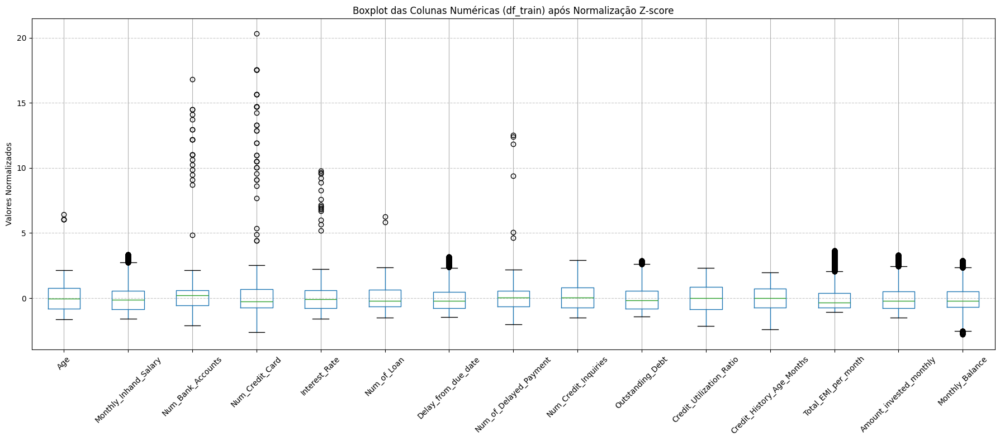


--- Gerando Pairplot para uma amostra de df_train (máx. 1000 linhas) ---
⚠️ Aviso: Pairplot completo em um dataset com mais de 55.000 linhas e 15+ colunas é inviável e pode travar seu ambiente. Usando amostra.


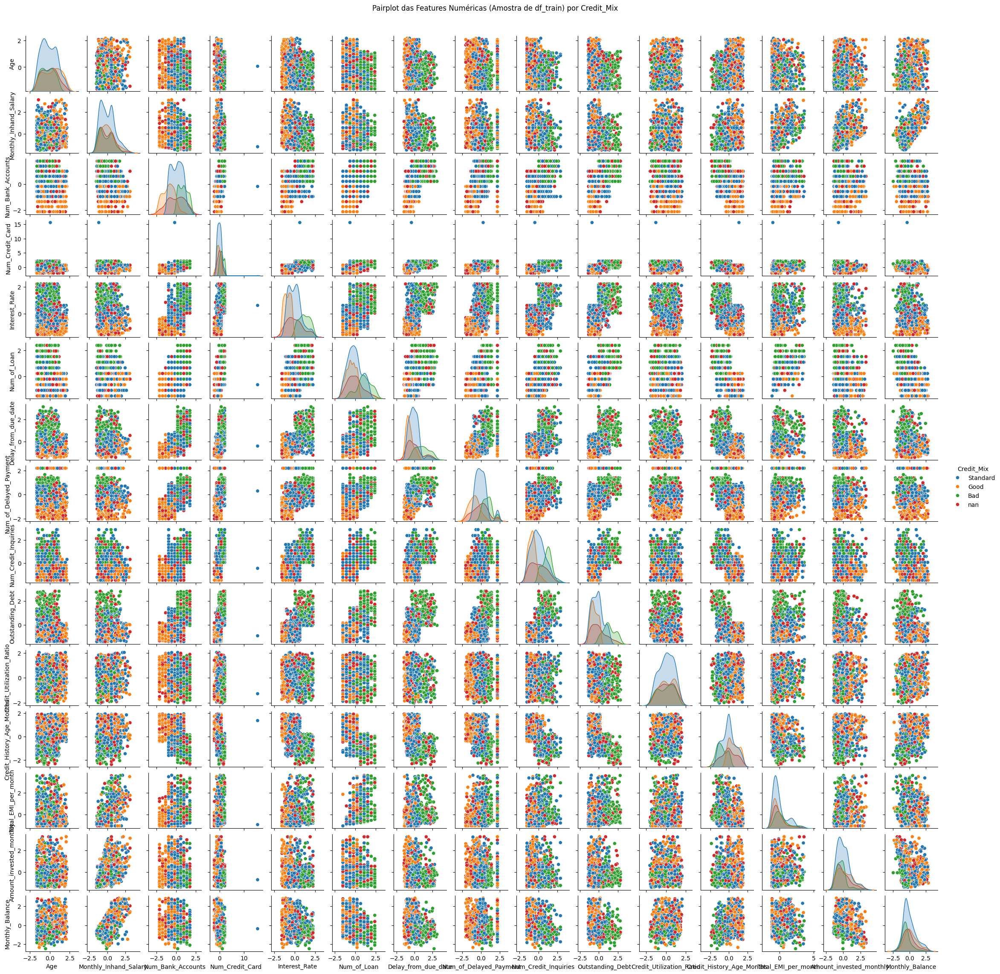


✅ Visualizações geradas.


In [ ]:
# Célula 14 (Visualização pós-normalização: Boxplots e Pairplot com amostra)

import matplotlib.pyplot as plt
import seaborn as sns

# A lista colunas_numericas e a coluna Credit_Mix devem estar disponíveis
# do escopo das células anteriores (Célula 13)

# 1. Boxplot das colunas numéricas normalizadas (do df_train)
plt.figure(figsize=(18, 8)) # Aumenta o tamanho da figura para melhor visualização
df_train[colunas_numericas].boxplot(rot=45) # Gira os rótulos para evitar sobreposição
plt.title("Boxplot das Colunas Numéricas (df_train) após Normalização Z-score")
plt.ylabel("Valores Normalizados")
plt.grid(axis='y', linestyle='--', alpha=0.7) # Adiciona grade para facilitar leitura
plt.tight_layout() # Ajusta layout para evitar corte de rótulos
plt.show()

# # 2. Boxplot das colunas numéricas normalizadas (do df_test)
# plt.figure(figsize=(18, 8))
# df_test[colunas_numericas].boxplot(rot=45)
# plt.title("Boxplot das Colunas Numéricas (df_test) após Normalização Z-score (usando parâmetros de treino)")
# plt.ylabel("Valores Normalizados")
# plt.grid(axis='y', linestyle='--', alpha=0.7)
# plt.tight_layout()
# plt.show()

print("\n--- Gerando Pairplot para uma amostra de df_train (máx. 1000 linhas) ---")
print("⚠️ Aviso: Pairplot completo em um dataset com mais de 55.000 linhas e 15+ colunas é inviável e pode travar seu ambiente. Usando amostra.")

# 3. Pairplot (com base na variável alvo Credit_Mix, amostra do df_train)
# Crie um DataFrame com as colunas numéricas e a coluna alvo Credit_Mix
# Use uma amostra do df_train para o pairplot devido ao grande volume de dados
df_train_sample = df_train.sample(n=min(1000, len(df_train)), random_state=42) # Amostra de até 1000 linhas

# Concatena colunas numéricas e Credit_Mix para o pairplot
pairplot_data = df_train_sample[colunas_numericas + ['Credit_Mix']]

# Gera o pairplot
sns.pairplot(pairplot_data, hue='Credit_Mix', height=1.5, diag_kind='kde')
plt.suptitle("Pairplot das Features Numéricas (Amostra de df_train) por Credit_Mix", y=1.02) # Título acima
plt.show()

print("\n✅ Visualizações geradas.")

--- Gerando Boxplot para df_train (Atributos Numéricos Normalizados) ---


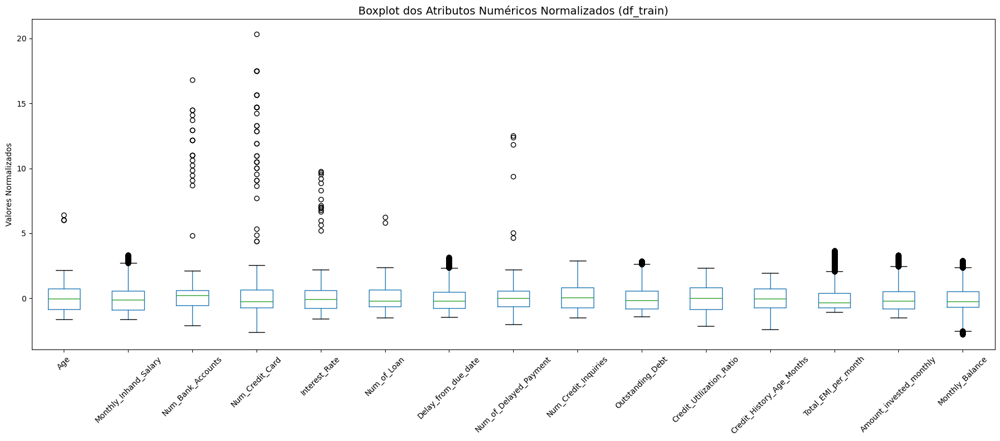


✅ Boxplots gerados para df_train e df_test.


In [ ]:
# Célula 15 (Boxplots para colunas numéricas normalizadas em df_train e df_test)

import matplotlib.pyplot as plt
import pandas as pd # Garantir que pandas está importado, se necessário

# A lista colunas_numericas deve estar disponível do escopo das células anteriores (Célula 13)

print("--- Gerando Boxplot para df_train (Atributos Numéricos Normalizados) ---")
# Boxplot para df_train
plt.figure(figsize=(18, 8)) # Aumenta o tamanho da figura
df_train.boxplot(column=colunas_numericas, figsize=(18, 8), rot=45, grid=False)
plt.title("Boxplot dos Atributos Numéricos Normalizados (df_train)", fontsize=14)
plt.ylabel("Valores Normalizados")
plt.xticks(fontsize=10)
plt.tight_layout() # Ajusta layout para evitar corte de rótulos
plt.show()

# print("\n--- Gerando Boxplot para df_test (Atributos Numéricos Normalizados) ---")
# # Boxplot para df_test
# plt.figure(figsize=(18, 8)) # Aumenta o tamanho da figura
# df_test.boxplot(column=colunas_numericas, figsize=(18, 8), rot=45, grid=False)
# plt.title("Boxplot dos Atributos Numéricos Normalizados (df_test - parâmetros de treino)", fontsize=14)
# plt.ylabel("Valores Normalizados")
# plt.xticks(fontsize=10)
# plt.tight_layout() # Ajusta layout para evitar corte de rótulos
# plt.show()

print("\n✅ Boxplots gerados para df_train e df_test.")

--- Gerando Matriz de Dispersão para uma amostra de df_train (máx. 2000 linhas) ---
⚠️ Aviso: Matriz de dispersão completa em um dataset com mais de 55.000 linhas e 15 colunas é inviável e pode travar seu ambiente. Usando amostra.


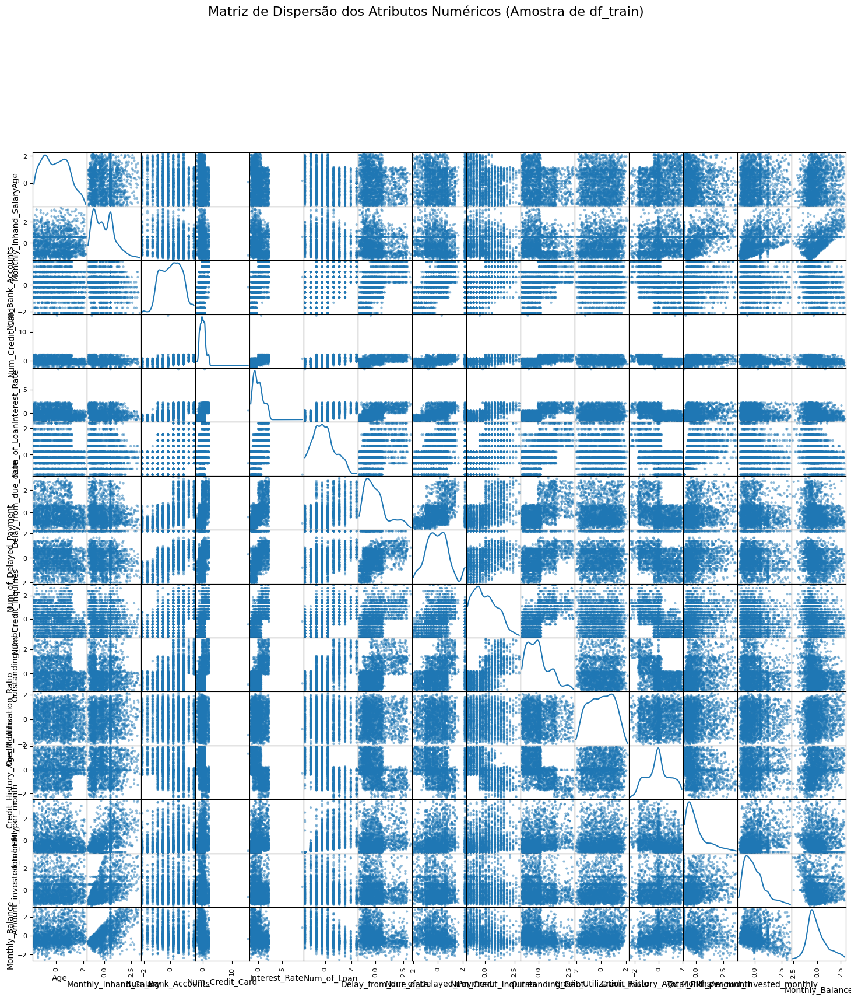


✅ Matriz de dispersão gerada.


In [ ]:
# Célula 16 (Matriz de Dispersão para Atributos Numéricos - com amostra)

import matplotlib.pyplot as plt
import pandas as pd # Garante que pandas está importado para pd.plotting

# A lista colunas_numericas deve estar disponível do escopo das células anteriores (Célula 13)

print("--- Gerando Matriz de Dispersão para uma amostra de df_train (máx. 2000 linhas) ---")
print("⚠️ Aviso: Matriz de dispersão completa em um dataset com mais de 55.000 linhas e 15 colunas é inviável e pode travar seu ambiente. Usando amostra.")

# Use uma amostra do df_train para a matriz de dispersão devido ao grande volume de dados
# Ajuste o 'n' (número de amostras) conforme a capacidade do seu ambiente e legibilidade desejada
df_train_sample_scatter = df_train.sample(n=min(2000, len(df_train)), random_state=42)

# Gera a matriz de dispersão
pd.plotting.scatter_matrix(df_train_sample_scatter[colunas_numericas], figsize=(18, 18), diagonal='kde')
plt.suptitle("Matriz de Dispersão dos Atributos Numéricos (Amostra de df_train)", fontsize=16, y=1.02) # Título acima
plt.show()

print("\n✅ Matriz de dispersão gerada.")

In [ ]:
# Célula 17 (Verificação Final de NaNs e Estatísticas Descritivas Pós-Normalização)

import pandas as pd # Garante que pandas está importado

# A lista colunas_numericas deve estar disponível do escopo das células anteriores (Célula 13)

print("--- Verificação de valores nulos (NaNs) em df_train ---")
# Deve ser zero em todas as colunas numéricas do df_train
nulos_train = df_train[colunas_numericas].isnull().sum()
print(nulos_train[nulos_train > 0]) # Imprime apenas se houver NaNs
if nulos_train.sum() == 0:
    print("✅ Nenhuma coluna numérica com valores nulos em df_train.")
else:
    print("⚠️ Atenção: Há valores nulos nas colunas acima em df_train.")

print("\n--- Estatísticas descritivas para df_train (Atributos Numéricos Normalizados) ---")
# Verifique min, max, std, etc. - Média deve ser ~0, Std ~1
display(df_train[colunas_numericas].describe())

print("\n--- Verificação de valores nulos (NaNs) em df_test ---")
# Deve ser zero em todas as colunas numéricas do df_test
nulos_test = df_test[colunas_numericas].isnull().sum()
print(nulos_test[nulos_test > 0]) # Imprime apenas se houver NaNs
if nulos_test.sum() == 0:
    print("✅ Nenhuma coluna numérica com valores nulos em df_test.")
else:
    print("⚠️ Atenção: Há valores nulos nas colunas acima em df_test.")

print("\n--- Estatísticas descritivas para df_test (Atributos Numéricos Normalizados) ---")
# Verifique min, max, std, etc. - Média deve ser ~0, Std ~1 (usando parâmetros de treino)
display(df_test[colunas_numericas].describe())

print("\n✅ Verificações de dados concluídas.")

--- Verificação de valores nulos (NaNs) em df_train ---
Series([], dtype: int64)
✅ Nenhuma coluna numérica com valores nulos em df_train.

--- Estatísticas descritivas para df_train (Atributos Numéricos Normalizados) ---


,Age,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age_Months,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
count,5.581400e+04,5.581400e+04,5.581400e+04,5.581400e+04,5.581400e+04,5.581400e+04,5.581400e+04,5.581400e+04,5.581400e+04,5.581400e+04,5.581400e+04,5.581400e+04,5.581400e+04,5.581400e+04,5.581400e+04
mean,-2.877104e-16,4.735763e-17,9.496988e-17,2.469726e-17,-2.087810e-17,-2.444265e-17,-5.015835e-17,2.476091e-16,-2.036887e-17,-2.383158e-16,-3.192821e-16,1.354530e-16,-4.277464e-17,2.474818e-16,-2.566478e-16
std,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
min,-1.628488e+00,-1.602256e+00,-2.106073e+00,-2.602508e+00,-1.571801e+00,-1.509832e+00,-1.455042e+00,-2.009031e+00,-1.510833e+00,-1.400182e+00,-2.149052e+00,-2.388203e+00,-1.063581e+00,-1.510046e+00,-2.785196e+00
25%,-8.317879e-01,-8.720808e-01,-5.626031e-01,-7.301468e-01,-7.687523e-01,-6.477989e-01,-7.668264e-01,-6.503511e-01,-7.308732e-01,-7.922653e-01,-8.416759e-01,-7.036860e-01,-7.140364e-01,-7.838378e-01,-6.843841e-01
50%,-3.508776e-02,-1.356823e-01,2.091320e-01,-2.620564e-01,-8.042453e-02,-2.167824e-01,-2.162539e-01,2.898899e-02,4.908697e-02,-1.514103e-01,-6.900025e-05,-1.049228e-02,-3.181752e-01,-2.217849e-01,-2.241997e-01
75%,7.616124e-01,5.702431e-01,5.949996e-01,6.741242e-01,6.079032e-01,6.452505e-01,4.719617e-01,5.724610e-01,8.290472e-01,5.796253e-01,8.473756e-01,7.324723e-01,4.031731e-01,5.165316e-01,5.325704e-01
max,6.438101e+00,3.334392e+00,1.680144e+01,2.033392e+01,9.785606e+00,6.248465e+00,3.156003e+00,1.252885e+01,2.908941e+00,2.859949e+00,2.323062e+00,1.963465e+00,3.651045e+00,3.308234e+00,2.894944e+00



--- Verificação de valores nulos (NaNs) em df_test ---
Series([], dtype: int64)
✅ Nenhuma coluna numérica com valores nulos em df_test.

--- Estatísticas descritivas para df_test (Atributos Numéricos Normalizados) ---


,Age,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age_Months,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
count,27680.000000,27680.000000,27680.000000,27680.000000,27680.000000,27680.000000,27680.000000,27680.000000,27680.000000,27680.000000,27680.000000,27680.000000,27680.000000,27680.000000,27680.000000
mean,0.031875,-0.038272,0.004279,0.004576,0.009023,0.013550,0.005599,0.009099,0.407837,0.014579,0.001460,0.045377,0.074469,-0.019118,-0.034853
std,1.002862,0.970467,0.990123,1.009448,0.997931,1.006894,1.002847,0.992908,1.026827,1.007250,0.996544,1.001117,1.077994,0.982444,0.964939
min,-1.628488,-1.602256,-2.106073,-2.602508,-1.571801,-1.509832,-1.455042,-2.009031,-1.510833,-1.400182,-2.164521,-2.291019,-1.063581,-1.510046,-2.702906
25%,-0.831788,-0.886576,-0.562603,-0.730147,-0.768752,-0.647799,-0.766826,-0.650351,-0.470886,-0.783237,-0.836462,-0.660493,-0.695040,-0.786801,-0.693230
50%,-0.035088,-0.157331,0.209132,-0.262056,-0.080425,-0.216782,-0.216254,0.028989,0.309074,-0.137230,0.002664,-0.010492,-0.276486,-0.236723,-0.244968
75%,0.761612,0.570243,0.595000,0.674124,0.607903,0.645251,0.471962,0.572461,1.089034,0.607986,0.844434,0.775665,0.518896,0.492525,0.485430
max,2.155838,3.232839,14.872099,20.802008,8.523672,2.369316,3.156003,8.181070,2.908941,2.898613,2.300609,2.006658,4.147522,3.238262,2.769821



✅ Verificações de dados concluídas.


In [ ]:
# Verificação de valores únicos e contagens para Credit_Mix em df_train
print(df_train['Credit_Mix'].value_counts(dropna=False))

Credit_Mix
Standard    22352
Good        12285
nan         11438
Bad          9739
Name: count, dtype: int64


In [ ]:
# Exemplo: Preencher NaNs em Credit_Mix com a moda (mais comum)
# ou com uma nova categoria 'Unknown'
# df_train['Credit_Mix'] = df_train['Credit_Mix'].fillna(df_train['Credit_Mix'].mode()[0])
df_train['Credit_Mix'] = df_train['Credit_Mix'].fillna('Unknown') # Nova categoria
df_test['Credit_Mix'] = df_test['Credit_Mix'].fillna('Unknown') # Fazer o mesmo para o test set

In [ ]:
# Exemplo: Substituir a string 'nan' por uma categoria 'Unknown' ou pela moda
df_train['Credit_Mix'] = df_train['Credit_Mix'].replace('nan', 'Unknown')
df_test['Credit_Mix'] = df_test['Credit_Mix'].replace('nan', 'Unknown')

In [ ]:
print(df_train['Credit_Mix'].value_counts(dropna=False))

Credit_Mix
Standard    22352
Good        12285
Unknown     11438
Bad          9739
Name: count, dtype: int64


In [ ]:
# Célula 17.5 (Tratamento da string 'nan' na coluna Credit_Mix)

print("--- Tratando string 'nan' na coluna 'Credit_Mix' para 'Unknown' ---")

# Substituir a string 'nan' pela categoria 'Unknown' em df_train
df_train['Credit_Mix'] = df_train['Credit_Mix'].replace('nan', 'Unknown')

# Fazer a mesma substituição no df_test para manter a consistência
df_test['Credit_Mix'] = df_test['Credit_Mix'].replace('nan', 'Unknown')

print("Verificando contagem de valores após a substituição em df_train:")
print(df_train['Credit_Mix'].value_counts(dropna=False))

print("\nVerificando contagem de valores após a substituição em df_test:")
print(df_test['Credit_Mix'].value_counts(dropna=False))

print("\n✅ String 'nan' tratada na coluna 'Credit_Mix' em ambos os DataFrames.")

--- Tratando string 'nan' na coluna 'Credit_Mix' para 'Unknown' ---
Verificando contagem de valores após a substituição em df_train:
Credit_Mix
Standard    22352
Good        12285
Unknown     11438
Bad          9739
Name: count, dtype: int64

Verificando contagem de valores após a substituição em df_test:
Credit_Mix
Standard    11165
Good         6065
Unknown      5411
Bad          5039
Name: count, dtype: int64

✅ String 'nan' tratada na coluna 'Credit_Mix' em ambos os DataFrames.


--- Gerando gráfico de Renda Mensal Líquida vs Dívida Pendente (df_train) ---


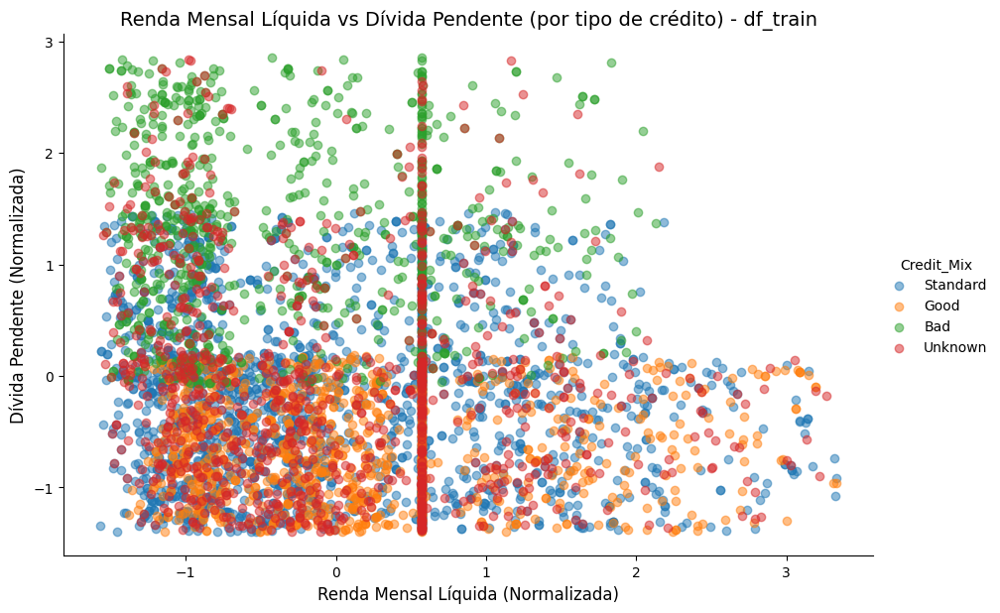


✅ Gráfico de dispersão gerado.


In [ ]:
# Célula 18 (Relação entre Renda Mensal Líquida e Dívida Pendente por Credit_Mix)

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd # Garante que pandas está importado

# Certifique-se de que 'Credit_Mix' é a coluna-alvo no df_train
# Se Credit_Mix não for uma coluna em df_train, ou for o índice, ajuste conforme necessário.
# Assumimos que Credit_Mix é uma coluna categórica após o pré-processamento.

print("--- Gerando gráfico de Renda Mensal Líquida vs Dívida Pendente (df_train) ---")

# Para garantir a legibilidade do gráfico em datasets grandes, é uma boa prática
# usar uma amostra, como fizemos no pairplot e scatter_matrix.
# Ajuste o 'n' conforme a necessidade de visualização e desempenho.
df_train_sample_plot = df_train.sample(n=min(5000, len(df_train)), random_state=42)

sns.lmplot(x='Monthly_Inhand_Salary', y='Outstanding_Debt', data=df_train_sample_plot,
           fit_reg=False, hue='Credit_Mix', height=6, aspect=1.5,
           scatter_kws={'alpha':0.5}) # Adiciona transparência para melhor visualização de pontos sobrepostos

plt.title('Renda Mensal Líquida vs Dívida Pendente (por tipo de crédito) - df_train', fontsize=14)
plt.xlabel('Renda Mensal Líquida (Normalizada)', fontsize=12)
plt.ylabel('Dívida Pendente (Normalizada)', fontsize=12)
plt.show()

print("\n✅ Gráfico de dispersão gerado.")

In [ ]:
# Célula 19 (Re-definição de Features (X) e Variável Alvo (y) para Classificação de Credit_Mix)

import pandas as pd
from sklearn.model_selection import train_test_split

print("--- Re-definindo a variável alvo para 'Credit_Mix' e excluindo linhas com 'Unknown' ---")

# 1. Remover as linhas onde 'Credit_Mix' é 'Unknown' do df_train
# Esta é a etapa crucial para garantir que o alvo não tenha rótulos desconhecidos
rows_before_filter = len(df_train)
df_train_filtered = df_train[df_train['Credit_Mix'] != 'Unknown'].copy()
rows_after_filter = len(df_train_filtered)

print(f"\nNúmero original de linhas em df_train: {rows_before_filter}")
print(f"Número de linhas removidas (Credit_Mix = 'Unknown'): {rows_before_filter - rows_after_filter}")
print(f"Número de linhas restantes em df_train_filtered: {rows_after_filter}")

# 2. Definir a nova variável alvo (y_train)
y_train = df_train_filtered['Credit_Mix']

# 3. Definir as novas features (X_train) para treino
# Excluímos 'Credit_Mix' (o novo alvo)
# E também 'Credit_Score' porque ela não está presente no df_test
# para garantir que X_train e X_test tenham o mesmo conjunto de colunas.
features_to_exclude_from_X = ['Credit_Mix', 'Credit_Score']

X_train = df_train_filtered.drop(columns=features_to_exclude_from_X)

# 4. Preparar X_test
# df_test já não contém 'Credit_Score' (verificado pelo KeyError anterior).
# Precisamos garantir que ele também não contenha 'Credit_Mix' já que agora é o alvo.
if 'Credit_Mix' in df_test.columns:
    X_test = df_test.drop(columns=['Credit_Mix'])
else:
    X_test = df_test.copy() # Caso Credit_Mix já tenha sido removido por algum motivo

# Verificação final para garantir que X_train e X_test têm as mesmas colunas
# Isso é CRUCIAL antes de treinar qualquer modelo.
X_train_cols = set(X_train.columns)
X_test_cols = set(X_test.columns)

if X_train_cols != X_test_cols:
    print(f"\n⚠️ ERRO CRÍTICO: Colunas de X_train e X_test não são idênticas!")
    print(f"Colunas em X_train mas não em X_test: {X_train_cols - X_test_cols}")
    print(f"Colunas em X_test mas não em X_train: {X_test_cols - X_train_cols}")
    # Para prosseguir, uma solução é reindexar X_test para ter as colunas de X_train.
    # Isto assume que as colunas ausentes em X_test devem ser preenchidas com zeros (após normalização, isso faz sentido).
    X_test = X_test.reindex(columns=X_train.columns, fill_value=0)
    print("X_test reindexado para ter as mesmas colunas que X_train.")


print("\n--- Formato dos conjuntos X e y após a re-definição ---")
print("X_train (features de treino):", X_train.shape)
print("y_train (alvo de treino):", y_train.shape)
print("X_test (features de teste):", X_test.shape)

print("\n--- Primeiras linhas de X_train (features) ---")
display(X_train.head())

print("\n--- Primeiras linhas de y_train (alvo) ---")
display(y_train.head())

print("\n✅ Features (X) e Variável Alvo (y) re-definidas para Classificação de Credit_Mix.")

# Próximo passo: Codificar as features categóricas em X_train e X_test
# Vamos listar as colunas categóricas para o usuário revisar.
categorical_features = X_train.select_dtypes(include='object').columns.tolist()
print(f"\nColunas categóricas em X_train que precisarão de codificação: {categorical_features}")

--- Re-definindo a variável alvo para 'Credit_Mix' e excluindo linhas com 'Unknown' ---

Número original de linhas em df_train: 55814
Número de linhas removidas (Credit_Mix = 'Unknown'): 11438
Número de linhas restantes em df_train_filtered: 44376

--- Formato dos conjuntos X e y após a re-definição ---
X_train (features de treino): (44376, 16)
y_train (alvo de treino): (44376,)
X_test (features de teste): (27680, 16)

--- Primeiras linhas de X_train (features) ---


,Age,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_History_Age_Months
3,-1.13055,0.570243,-0.948471,-0.730147,-1.342359,0.214234,-1.110934,-1.465559,-0.470886,-0.540068,-0.121066,No,-0.379962,0.617791,-1.092277,0.494912
4,-1.13055,-0.752807,-0.948471,-0.730147,-1.342359,0.214234,-1.042113,2.192462,-0.470886,-0.540068,-1.440594,No,-0.379962,-1.068172,-0.112813,0.505710
5,-1.13055,0.570243,-0.948471,-0.730147,-1.342359,0.214234,-0.904470,-1.465559,-0.470886,-0.540068,-0.946329,No,-0.379962,-0.844035,-0.121194,0.516509
6,-1.13055,-0.752807,-0.948471,-0.730147,-1.342359,0.214234,-1.248577,-0.922087,-0.470886,-0.540068,-1.893721,No,-0.379962,0.392545,-0.917075,0.527307
7,-1.13055,-0.752807,-0.948471,-0.730147,-1.342359,0.214234,-1.248577,-1.193823,-0.470886,-0.540068,-1.613754,No,-0.379962,-1.245635,0.025221,-0.010492



--- Primeiras linhas de y_train (alvo) ---


,Credit_Mix
3,Good
4,Good
5,Good
6,Good
7,Good



✅ Features (X) e Variável Alvo (y) re-definidas para Classificação de Credit_Mix.

Colunas categóricas em X_train que precisarão de codificação: ['Payment_of_Min_Amount']


In [ ]:
# # Célula 20 (Codificação de Features Categóricas)

# import pandas as pd
# from sklearn.preprocessing import OneHotEncoder
# from sklearn.compose import ColumnTransformer
# from sklearn.pipeline import Pipeline

# print("--- Codificando features categóricas (One-Hot Encoding) ---")

# # Identificar colunas categóricas para codificação
# categorical_features = X_train.select_dtypes(include='object').columns.tolist()

# if not categorical_features:
#     print("✅ Nenhuma feature categórica para codificar em X_train. Pulando etapa de codificação.")
#     X_train_encoded = X_train.copy()
#     X_test_encoded = X_test.copy()
# else:
#     print(f"Features categóricas a serem codificadas: {categorical_features}")

#     # Criar um ColumnTransformer para aplicar OneHotEncoder apenas às colunas categóricas
#     # 'remainder='passthrough'' garante que as colunas numéricas não sejam alteradas
#     preprocessor = ColumnTransformer(
#         transformers=[
#             ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_features)
#         ],
#         remainder='passthrough'
#     )

#     # Aplicar o pré-processador aos conjuntos de treino e teste
#     # O pré-processador transforma os DataFrames em arrays numpy.
#     X_train_encoded_array = preprocessor.fit_transform(X_train)
#     X_test_encoded_array = preprocessor.transform(X_test) # Use transform, não fit_transform, para o teste

#     # Converter os arrays resultantes de volta para DataFrames para facilitar a visualização e futuras etapas
#     # Precisamos obter os nomes das novas colunas criadas pelo OneHotEncoder
#     # O OneHotEncoder está dentro do 'cat' transformer
#     ohe_feature_names = preprocessor.named_transformers_['cat'].get_feature_names_out(categorical_features)

#     # Combinar os nomes das colunas codificadas com os nomes das colunas numéricas originais
#     numeric_features = X_train.select_dtypes(include=['int64', 'float64']).columns.tolist()
#     all_encoded_feature_names = list(ohe_feature_names) + numeric_features

#     X_train_encoded = pd.DataFrame(X_train_encoded_array, columns=all_encoded_feature_names, index=X_train.index)
#     X_test_encoded = pd.DataFrame(X_test_encoded_array, columns=all_encoded_feature_names, index=X_test.index)

# print("\n--- Formato dos conjuntos X_encoded após codificação ---")
# print("X_train_encoded (features de treino codificadas):", X_train_encoded.shape)
# print("X_test_encoded (features de teste codificadas):", X_test_encoded.shape)

# print("\n--- Primeiras linhas de X_train_encoded (features codificadas) ---")
# display(X_train_encoded.head())

# print("\n✅ Codificação de features categóricas concluída.")

In [ ]:
# Célula 20 (Codificação de Features Categóricas - Usando Label Encoding)

import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

print("--- Codificando features categóricas (Label Encoding) ---")

# Identificar colunas categóricas para codificação
categorical_features = X_train.select_dtypes(include='object').columns.tolist()

if not categorical_features:
    print("✅ Nenhuma feature categórica para codificar em X_train. Pulando etapa de codificação.")
    X_train_encoded = X_train.copy()
    X_test_encoded = X_test.copy()
else:
    print(f"Features categóricas a serem codificadas: {categorical_features}")

    # Atenção: LabelEncoder não é adequado para ColumnTransformer como o OneHotEncoder
    # Ele trabalha diretamente em Series ou arrays 1D.
    # Vamos aplicá-lo coluna por coluna.

    X_train_encoded = X_train.copy()
    X_test_encoded = X_test.copy()

    for col in categorical_features:
        le = LabelEncoder()

        # Combinar treino e teste para que o LabelEncoder veja todas as categorias possíveis
        # antes de transformar. Isso evita KeyError se uma categoria só aparece no teste.
        combined_data = pd.concat([X_train_encoded[col], X_test_encoded[col]], axis=0)
        le.fit(combined_data) # Treina o encoder com todas as categorias únicas

        X_train_encoded[col] = le.transform(X_train_encoded[col])
        X_test_encoded[col] = le.transform(X_test_encoded[col])

        print(f"  - Coluna '{col}' codificada para: {list(le.classes_)} -> {list(range(len(le.classes_)))}")

print("\n--- Formato dos conjuntos X_encoded após codificação ---")
print("X_train_encoded (features de treino codificadas):", X_train_encoded.shape)
print("X_test_encoded (features de teste codificadas):", X_test_encoded.shape)

print("\n--- Primeiras linhas de X_train_encoded (features codificadas) ---")
display(X_train_encoded.head())

print("\n--- Tipos de dados de X_train_encoded ---")
print(X_train_encoded.dtypes)

print("\n✅ Codificação de features categóricas concluída (Label Encoding).")

--- Codificando features categóricas (Label Encoding) ---
Features categóricas a serem codificadas: ['Payment_of_Min_Amount']
  - Coluna 'Payment_of_Min_Amount' codificada para: ['NM', 'No', 'Yes'] -> [0, 1, 2]

--- Formato dos conjuntos X_encoded após codificação ---
X_train_encoded (features de treino codificadas): (44376, 16)
X_test_encoded (features de teste codificadas): (27680, 16)

--- Primeiras linhas de X_train_encoded (features codificadas) ---


,Age,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_History_Age_Months
3,-1.13055,0.570243,-0.948471,-0.730147,-1.342359,0.214234,-1.110934,-1.465559,-0.470886,-0.540068,-0.121066,1,-0.379962,0.617791,-1.092277,0.494912
4,-1.13055,-0.752807,-0.948471,-0.730147,-1.342359,0.214234,-1.042113,2.192462,-0.470886,-0.540068,-1.440594,1,-0.379962,-1.068172,-0.112813,0.505710
5,-1.13055,0.570243,-0.948471,-0.730147,-1.342359,0.214234,-0.904470,-1.465559,-0.470886,-0.540068,-0.946329,1,-0.379962,-0.844035,-0.121194,0.516509
6,-1.13055,-0.752807,-0.948471,-0.730147,-1.342359,0.214234,-1.248577,-0.922087,-0.470886,-0.540068,-1.893721,1,-0.379962,0.392545,-0.917075,0.527307
7,-1.13055,-0.752807,-0.948471,-0.730147,-1.342359,0.214234,-1.248577,-1.193823,-0.470886,-0.540068,-1.613754,1,-0.379962,-1.245635,0.025221,-0.010492



--- Tipos de dados de X_train_encoded ---
Age                          float64
Monthly_Inhand_Salary        float64
Num_Bank_Accounts            float64
Num_Credit_Card              float64
Interest_Rate                float64
Num_of_Loan                  float64
Delay_from_due_date          float64
Num_of_Delayed_Payment       float64
Num_Credit_Inquiries         float64
Outstanding_Debt             float64
Credit_Utilization_Ratio     float64
Payment_of_Min_Amount          int64
Total_EMI_per_month          float64
Amount_invested_monthly      float64
Monthly_Balance              float64
Credit_History_Age_Months    float64
dtype: object

✅ Codificação de features categóricas concluída (Label Encoding).


--- Gerando gráfico de Renda Mensal Líquida vs Dívida Pendente (df_train_filtered) ---


<Figure size 1000x700 with 0 Axes>

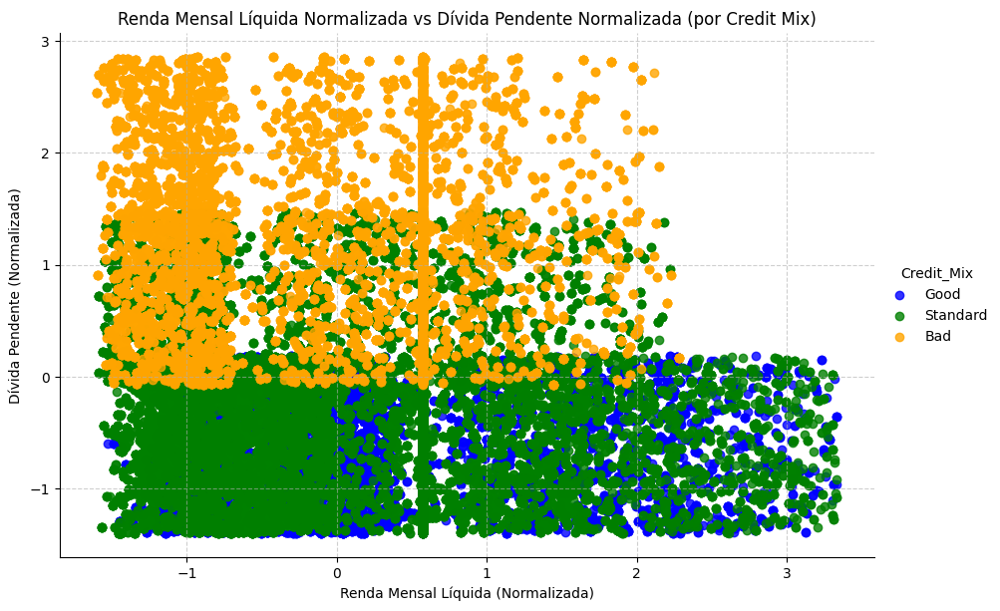


✅ Gráfico de Renda Mensal Líquida vs Dívida Pendente plotado com os dados filtrados e normalizados.


In [ ]:
# Célula 21 (Re-plotando Renda Mensal Líquida vs Dívida Pendente com dados tratados)

import seaborn as sns
import matplotlib.pyplot as plt

print("--- Gerando gráfico de Renda Mensal Líquida vs Dívida Pendente (df_train_filtered) ---")

# Usamos df_train_filtered porque ele contém os dados de treino
# após a remoção dos 'Unknown' de Credit_Mix e com as features numéricas normalizadas.
# As colunas usadas no plot ('Monthly_Inhand_Salary', 'Outstanding_Debt', 'Credit_Mix')
# estão em df_train_filtered no estado correto para visualização.

plt.figure(figsize=(10, 7)) # Define o tamanho da figura para melhor visualização
sns.lmplot(x='Monthly_Inhand_Salary', y='Outstanding_Debt', data=df_train_filtered,
           fit_reg=False, hue='Credit_Mix', height=6, aspect=1.5,
           palette={'Good': 'blue', 'Bad': 'orange', 'Standard': 'green'}) # Definindo as cores explicitamente

plt.title('Renda Mensal Líquida Normalizada vs Dívida Pendente Normalizada (por Credit Mix)')
plt.xlabel('Renda Mensal Líquida (Normalizada)')
plt.ylabel('Dívida Pendente (Normalizada)')
plt.grid(True, linestyle='--', alpha=0.6) # Adiciona grade para facilitar a leitura
plt.show()

print("\n✅ Gráfico de Renda Mensal Líquida vs Dívida Pendente plotado com os dados filtrados e normalizados.")

--- Gerando Boxplots para atributos numéricos por Credit_Mix (df_train_filtered) ---


<ipython-input-30-2da736b22569>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Credit_Mix', y=atributo, data=df_train_filtered,


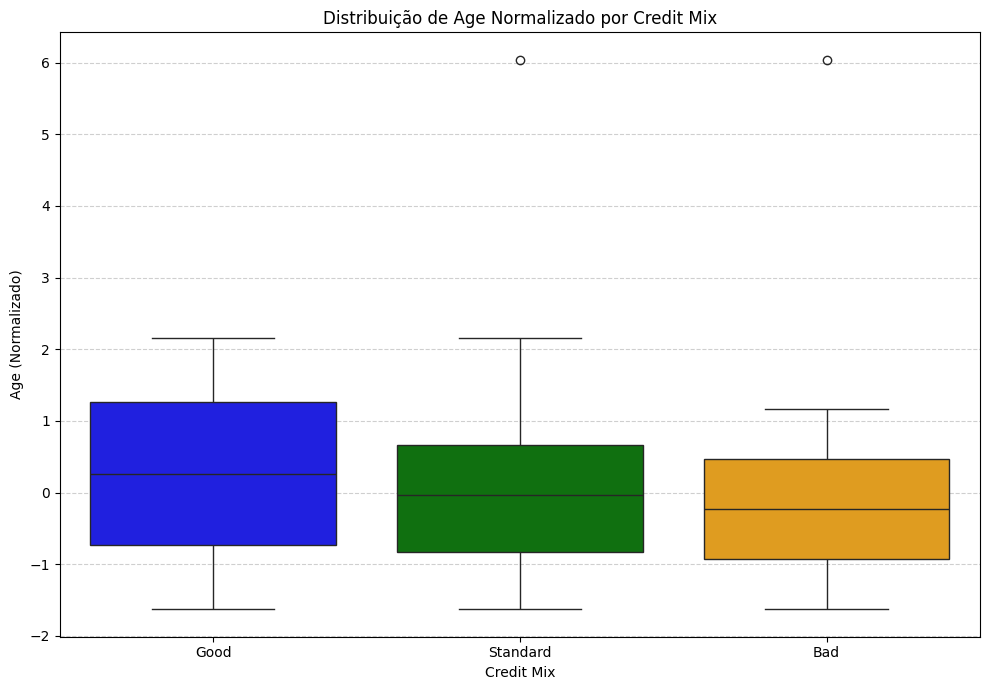

<ipython-input-30-2da736b22569>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Credit_Mix', y=atributo, data=df_train_filtered,


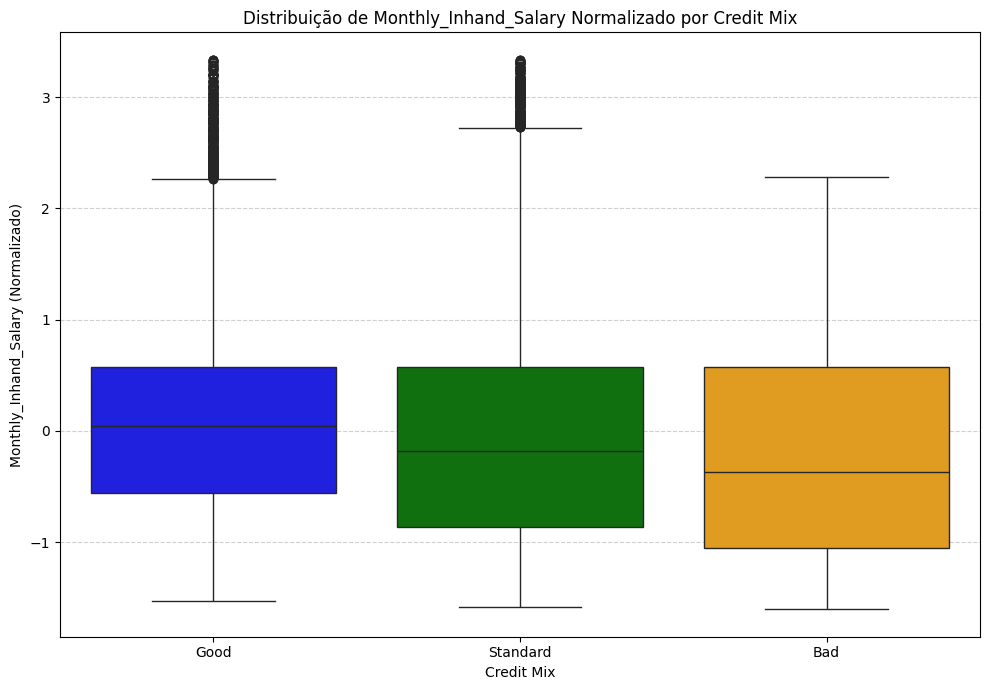

<ipython-input-30-2da736b22569>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Credit_Mix', y=atributo, data=df_train_filtered,


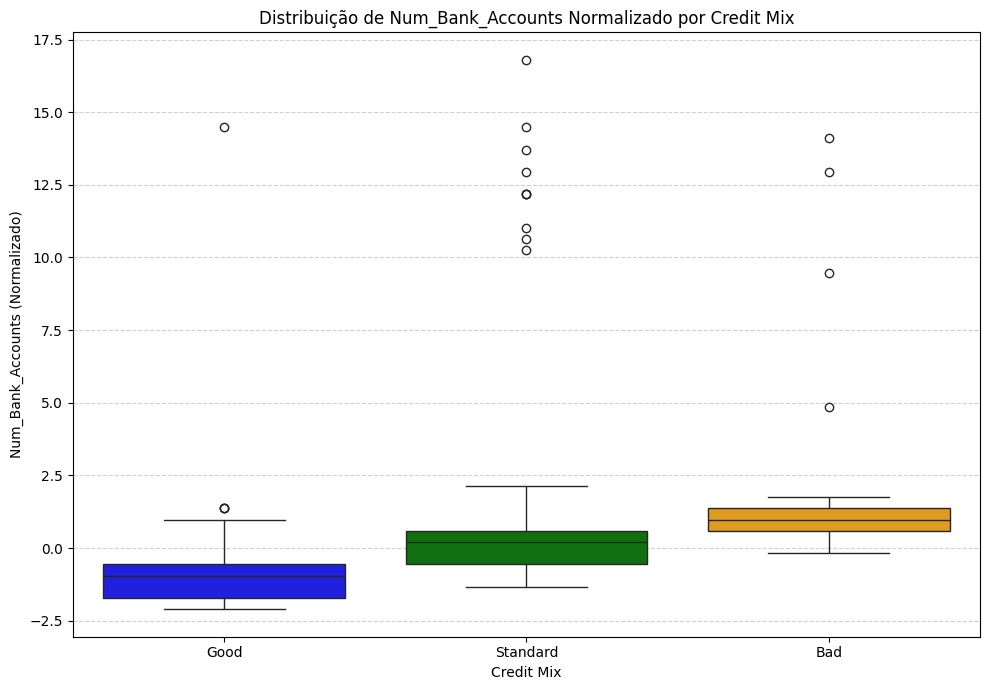

<ipython-input-30-2da736b22569>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Credit_Mix', y=atributo, data=df_train_filtered,


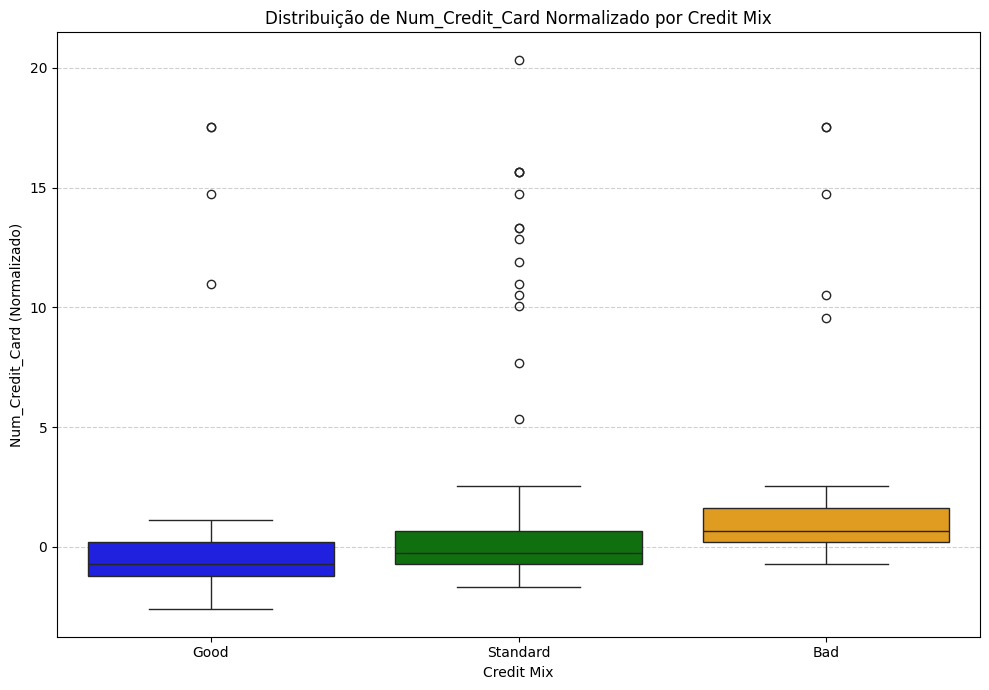

<ipython-input-30-2da736b22569>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Credit_Mix', y=atributo, data=df_train_filtered,


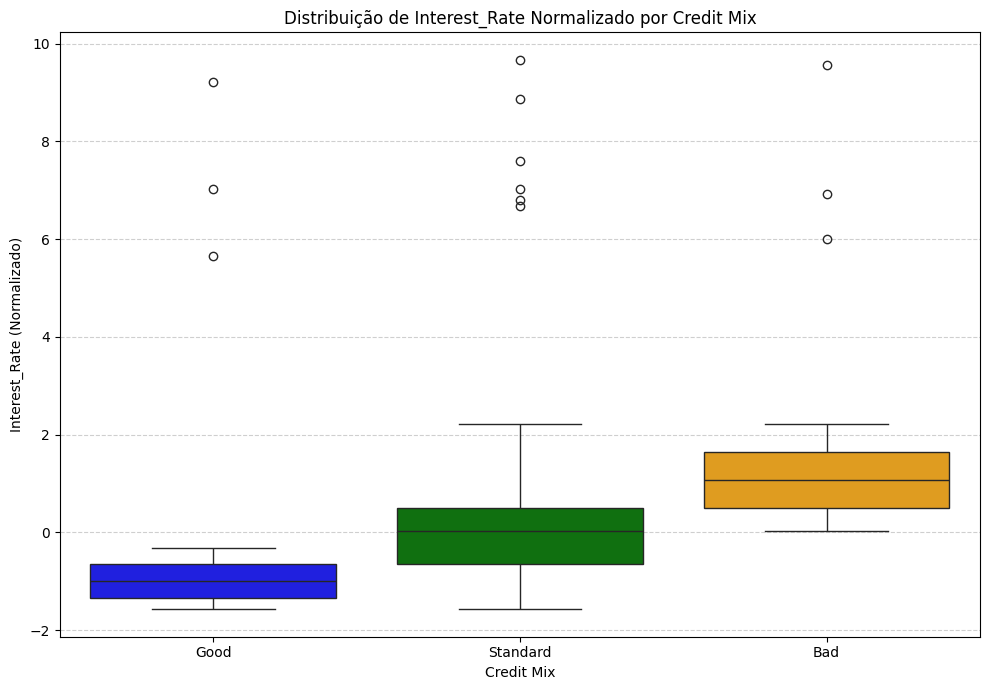

<ipython-input-30-2da736b22569>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Credit_Mix', y=atributo, data=df_train_filtered,


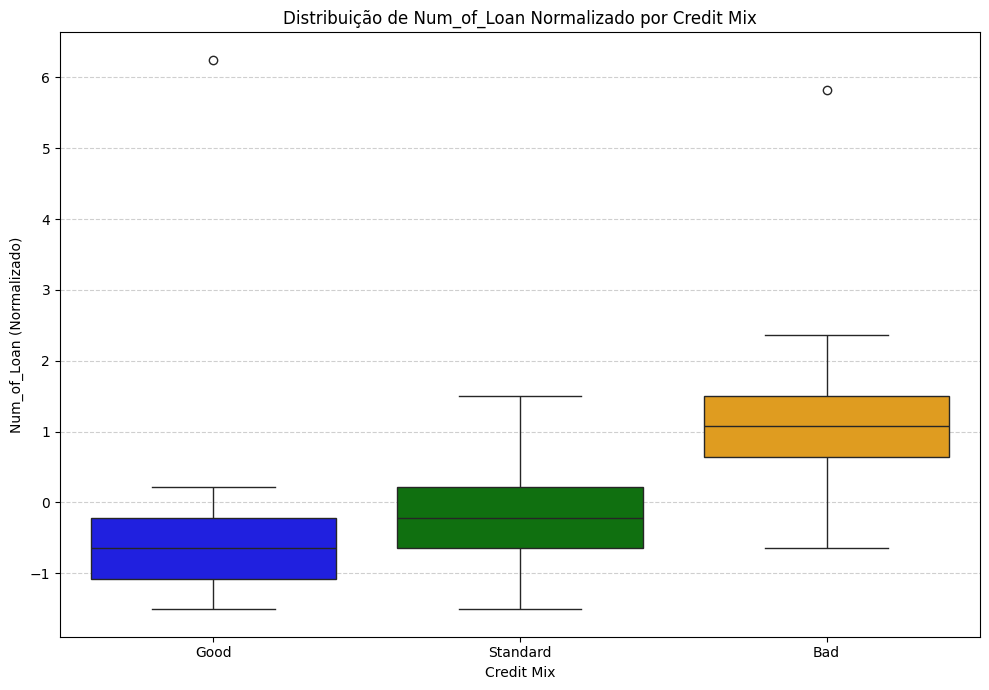

<ipython-input-30-2da736b22569>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Credit_Mix', y=atributo, data=df_train_filtered,


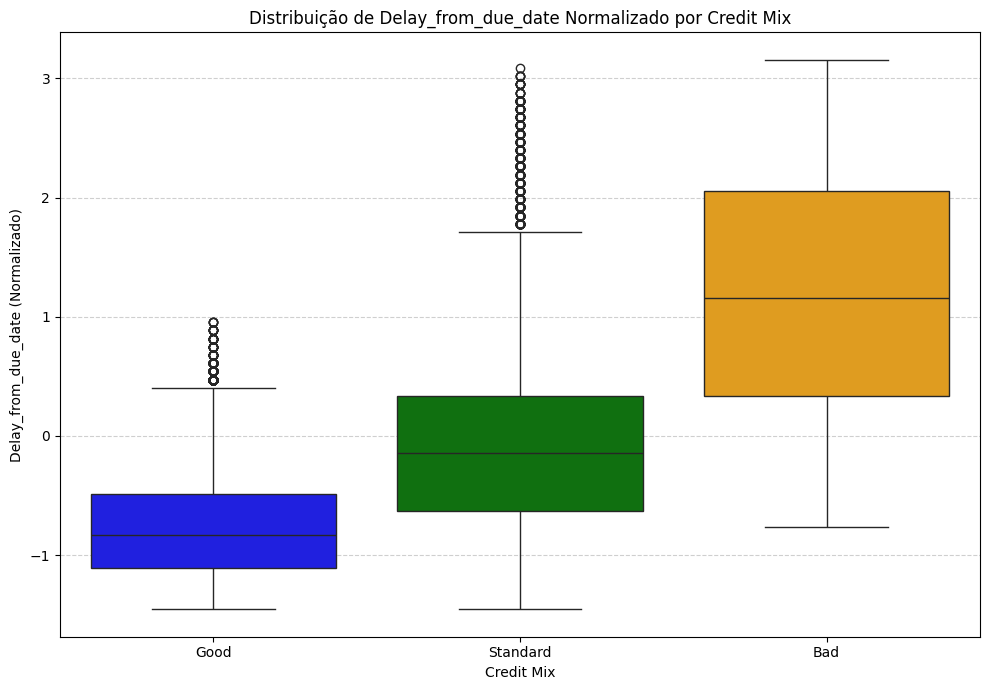

<ipython-input-30-2da736b22569>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Credit_Mix', y=atributo, data=df_train_filtered,


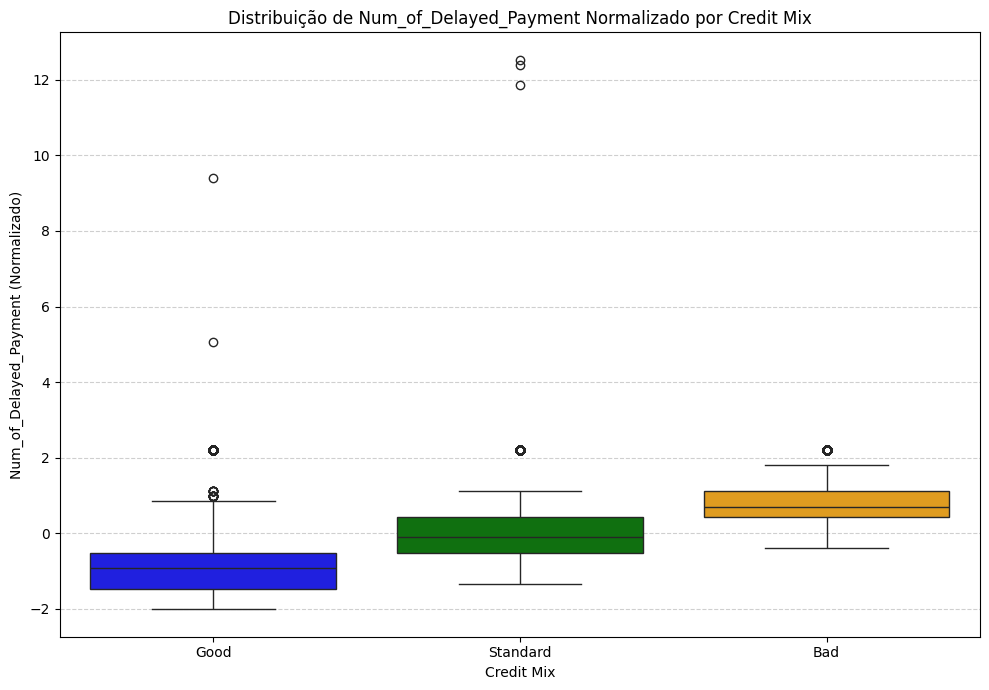

<ipython-input-30-2da736b22569>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Credit_Mix', y=atributo, data=df_train_filtered,


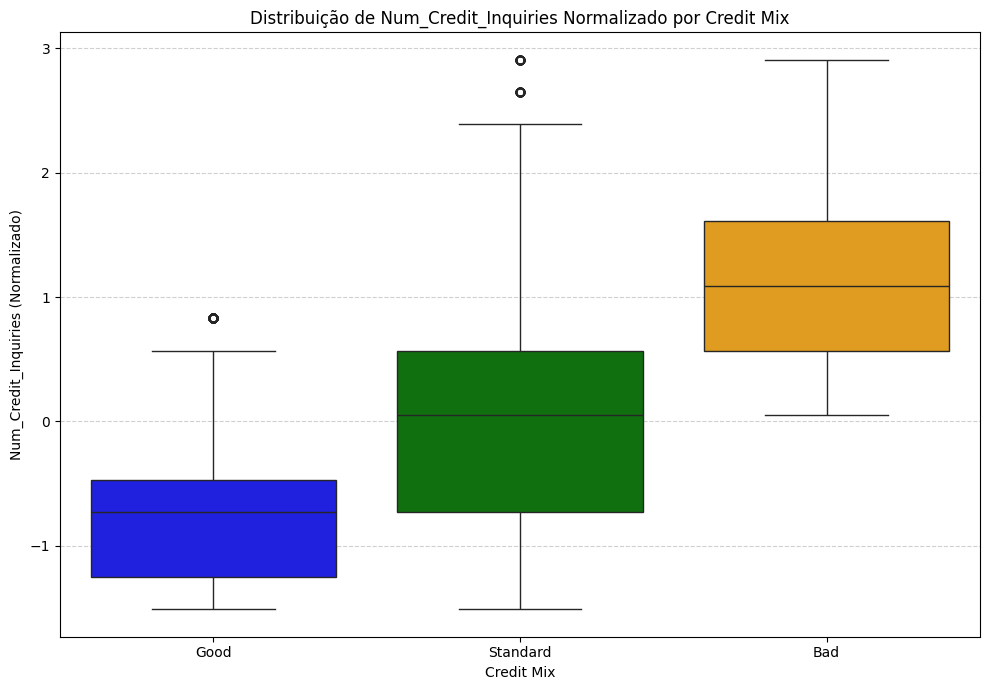

<ipython-input-30-2da736b22569>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Credit_Mix', y=atributo, data=df_train_filtered,


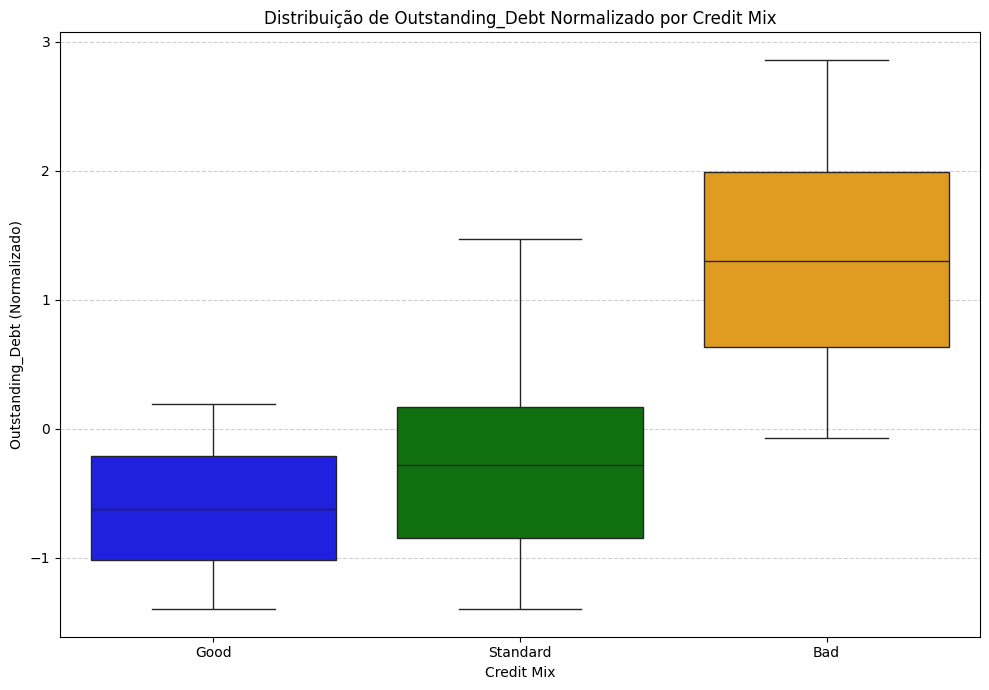

<ipython-input-30-2da736b22569>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Credit_Mix', y=atributo, data=df_train_filtered,


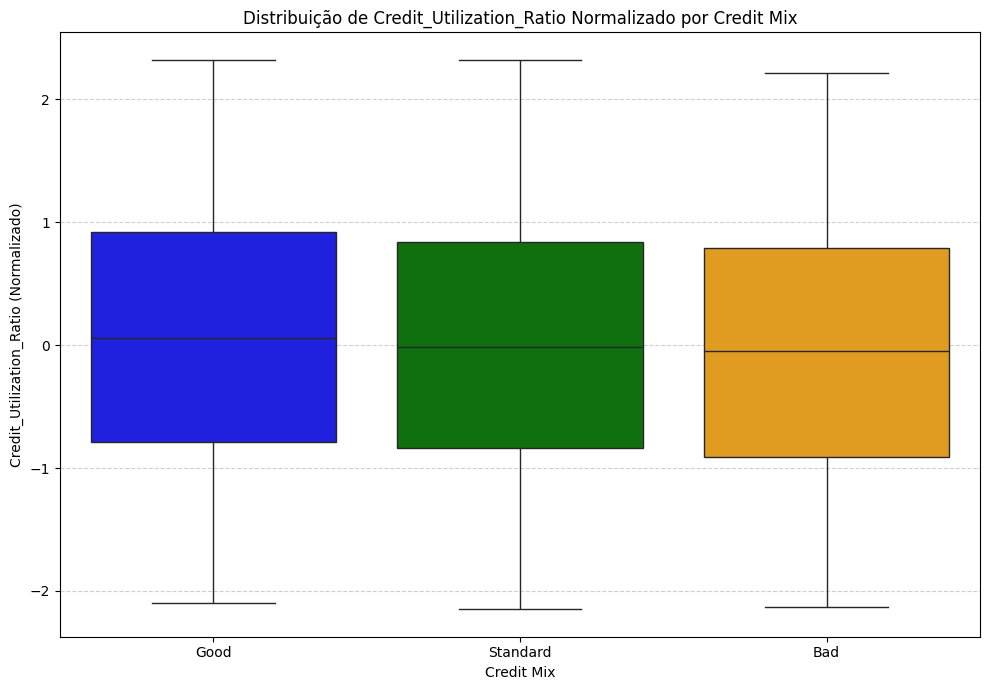

<ipython-input-30-2da736b22569>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Credit_Mix', y=atributo, data=df_train_filtered,


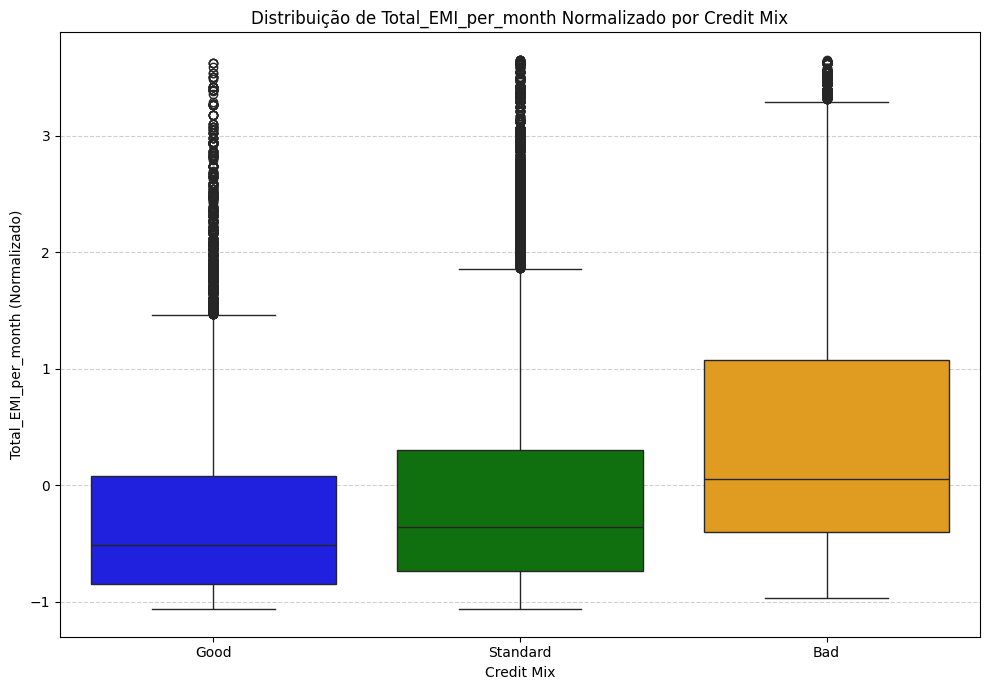

<ipython-input-30-2da736b22569>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Credit_Mix', y=atributo, data=df_train_filtered,


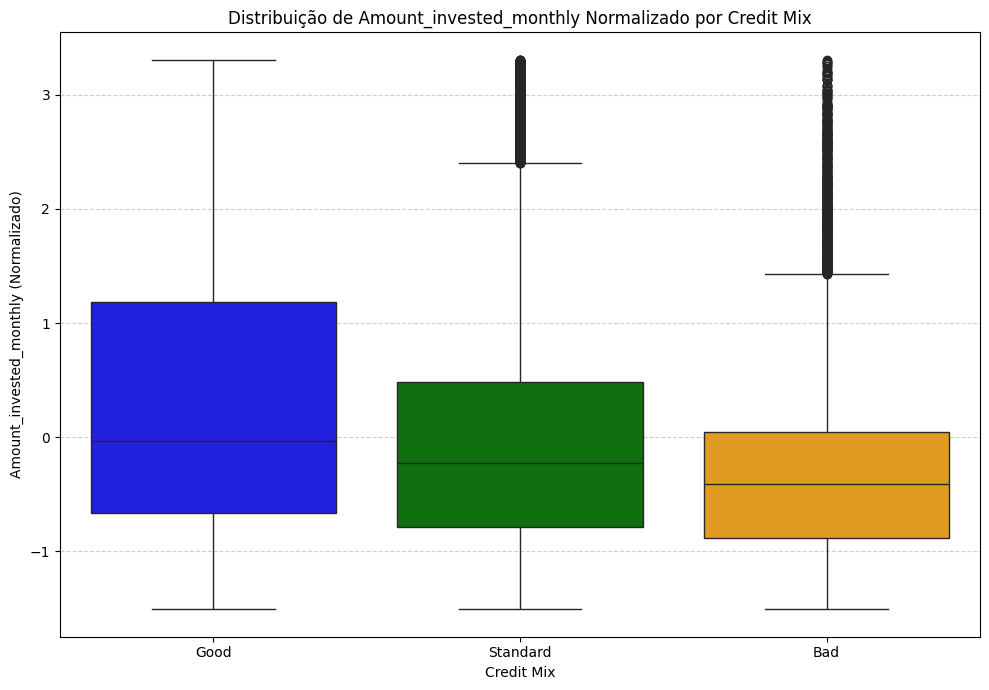

<ipython-input-30-2da736b22569>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Credit_Mix', y=atributo, data=df_train_filtered,


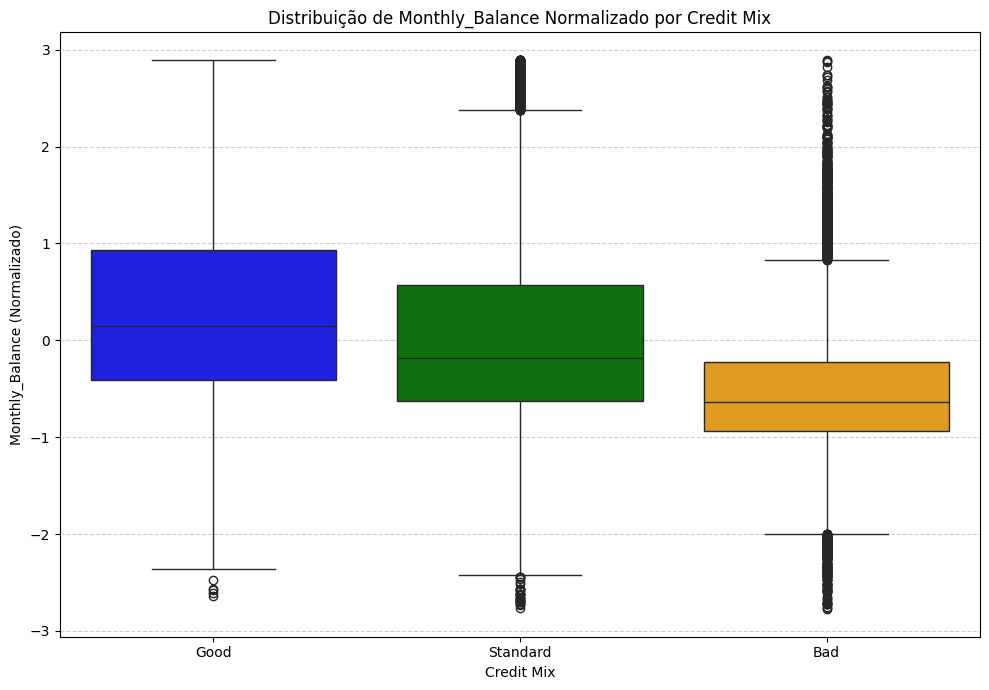

<ipython-input-30-2da736b22569>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Credit_Mix', y=atributo, data=df_train_filtered,


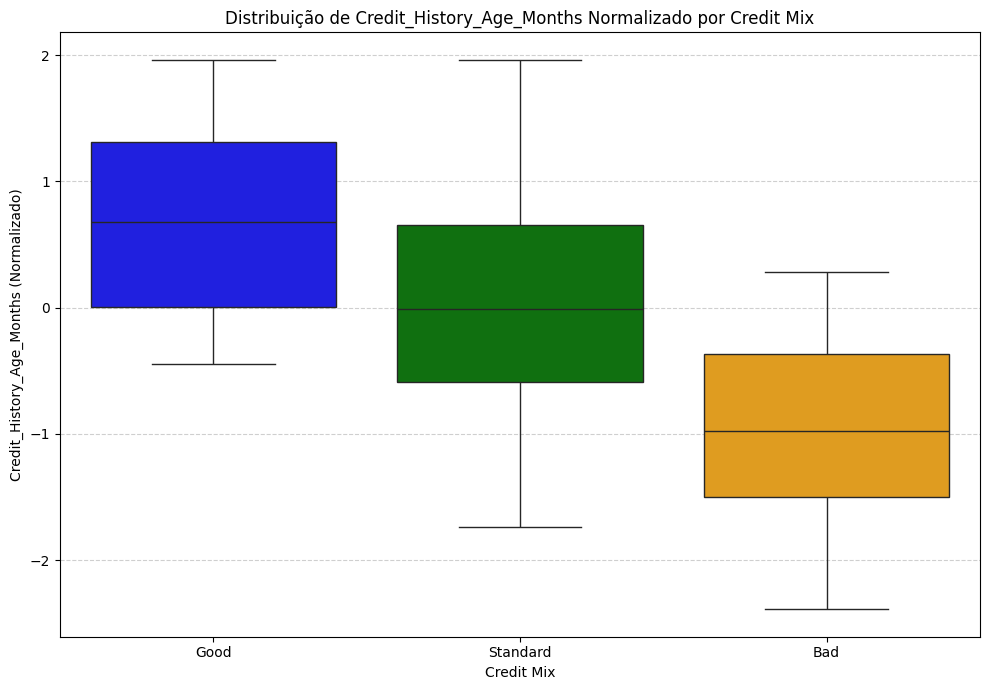


✅ Boxplots gerados para todos os atributos numéricos por Credit Mix.


In [ ]:
# Célula 22 (Gerando Boxplots por atributo numérico e Credit_Mix com dados tratados)

import seaborn as sns
import matplotlib.pyplot as plt

print("--- Gerando Boxplots para atributos numéricos por Credit_Mix (df_train_filtered) ---")

# Certifique-se de que 'colunas_numericas' está definida.
# Ela deve conter os nomes das colunas numéricas que foram normalizadas.
# Se você não tem 'colunas_numericas' definida, podemos listá-las a partir de X_train_encoded.
# No entanto, para boxplots, é melhor usar o DataFrame antes da codificação categórica,
# pois ele contém as colunas numéricas e a coluna Credit_Mix original.

# As colunas numéricas estão em X_train_encoded após a codificação Label Encoding,
# mas para plotar o boxplot com Credit_Mix, precisamos do df_train_filtered.
# Vamos pegar as colunas numéricas diretamente de df_train_filtered.

# Identificar as colunas numéricas em df_train_filtered
# Excluindo 'Credit_Mix' e 'Credit_Score' (se ainda estivesse lá)
colunas_numericas_para_boxplot = df_train_filtered.select_dtypes(include=['float64', 'int64']).columns.tolist()
if 'Credit_Score' in colunas_numericas_para_boxplot:
    colunas_numericas_para_boxplot.remove('Credit_Score') # Apenas para garantir que não plotamos o alvo antigo se ele fosse numérico.


# Iterar sobre as colunas numéricas e gerar um boxplot para cada uma
for atributo in colunas_numericas_para_boxplot:
    plt.figure(figsize=(10, 7)) # Ajuste o tamanho da figura para melhor visualização

    # Usamos df_train_filtered que já tem Credit_Mix filtrado e numéricos normalizados
    sns.boxplot(x='Credit_Mix', y=atributo, data=df_train_filtered,
                palette={'Good': 'blue', 'Bad': 'orange', 'Standard': 'green'}) # Mantendo cores consistentes

    plt.title(f'Distribuição de {atributo} Normalizado por Credit Mix')
    plt.xlabel('Credit Mix')
    plt.ylabel(f'{atributo} (Normalizado)')
    plt.grid(axis='y', linestyle='--', alpha=0.6) # Adiciona grade no eixo Y
    plt.tight_layout() # Ajusta o layout para evitar sobreposição
    plt.show()

print("\n✅ Boxplots gerados para todos os atributos numéricos por Credit Mix.")

--- Frequência da variável-alvo 'Credit_Mix' (y_train) ---
Credit_Mix
Standard    22352
Good        12285
Bad          9739
Name: count, dtype: int64


<ipython-input-31-1306e7508720>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=y_train, order=credit_mix_counts.index, palette='viridis') # 'viridis' é uma boa paleta para categorias


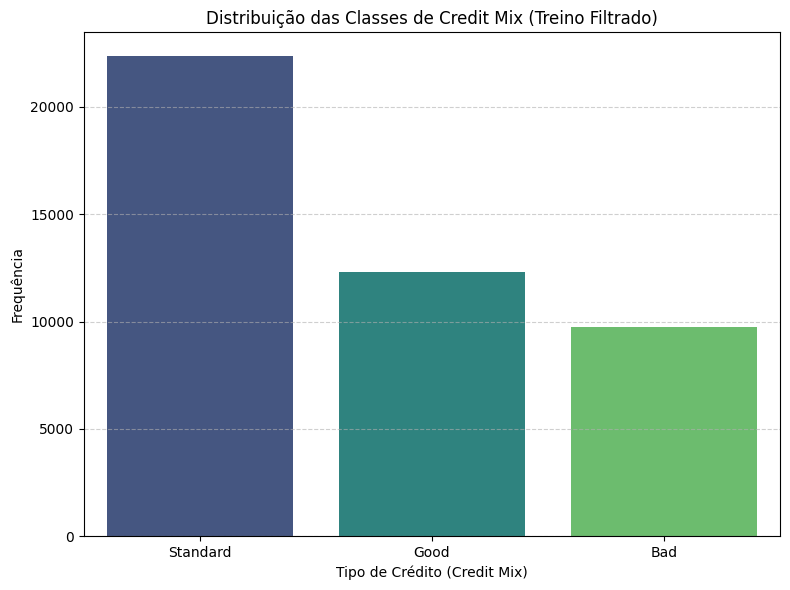


✅ Gráfico de frequência da variável-alvo Credit_Mix gerado com os dados filtrados de treino.


In [ ]:
# Célula 23 (Frequência da variável-alvo Credit_Mix após limpeza)

import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd # Garantir que pandas está importado

print("--- Frequência da variável-alvo 'Credit_Mix' (y_train) ---")

# Contagem de valores da variável alvo (y_train)
credit_mix_counts = y_train.value_counts()
print(credit_mix_counts)

# Criar um DataFrame temporário para o countplot (se necessário)
# Ou usar o Series diretamente com sns.countplot
plt.figure(figsize=(8, 6)) # Aumentar o tamanho da figura para melhor visualização

# sns.countplot pode usar a Series diretamente ou um DataFrame.
# Para manter a ordem de frequência, é melhor passar a Series diretamente.
sns.countplot(x=y_train, order=credit_mix_counts.index, palette='viridis') # 'viridis' é uma boa paleta para categorias

plt.title("Distribuição das Classes de Credit Mix (Treino Filtrado)")
plt.xlabel('Tipo de Crédito (Credit Mix)')
plt.ylabel('Frequência')
plt.grid(axis='y', linestyle='--', alpha=0.6) # Adiciona grade no eixo Y
plt.tight_layout() # Ajusta o layout para evitar sobreposição
plt.show()

print("\n✅ Gráfico de frequência da variável-alvo Credit_Mix gerado com os dados filtrados de treino.")

--- Gerando Matriz de Correlação das Features Numéricas (X_train_encoded) ---


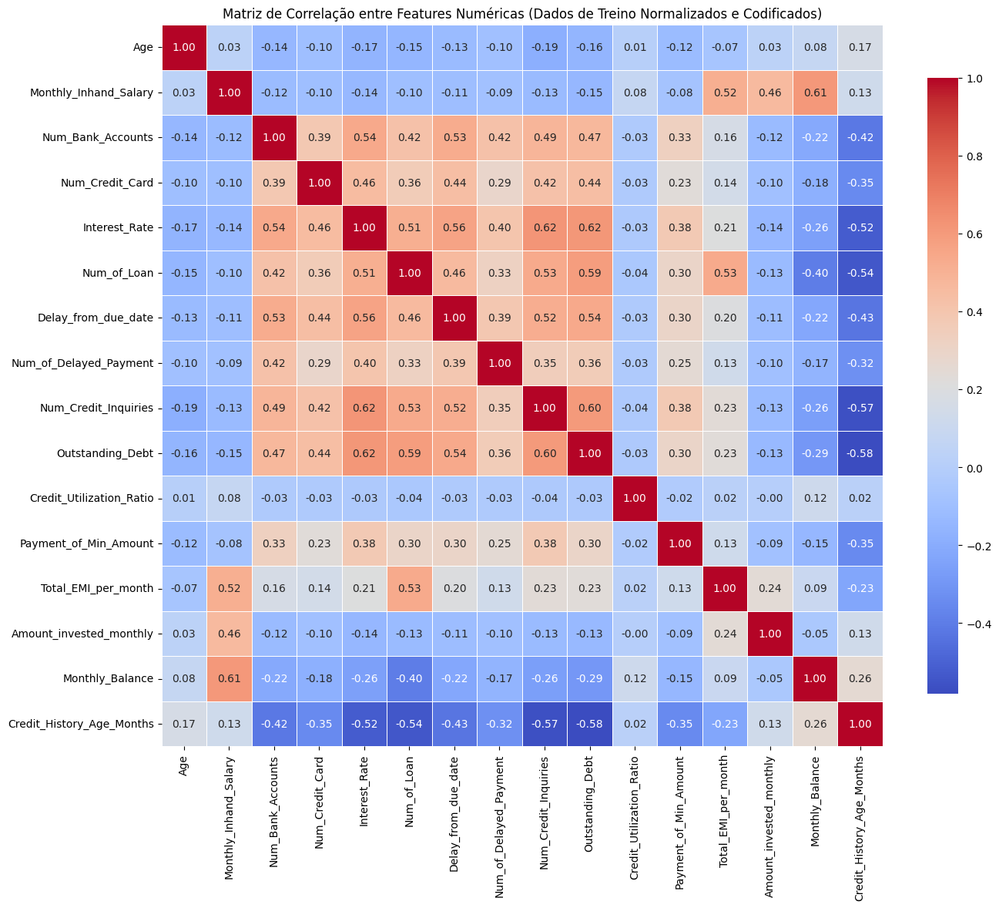


✅ Matriz de Correlação gerada para as features de treino tratadas.


In [ ]:
# Célula 24 (Criação e exibição da matriz de correlação das features numéricas tratadas)

import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd # Garantir que pandas está importado

print("--- Gerando Matriz de Correlação das Features Numéricas (X_train_encoded) ---")

# Calculando a matriz de correlação usando X_train_encoded
# X_train_encoded já contém todas as features numéricas (após normalização e Label Encoding)
corr_matrix = X_train_encoded.corr()

plt.figure(figsize=(14, 12)) # Mantém um bom tamanho para a visualização
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", square=True,
            linewidths=.5, cbar_kws={"shrink": .8}) # Adiciona linewidths e shrink para melhor visualização
plt.title('Matriz de Correlação entre Features Numéricas (Dados de Treino Normalizados e Codificados)')
plt.tight_layout()
plt.show()

print("\n✅ Matriz de Correlação gerada para as features de treino tratadas.")

In [ ]:
# # Célula 25 (Salvar os datasets pré-processados TEMPORARIAMENTE)

# import pandas as pd
# import os # Para verificar se o diretório existe

# print("--- Salvando os datasets pré-processados ---")

# # Criar um diretório para salvar os dados limpos, se ele não existir
# output_dir = 'processed_data'
# if not os.path.exists(output_dir):
#     os.makedirs(output_dir)
#     print(f"Diretório '{output_dir}' criado.")

# # Salvar X_train_encoded
# X_train_encoded_path = os.path.join(output_dir, 'X_train_encoded.csv')
# X_train_encoded.to_csv(X_train_encoded_path, index=False)
# print(f"X_train_encoded salvo em: {X_train_encoded_path}")

# # Salvar y_train
# # y_train é uma Series, podemos convertê-la para um DataFrame para salvar como CSV com um cabeçalho
# y_train_df = y_train.to_frame(name='Credit_Mix') # Nomear a coluna
# y_train_path = os.path.join(output_dir, 'y_train.csv')
# y_train_df.to_csv(y_train_path, index=False)
# print(f"y_train salvo em: {y_train_path}")

# # Salvar X_test_encoded
# X_test_encoded_path = os.path.join(output_dir, 'X_test_encoded.csv')
# X_test_encoded.to_csv(X_test_encoded_path, index=False)
# print(f"X_test_encoded salvo em: {X_test_encoded_path}")

# print("\n✅ Datasets pré-processados salvos com sucesso!")

# # Exemplo de como você carregaria esses dados mais tarde:
# # X_train_loaded = pd.read_csv(X_train_encoded_path)
# # y_train_loaded = pd.read_csv(y_train_path)['Credit_Mix'] # Carrega a coluna 'Credit_Mix' como Series
# # X_test_loaded = pd.read_csv(X_test_encoded_path)

In [ ]:
# Célula 25 (Salvar Conjuntos de Dados Pré-Processados)

import pandas as pd
import os

print("--- Salvando Conjuntos de Dados Pré-Processados ---")

# --- NOVIDADE: Definir o diretório base no Google Drive ---
# Certifique-se de que seu Google Drive já foi montado: drive.mount('/content/drive')
# Altere 'SeuProjetoML' para o nome da pasta do seu projeto no Drive.
base_output_dir = '/content/drive/MyDrive/PI5_CreditScoreClassification_CreditMix'

# Criar o diretório de dados processados dentro do diretório base do Drive
processed_data_dir = os.path.join(base_output_dir, 'processed_data')

if not os.path.exists(processed_data_dir):
    os.makedirs(processed_data_dir)
    print(f"Diretório '{processed_data_dir}' criado no Google Drive.")

# Salvar X_train_encoded
X_train_encoded_path = os.path.join(processed_data_dir, 'X_train_encoded.csv')
X_train_encoded.to_csv(X_train_encoded_path, index=False)
print(f"✅ X_train_encoded salvo em: {X_train_encoded_path}")

# Salvar y_train
y_train_path = os.path.join(processed_data_dir, 'y_train.csv')
y_train.to_csv(y_train_path, index=False)
print(f"✅ y_train salvo em: {y_train_path}")

# Salvar X_val (se definido e se você quiser salvá-lo para reuso)
# A Célula 26 divide X_train_encoded e y_train em X_train_internal, y_train_internal, X_val, y_val.
# Então X_val pode ser salvo aqui também, se desejar persistir esse split específico.
# if 'X_val' in locals() or 'X_val' in globals():
#    X_val_path = os.path.join(processed_data_dir, 'X_val.csv')
#    X_val.to_csv(X_val_path, index=False)
#    print(f"✅ X_val salvo em: {X_val_path}")
#
# if 'y_val' in locals() or 'y_val' in globals():
#    y_val_path = os.path.join(processed_data_dir, 'y_val.csv')
#    y_val.to_csv(y_val_path, index=False)
#    print(f"✅ y_val salvo em: {y_val_path}")


# Salvar X_test_encoded
X_test_encoded_path = os.path.join(processed_data_dir, 'X_test_encoded.csv')
X_test_encoded.to_csv(X_test_encoded_path, index=False)
print(f"✅ X_test_encoded salvo em: {X_test_encoded_path}")

print("\n✅ Todos os conjuntos de dados pré-processados salvos no Google Drive.")

--- Salvando Conjuntos de Dados Pré-Processados ---
✅ X_train_encoded salvo em: /content/drive/MyDrive/PI5_CreditScoreClassification_CreditMix/processed_data/X_train_encoded.csv
✅ y_train salvo em: /content/drive/MyDrive/PI5_CreditScoreClassification_CreditMix/processed_data/y_train.csv
✅ X_test_encoded salvo em: /content/drive/MyDrive/PI5_CreditScoreClassification_CreditMix/processed_data/X_test_encoded.csv

✅ Todos os conjuntos de dados pré-processados salvos no Google Drive.


In [ ]:
# # Célula 26 (Nova - Divisão do conjunto de treino em treino e validação para avaliação interna)

# import pandas as pd
# from sklearn.model_selection import train_test_split

# print("--- Dividindo X_train_encoded e y_train em Treino e Validação ---")

# # Criar novos conjuntos de treino e validação a partir do seu X_train_encoded e y_train existentes
# # Usamos 80% para o novo treino e 20% para validação
# # 'stratify=y_train' é crucial para manter a proporção das classes na divisão,
# # especialmente importante para classes desbalanceadas.
# X_train_internal, X_val, y_train_internal, y_val = train_test_split(
#     X_train_encoded, y_train, test_size=0.2, random_state=42, stratify=y_train
# )

# print(f"Formato do novo X_train_internal (para treinamento): {X_train_internal.shape}")
# print(f"Formato do novo y_train_internal (para treinamento): {y_train_internal.shape}")
# print(f"Formato do X_val (para avaliação interna): {X_val.shape}")
# print(f"Formato do y_val (rótulos reais para avaliação interna): {y_val.shape}")

# print("\n✅ Conjunto de treino dividido em treino (interno) e validação. Utilize X_train_internal, y_train_internal para treinamento/otimização e X_val, y_val para avaliação interna.")

In [ ]:
# Célula 26 (Divisão de Dados para Treinamento Interno e Validação)

from sklearn.model_selection import train_test_split
import pandas as pd # Certifique-se de importar pandas
import os # Certifique-se de importar os

print("--- Dividindo dados para Treinamento Interno e Validação ---")

# --- NOVIDADE: Definir o diretório base no Google Drive ---
# Certifique-se de que seu Google Drive já foi montado: drive.mount('/content/drive')
# Altere 'SeuProjetoML' para o nome da pasta do seu projeto no Drive.
base_output_dir = '/content/drive/MyDrive/PI5_CreditScoreClassification_CreditMix' # <<< Certifique-se que esta variável é a mesma usada na Célula 25
processed_data_dir = os.path.join(base_output_dir, 'processed_data')

# Criar o diretório de dados processados dentro do diretório base do Drive, se não existir
if not os.path.exists(processed_data_dir):
    os.makedirs(processed_data_dir)
    print(f"Diretório '{processed_data_dir}' criado no Google Drive (se não existia).")


# **Importante:** Se você já salvou X_train_encoded e y_train na Célula 25 no Drive,
# você pode carregá-los aqui se a sessão tiver caído antes desta célula.
# Caso contrário, X_train_encoded e y_train devem estar na memória das células anteriores.
if 'X_train_encoded' not in locals() and 'X_train_encoded' not in globals():
    print("X_train_encoded não encontrado na memória. Tentando carregar do Drive...")
    try:
        X_train_encoded_path = os.path.join(processed_data_dir, 'X_train_encoded.csv')
        y_train_path = os.path.join(processed_data_dir, 'y_train.csv')
        X_train_encoded = pd.read_csv(X_train_encoded_path)
        y_train = pd.read_csv(y_train_path).squeeze() # .squeeze() para garantir que y_train seja Series
        print("✅ X_train_encoded e y_train carregados com sucesso do Google Drive.")
    except FileNotFoundError:
        print("❌ Erro: Arquivos pré-processados não encontrados no Drive. Por favor, execute as células de pré-processamento.")
        raise # Levanta o erro para parar a execução

# Dividir o conjunto de treino (X_train_encoded, y_train) em
# um subconjunto para treinamento interno (X_train_internal, y_train_internal)
# e um subconjunto para validação (X_val, y_val).
# A validação cruzada do GridSearchCV será feita apenas em X_train_internal.
# A avaliação final do modelo otimizado será feita em X_val.

test_size_ratio = 0.2 # 20% dos dados de treino para validação
random_state_seed = 42 # Para reprodutibilidade

X_train_internal, X_val, y_train_internal, y_val = train_test_split(
    X_train_encoded, y_train, test_size=test_size_ratio, random_state=random_state_seed, stratify=y_train
)

print(f"Shape de X_train_internal: {X_train_internal.shape}")
print(f"Shape de y_train_internal: {y_train_internal.shape}")
print(f"Shape de X_val: {X_val.shape}")
print(f"Shape de y_val: {y_val.shape}")

# NOVIDADE: Salvar X_val e y_val no Google Drive para persistência
X_val_path = os.path.join(processed_data_dir, 'X_val.csv')
y_val_path = os.path.join(processed_data_dir, 'y_val.csv')

X_val.to_csv(X_val_path, index=False)
y_val.to_csv(y_val_path, index=False) # index=False para não salvar o índice

print(f"✅ X_val salvo em: {X_val_path}")
print(f"✅ y_val salvo em: {y_val_path}")

print("\n✅ Divisão de dados e salvamento concluídos.")

--- Dividindo dados para Treinamento Interno e Validação ---
Shape de X_train_internal: (35500, 16)
Shape de y_train_internal: (35500,)
Shape de X_val: (8876, 16)
Shape de y_val: (8876,)
✅ X_val salvo em: /content/drive/MyDrive/PI5_CreditScoreClassification_CreditMix/processed_data/X_val.csv
✅ y_val salvo em: /content/drive/MyDrive/PI5_CreditScoreClassification_CreditMix/processed_data/y_val.csv

✅ Divisão de dados e salvamento concluídos.


In [ ]:
# Célula 27 (Nova - Função para Treinar, Otimizar e Avaliar Modelos)

import pandas as pd
import time
import joblib
import os
from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier # Manter para referência/comparação
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns

# Dicionário para armazenar os melhores modelos de cada tipo
best_models = {}
# Dicionário para armazenar as métricas de validação de cada modelo para fácil comparação
model_performance_summary = {}

print("--- Preparando para Comparação e Otimização de Múltiplos Algoritmos ---")

def train_optimize_evaluate_model(model_name, estimator, param_grid,
                                  X_train_data, y_train_data, X_val_data, y_val_data,
                                  scoring_metric='f1_weighted', cv_folds=5):
    """
    Treina, otimiza hiperparâmetros, e avalia um modelo de classificação.

    Args:
        model_name (str): Nome do algoritmo (ex: 'RandomForest', 'LogisticRegression').
        estimator: Instância do estimador (modelo) Scikit-learn.
        param_grid (dict): Dicionário de hiperparâmetros para GridSearchCV.
        X_train_data (pd.DataFrame): Features do conjunto de treino interno.
        y_train_data (pd.Series): Rótulos do conjunto de treino interno.
        X_val_data (pd.DataFrame): Features do conjunto de validação.
        y_val_data (pd.Series): Rótulos reais do conjunto de validação.
        scoring_metric (str): Métrica de scoring para GridSearchCV (ex: 'f1_weighted').
        cv_folds (int): Número de folds para validação cruzada.

    Returns:
        tuple: (best_estimator, classification_report_str, confusion_matrix_plot)
    """
    print(f"\n===== Iniciando Processo para: {model_name} =====")

    grid_search = GridSearchCV(estimator=estimator,
                               param_grid=param_grid,
                               cv=cv_folds,
                               scoring=scoring_metric,
                               n_jobs=-1, # Use todos os núcleos disponíveis
                               verbose=1)

    # 1. Executar o Grid Search
    start_time = time.time()
    grid_search.fit(X_train_data, y_train_data)
    end_time = time.time()
    print(f"✅ Grid Search para {model_name} concluído em {end_time - start_time:.2f} segundos.")

    best_model = grid_search.best_estimator_
    print(f"\nMelhores Parâmetros Encontrados para {model_name}:")
    print(grid_search.best_params_)
    print(f"Melhor Pontuação ({scoring_metric} média da validação cruzada) para {model_name}:")
    print(grid_search.best_score_)

    # 2. Avaliar o melhor modelo no conjunto de validação
    print(f"\n--- Avaliando {model_name} no Conjunto de VALIDAÇÃO ---")
    y_pred_val = best_model.predict(X_val_data)

    report = classification_report(y_val_data, y_pred_val, output_dict=True) # output_dict para extrair métricas facilmente
    print("\nRelatório de Classificação Detalhado no Conjunto de Validação:")
    print(classification_report(y_val_data, y_pred_val))

    cm = confusion_matrix(y_val_data, y_pred_val)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=best_model.classes_,
                yticklabels=best_model.classes_)
    plt.xlabel('Previsto')
    plt.ylabel('Verdadeiro')
    plt.title(f'Matriz de Confusão: {model_name}')
    plt.show()

    accuracy = accuracy_score(y_val_data, y_pred_val)
    print(f"\nAcurácia de {model_name} no Conjunto de Validação: {accuracy:.4f}")

    # Armazenar o melhor modelo e as métricas para comparação futura
    best_models[model_name] = best_model
    model_performance_summary[model_name] = {
        'best_params': grid_search.best_params_,
        'cv_score': grid_search.best_score_,
        'val_accuracy': accuracy,
        'val_f1_weighted': report['weighted avg']['f1-score'],
        'val_precision_weighted': report['weighted avg']['precision'],
        'val_recall_weighted': report['weighted avg']['recall'],
        'val_f1_bad': report['Bad']['f1-score'], # Métrica importante para a classe 'Bad'
        'val_recall_bad': report['Bad']['recall']
    }

    print(f"===== {model_name} Concluído =====")
    return best_model # Retornar o melhor modelo treinado para uso posterior

print("\n✅ Função 'train_optimize_evaluate_model' definida. Pronto para testar modelos.")

--- Preparando para Comparação e Otimização de Múltiplos Algoritmos ---

✅ Função 'train_optimize_evaluate_model' definida. Pronto para testar modelos.


--- Iniciando Processo para: RandomForest ---

===== Iniciando Processo para: RandomForest =====
Fitting 5 folds for each of 72 candidates, totalling 360 fits
✅ Grid Search para RandomForest concluído em 2100.19 segundos.

Melhores Parâmetros Encontrados para RandomForest:
{'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 150}
Melhor Pontuação (f1_weighted média da validação cruzada) para RandomForest:
0.9696704620468131

--- Avaliando RandomForest no Conjunto de VALIDAÇÃO ---

Relatório de Classificação Detalhado no Conjunto de Validação:
              precision    recall  f1-score   support

         Bad       0.96      0.99      0.97      1948
        Good       0.97      0.98      0.97      2457
    Standard       0.98      0.96      0.97      4471

    accuracy                           0.97      8876
   macro avg       0.97      0.98      0.97      8876
weighted avg       0.97      0.97      0.97      8876



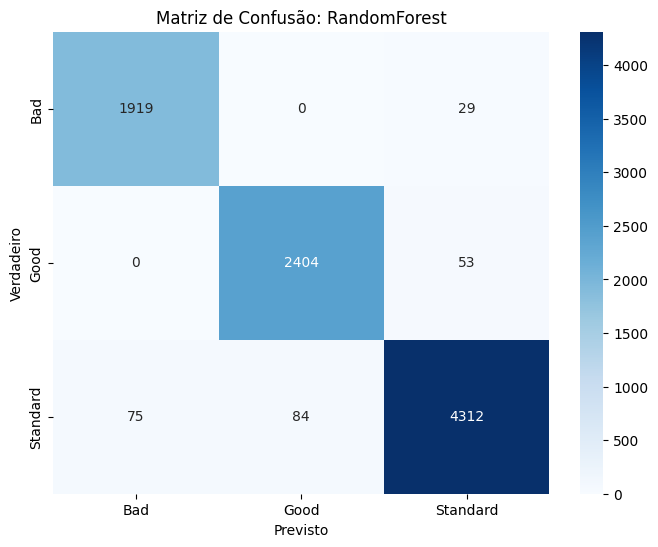


Acurácia de RandomForest no Conjunto de Validação: 0.9728
===== RandomForest Concluído =====

--- RandomForest Concluída ---


In [ ]:
# EX: Nova Célula 27.5 (Otimização e Avaliação: Random Forest - RF)
# Se você quiser que o RF seja parte da comparação sistemática

from sklearn.ensemble import RandomForestClassifier

print("--- Iniciando Processo para: RandomForest ---")

rf_param_grid = {
    'n_estimators': [50, 100, 150], # Número de árvores
    'max_depth': [10, 20, None],   # Profundidade máxima da árvore
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'max_features': ['sqrt', 'log2']
}

rf_estimator = RandomForestClassifier(random_state=42, n_jobs=-1)

best_rf_model = train_optimize_evaluate_model(
    model_name='RandomForest', # IMPORTANTE: Use este nome para que a Célula 36 o encontre!
    estimator=rf_estimator,
    param_grid=rf_param_grid,
    X_train_data=X_train_internal,
    y_train_data=y_train_internal,
    X_val_data=X_val,
    y_val_data=y_val
)

print("\n--- RandomForest Concluída ---")


===== Iniciando Processo para: LogisticRegression =====
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:1271: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn(


✅ Grid Search para LogisticRegression concluído em 16.19 segundos.

Melhores Parâmetros Encontrados para LogisticRegression:
{'C': 10.0, 'penalty': 'l2', 'solver': 'liblinear'}
Melhor Pontuação (f1_weighted média da validação cruzada) para LogisticRegression:
0.8591088842383444

--- Avaliando LogisticRegression no Conjunto de VALIDAÇÃO ---

Relatório de Classificação Detalhado no Conjunto de Validação:
              precision    recall  f1-score   support

         Bad       0.86      0.82      0.84      1948
        Good       0.86      0.88      0.87      2457
    Standard       0.86      0.86      0.86      4471

    accuracy                           0.86      8876
   macro avg       0.86      0.86      0.86      8876
weighted avg       0.86      0.86      0.86      8876



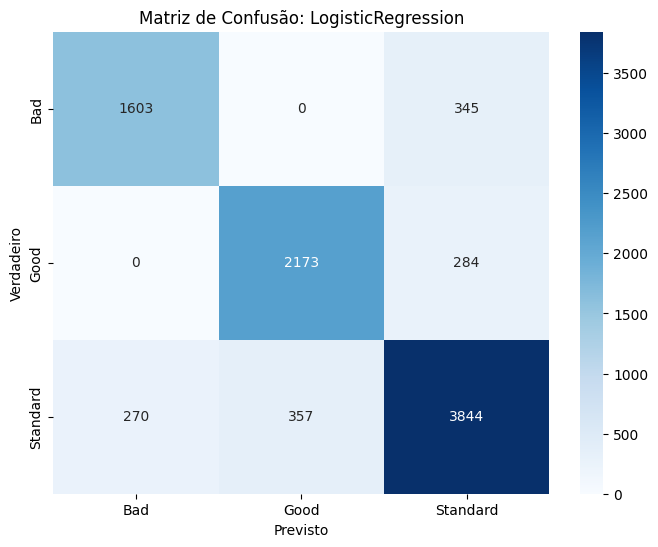


Acurácia de LogisticRegression no Conjunto de Validação: 0.8585
===== LogisticRegression Concluído =====


In [ ]:
# Célula 28 (Otimização e Avaliação: Regressão Logística - LR)

# Definir a grade de parâmetros para Regressão Logística
# Cuidado: a otimização de LR pode ser sensível ao solver e max_iter
lr_param_grid = {
    'penalty': ['l1', 'l2'], # Tipo de regularização
    'C': [0.1, 1.0, 10.0],   # Força inversa da regularização (menor C = mais regularização)
    'solver': ['liblinear']  # 'liblinear' suporta 'l1' e 'l2'
}

# Inicializar o estimador
lr_estimator = LogisticRegression(random_state=42, max_iter=500, n_jobs=-1) # Aumentei max_iter para convergência

# Chamar a função para treinar, otimizar e avaliar
best_lr_model = train_optimize_evaluate_model(
    model_name='LogisticRegression',
    estimator=lr_estimator,
    param_grid=lr_param_grid,
    X_train_data=X_train_internal,
    y_train_data=y_train_internal,
    X_val_data=X_val,
    y_val_data=y_val
)


===== Iniciando Processo para: LDA =====
Fitting 5 folds for each of 2 candidates, totalling 10 fits
✅ Grid Search para LDA concluído em 1.64 segundos.

Melhores Parâmetros Encontrados para LDA:
{'solver': 'lsqr'}
Melhor Pontuação (f1_weighted média da validação cruzada) para LDA:
0.8597781533098466

--- Avaliando LDA no Conjunto de VALIDAÇÃO ---

Relatório de Classificação Detalhado no Conjunto de Validação:
              precision    recall  f1-score   support

         Bad       0.82      0.92      0.87      1948
        Good       0.85      0.87      0.86      2457
    Standard       0.88      0.83      0.85      4471

    accuracy                           0.86      8876
   macro avg       0.85      0.87      0.86      8876
weighted avg       0.86      0.86      0.86      8876



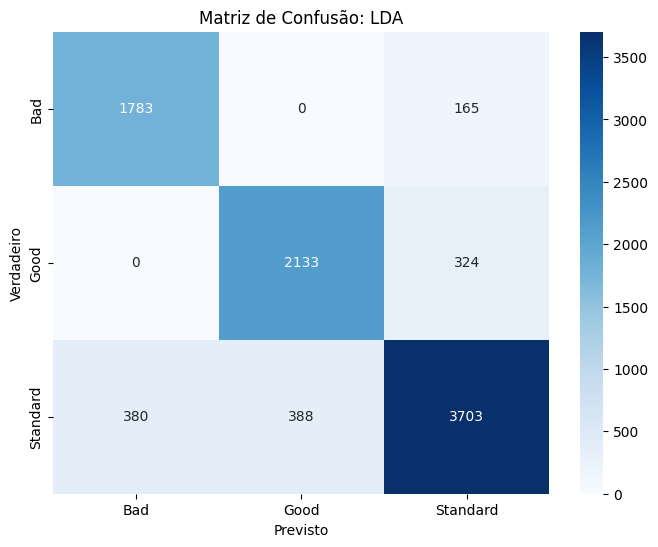


Acurácia de LDA no Conjunto de Validação: 0.8584
===== LDA Concluído =====


In [ ]:
# Célula 29 (Otimização e Avaliação: Análise Linear Discriminante - LDA)

# Definir a grade de parâmetros para LDA (poucos parâmetros comuns para otimizar)
# solver='svd' não aceita shrinkage
# solver='lsqr' ou 'eigen' aceitam shrinkage
lda_param_grid = {
    'solver': ['svd', 'lsqr'], # Métodos de solução
    # 'shrinkage': [None, 0.0, 0.5, 1.0] # Para 'lsqr' ou 'eigen'
}
# Para usar shrinkage, precisaríamos fazer uma lógica condicional no param_grid
# ou testar separadamente se o solver não suporta.
# Por simplicidade inicial, vamos testar apenas solvers.

# Inicializar o estimador
lda_estimator = LinearDiscriminantAnalysis()

# Chamar a função para treinar, otimizar e avaliar
best_lda_model = train_optimize_evaluate_model(
    model_name='LDA',
    estimator=lda_estimator,
    param_grid=lda_param_grid,
    X_train_data=X_train_internal,
    y_train_data=y_train_internal,
    X_val_data=X_val,
    y_val_data=y_val
)


===== Iniciando Processo para: KNN =====
Fitting 5 folds for each of 16 candidates, totalling 80 fits
✅ Grid Search para KNN concluído em 208.97 segundos.

Melhores Parâmetros Encontrados para KNN:
{'metric': 'manhattan', 'n_neighbors': 3, 'weights': 'distance'}
Melhor Pontuação (f1_weighted média da validação cruzada) para KNN:
0.9656814956209384

--- Avaliando KNN no Conjunto de VALIDAÇÃO ---

Relatório de Classificação Detalhado no Conjunto de Validação:
              precision    recall  f1-score   support

         Bad       0.98      0.99      0.98      1948
        Good       0.97      0.98      0.97      2457
    Standard       0.98      0.97      0.98      4471

    accuracy                           0.98      8876
   macro avg       0.97      0.98      0.98      8876
weighted avg       0.98      0.98      0.98      8876



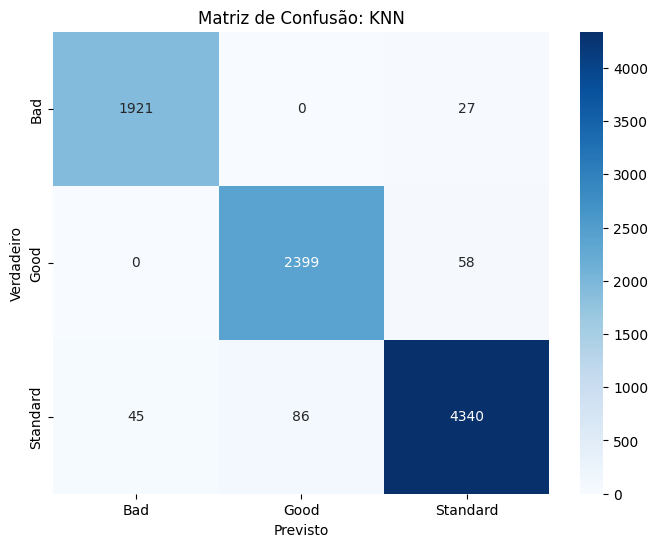


Acurácia de KNN no Conjunto de Validação: 0.9757
===== KNN Concluído =====


In [ ]:
# Célula 30 (Otimização e Avaliação: K-Nearest Neighbors - KNN)

from sklearn.neighbors import KNeighborsClassifier

knn_param_grid = {
    'n_neighbors': [3, 5, 7, 9], # Número de vizinhos
    'weights': ['uniform', 'distance'], # Como ponderar os vizinhos
    'metric': ['euclidean', 'manhattan'] # Métrica de distância
}

knn_estimator = KNeighborsClassifier(n_jobs=-1)

best_knn_model = train_optimize_evaluate_model(
    model_name='KNN',
    estimator=knn_estimator,
    param_grid=knn_param_grid,
    X_train_data=X_train_internal,
    y_train_data=y_train_internal,
    X_val_data=X_val,
    y_val_data=y_val
)

--- Iniciando Processo para: Decision Tree ---

===== Iniciando Processo para: DecisionTree =====
Fitting 5 folds for each of 72 candidates, totalling 360 fits
✅ Grid Search para DecisionTree concluído em 115.55 segundos.

Melhores Parâmetros Encontrados para DecisionTree:
{'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2}
Melhor Pontuação (f1_weighted média da validação cruzada) para DecisionTree:
0.946984871876024

--- Avaliando DecisionTree no Conjunto de VALIDAÇÃO ---

Relatório de Classificação Detalhado no Conjunto de Validação:
              precision    recall  f1-score   support

         Bad       0.95      0.95      0.95      1948
        Good       0.95      0.95      0.95      2457
    Standard       0.95      0.95      0.95      4471

    accuracy                           0.95      8876
   macro avg       0.95      0.95      0.95      8876
weighted avg       0.95      0.95      0.95      8876



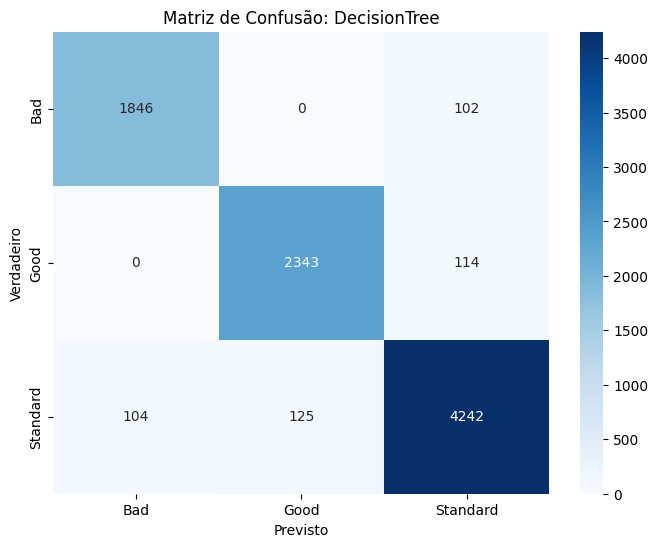


Acurácia de DecisionTree no Conjunto de Validação: 0.9499
===== DecisionTree Concluído =====

--- Decision Tree Concluída ---


In [ ]:
# Célula 31 (Otimização e Avaliação: Árvore de Classificação - Decision Tree)

from sklearn.tree import DecisionTreeClassifier

print("--- Iniciando Processo para: Decision Tree ---")

# Definir a grade de parâmetros para Árvore de Classificação
dt_param_grid = {
    'max_depth': [5, 10, 15, None], # Profundidade máxima da árvore
    'min_samples_split': [2, 5, 10], # Mínimo de amostras para dividir um nó
    'min_samples_leaf': [1, 2, 4],   # Mínimo de amostras em uma folha
    'criterion': ['gini', 'entropy'] # Função para medir a qualidade de uma divisão
}

# Inicializar o estimador
dt_estimator = DecisionTreeClassifier(random_state=42)

# Chamar a função para treinar, otimizar e avaliar
best_dt_model = train_optimize_evaluate_model(
    model_name='DecisionTree',
    estimator=dt_estimator,
    param_grid=dt_param_grid,
    X_train_data=X_train_internal,
    y_train_data=y_train_internal,
    X_val_data=X_val,
    y_val_data=y_val
)

print("\n--- Decision Tree Concluída ---")

--- Iniciando Processo para: Gaussian Naive Bayes ---

===== Iniciando Processo para: GaussianNB =====
Fitting 5 folds for each of 5 candidates, totalling 25 fits
✅ Grid Search para GaussianNB concluído em 3.89 segundos.

Melhores Parâmetros Encontrados para GaussianNB:
{'var_smoothing': 1e-09}
Melhor Pontuação (f1_weighted média da validação cruzada) para GaussianNB:
0.8652721817355069

--- Avaliando GaussianNB no Conjunto de VALIDAÇÃO ---

Relatório de Classificação Detalhado no Conjunto de Validação:
              precision    recall  f1-score   support

         Bad       0.79      0.96      0.87      1948
        Good       0.83      0.95      0.89      2457
    Standard       0.95      0.78      0.86      4471

    accuracy                           0.87      8876
   macro avg       0.86      0.90      0.87      8876
weighted avg       0.88      0.87      0.87      8876



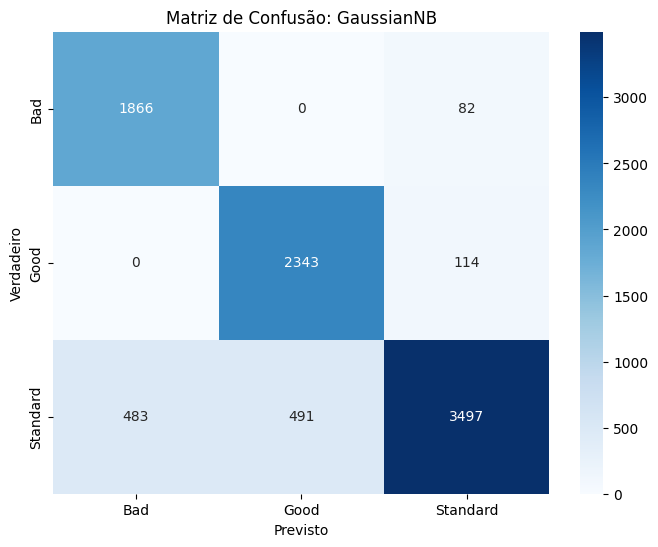


Acurácia de GaussianNB no Conjunto de Validação: 0.8682
===== GaussianNB Concluído =====

--- Gaussian Naive Bayes Concluído ---


In [ ]:
# Célula 32 (Otimização e Avaliação: Gaussian Naive Bayes - NB)

from sklearn.naive_bayes import GaussianNB

print("--- Iniciando Processo para: Gaussian Naive Bayes ---")

# Definir a grade de parâmetros para Gaussian Naive Bayes
# O principal parâmetro é var_smoothing (Laplace smoothing)
nb_param_grid = {
    'var_smoothing': [1e-9, 1e-8, 1e-7, 1e-6, 1e-5] # Adiciona uma pequena porção ao desvio padrão para evitar divisão por zero
}

# Inicializar o estimador
nb_estimator = GaussianNB()

# Chamar a função para treinar, otimizar e avaliar
best_nb_model = train_optimize_evaluate_model(
    model_name='GaussianNB',
    estimator=nb_estimator,
    param_grid=nb_param_grid,
    X_train_data=X_train_internal,
    y_train_data=y_train_internal,
    X_val_data=X_val,
    y_val_data=y_val
)

print("\n--- Gaussian Naive Bayes Concluído ---")

--- Iniciando Processo para: Support Vector Machines (SVM) ---

===== Iniciando Processo para: SVM =====
Fitting 5 folds for each of 4 candidates, totalling 20 fits


/usr/local/lib/python3.11/dist-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


✅ Grid Search para SVM concluído em 1789.08 segundos.

Melhores Parâmetros Encontrados para SVM:
{'C': 1, 'kernel': 'rbf'}
Melhor Pontuação (f1_weighted média da validação cruzada) para SVM:
0.9116229650147071

--- Avaliando SVM no Conjunto de VALIDAÇÃO ---

Relatório de Classificação Detalhado no Conjunto de Validação:
              precision    recall  f1-score   support

         Bad       0.89      0.95      0.92      1948
        Good       0.91      0.91      0.91      2457
    Standard       0.93      0.90      0.91      4471

    accuracy                           0.91      8876
   macro avg       0.91      0.92      0.92      8876
weighted avg       0.92      0.91      0.91      8876



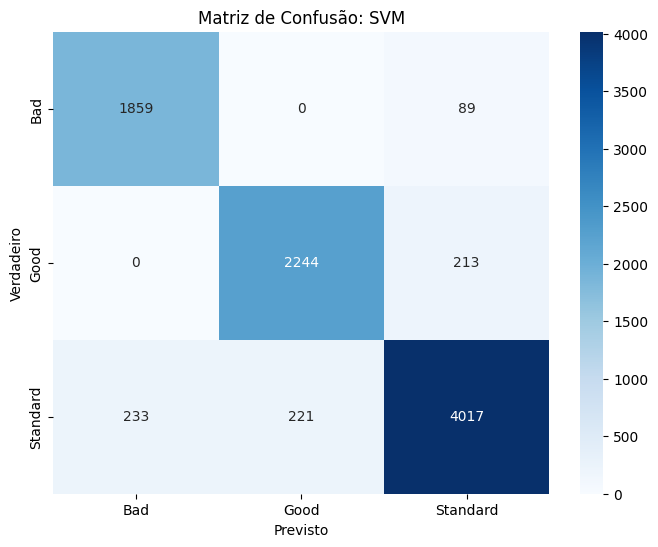


Acurácia de SVM no Conjunto de Validação: 0.9148
===== SVM Concluído =====

--- SVM Concluído ---


In [ ]:
# Célula 33 (Otimização e Avaliação: Support Vector Machines - SVM)

from sklearn.svm import SVC

print("--- Iniciando Processo para: Support Vector Machines (SVM) ---")

# Definir a grade de parâmetros para SVM
# Cuidado: SVM com GridSearch pode ser MUITO LENTO para datasets grandes.
# Comece com grids pequenos e refine se necessário.
svm_param_grid = {
    'C': [0.1, 1], # Parâmetro de regularização (menor C = mais regularização)
    'kernel': ['linear', 'rbf'], # Tipo de kernel (linear para linear, rbf para não-linear)
    # 'gamma': ['scale', 'auto'] # Coeficiente do kernel para 'rbf', 'poly' e 'sigmoid'
}
# Para 'rbf', 'gamma' também é importante. Adicione 'gamma': ['scale', 'auto'] se quiser.
# Mas para o primeiro teste, vamos manter menor.

# Inicializar o estimador
# SVC não tem n_jobs para paralelização, ele é single-threaded por padrão.
# Você pode usar um wrapper como 'joblib.parallel.Parallel' se precisar de paralelização com 'n_jobs'.
svm_estimator = SVC(random_state=42, probability=True) # probability=True para poder usar predict_proba se precisar

# Chamar a função para treinar, otimizar e avaliar
# O SVM pode demorar MUITO MAIS que os outros. Esteja preparado.
best_svm_model = train_optimize_evaluate_model(
    model_name='SVM',
    estimator=svm_estimator,
    param_grid=svm_param_grid,
    X_train_data=X_train_internal,
    y_train_data=y_train_internal,
    X_val_data=X_val,
    y_val_data=y_val
)

print("\n--- SVM Concluído ---")

In [ ]:
# Célula 34 (Resumo de Desempenho dos Modelos)

import pandas as pd
import os

print("--- Resumo de Desempenho dos Modelos no Conjunto de Validação ---")

# --- NOVIDADE: Definir o diretório base no Google Drive ---
# Certifique-se de que seu Google Drive já foi montado: drive.mount('/content/drive')
base_output_dir = '/content/drive/MyDrive/PI5_CreditScoreClassification_CreditMix' # <<< CONSISTÊNCIA
output_performance_dir = os.path.join(base_output_dir, 'model_performance') # Nova pasta

if not os.path.exists(output_performance_dir):
    os.makedirs(output_performance_dir)
    print(f"Diretório '{output_performance_dir}' criado no Google Drive.")

if model_performance_summary: # Verifica se o dicionário não está vazio
    # Converte o dicionário em um DataFrame para uma visualização mais organizada
    performance_df = pd.DataFrame.from_dict(model_performance_summary, orient='index')

    # Ordena o DataFrame pela métrica de interesse (ex: 'val_f1_weighted' ou 'val_accuracy')
    # Random Forest geralmente será o primeiro se mantiver o desempenho superior
    performance_df = performance_df.sort_values(by='val_f1_weighted', ascending=False)

    print(performance_df.round(4)) # Exibe com 4 casas decimais para clareza

    # --- NOVIDADE: Salvar o DataFrame em um arquivo CSV ---
    performance_csv_path = os.path.join(output_performance_dir, 'model_performance_summary.csv')
    performance_df.to_csv(performance_csv_path, index=True) # index=True para salvar os nomes dos modelos como índice
    print(f"\n✅ Resumo de desempenho dos modelos salvo em: {performance_csv_path}")

else:
    print("O dicionário 'model_performance_summary' está vazio. Certifique-se de que a Célula 27 e pelo menos um modelo (Células 28, 29, etc.) foram executados.")

print("\n--- Modelos Otimizados Salvos em 'best_models' ---")
print(best_models.keys()) # Mostra os nomes dos modelos que foram treinados e salvos

--- Resumo de Desempenho dos Modelos no Conjunto de Validação ---
                                                          best_params  \
KNN                 {'metric': 'manhattan', 'n_neighbors': 3, 'wei...   
RandomForest        {'max_depth': None, 'max_features': 'sqrt', 'm...   
DecisionTree        {'criterion': 'entropy', 'max_depth': None, 'm...   
SVM                                         {'C': 1, 'kernel': 'rbf'}   
GaussianNB                                   {'var_smoothing': 1e-09}   
LogisticRegression  {'C': 10.0, 'penalty': 'l2', 'solver': 'liblin...   
LDA                                                {'solver': 'lsqr'}   

                    cv_score  val_accuracy  val_f1_weighted  \
KNN                   0.9657        0.9757           0.9757   
RandomForest          0.9697        0.9728           0.9728   
DecisionTree          0.9470        0.9499           0.9499   
SVM                   0.9116        0.9148           0.9148   
GaussianNB            0.8653      

In [ ]:
# Célula 35 (Salvar Todos os Modelos Otimizados no Disco)

import joblib
import os

print("--- Salvando todos os Modelos Otimizados no Disco ---")

# --- NOVIDADE: Definir o diretório base no Google Drive ---
# Certifique-se de que seu Google Drive já foi montado: drive.mount('/content/drive')
base_output_dir = '/content/drive/MyDrive/PI5_CreditScoreClassification_CreditMix' # <<< CONSISTÊNCIA: Use o mesmo caminho base que nas outras células
output_model_dir = os.path.join(base_output_dir, 'trained_models')

# Certificar-se de que o diretório existe
if not os.path.exists(output_model_dir):
    os.makedirs(output_model_dir)
    print(f"Diretório '{output_model_dir}' criado no Google Drive (se não existia).")

# Verificar se o dicionário best_models está populado
if not best_models:
    print("⚠️ Aviso: O dicionário 'best_models' está vazio. Certifique-se de que as células de treinamento de modelo (28, 29, etc.) foram executadas.")
else:
    for model_name, model_object in best_models.items():
        # Construir o nome do arquivo de forma consistente
        # Ex: 'randomforest_optimized_model.pkl', 'logisticregression_optimized_model.pkl'
        model_filename = os.path.join(output_model_dir, f'{model_name.lower().replace(" ", "_")}_optimized_model.pkl')

        try:
            joblib.dump(model_object, model_filename)
            print(f"✅ Modelo '{model_name}' salvo em: {model_filename}")
        except Exception as e:
            print(f"❌ Erro ao salvar o modelo '{model_name}': {e}")

print("\n--- Processo de salvamento de modelos concluído ---")

--- Salvando todos os Modelos Otimizados no Disco ---
✅ Modelo 'RandomForest' salvo em: /content/drive/MyDrive/PI5_CreditScoreClassification_CreditMix/trained_models/randomforest_optimized_model.pkl
✅ Modelo 'LogisticRegression' salvo em: /content/drive/MyDrive/PI5_CreditScoreClassification_CreditMix/trained_models/logisticregression_optimized_model.pkl
✅ Modelo 'LDA' salvo em: /content/drive/MyDrive/PI5_CreditScoreClassification_CreditMix/trained_models/lda_optimized_model.pkl
✅ Modelo 'KNN' salvo em: /content/drive/MyDrive/PI5_CreditScoreClassification_CreditMix/trained_models/knn_optimized_model.pkl
✅ Modelo 'DecisionTree' salvo em: /content/drive/MyDrive/PI5_CreditScoreClassification_CreditMix/trained_models/decisiontree_optimized_model.pkl
✅ Modelo 'GaussianNB' salvo em: /content/drive/MyDrive/PI5_CreditScoreClassification_CreditMix/trained_models/gaussiannb_optimized_model.pkl
✅ Modelo 'SVM' salvo em: /content/drive/MyDrive/PI5_CreditScoreClassification_CreditMix/trained_models/s

--- Analisando a Importância das Features do Modelo Random Forest ---
✅ Melhor modelo Random Forest recuperado do dicionário 'best_models'.
✅ Nomes das features obtidos de X_train_internal.

Importância das Features (Ordenado):
                      Feature  Importance
4               Interest_Rate    0.160855
11      Payment_of_Min_Amount    0.138471
9            Outstanding_Debt    0.128680
7      Num_of_Delayed_Payment    0.125486
2           Num_Bank_Accounts    0.115124
6         Delay_from_due_date    0.106358
5                 Num_of_Loan    0.045981
3             Num_Credit_Card    0.032322
8        Num_Credit_Inquiries    0.029792
15  Credit_History_Age_Months    0.029554
12        Total_EMI_per_month    0.018047
1       Monthly_Inhand_Salary    0.016293
0                         Age    0.015588
13    Amount_invested_monthly    0.015005
14            Monthly_Balance    0.012073
10   Credit_Utilization_Ratio    0.010370


<ipython-input-49-8a53a083f380>:82: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='Feature', data=importance_df, palette='viridis')


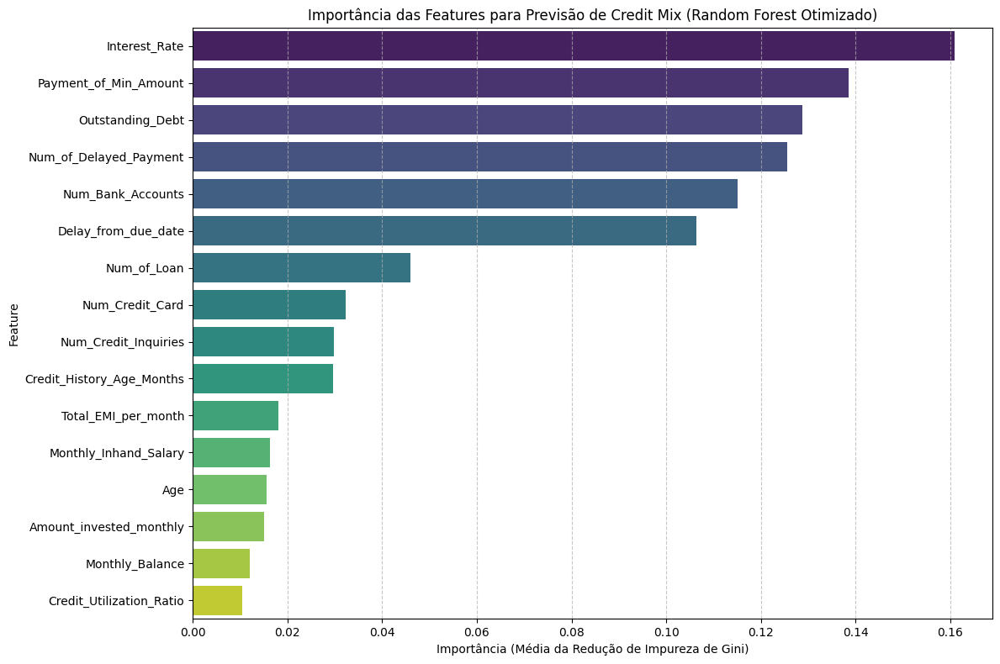


✅ Análise de importância de features concluída.


In [ ]:
# Célula 36 (Análise de Importância de Features do Modelo Random Forest Otimizado)

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import joblib # Para carregar o modelo como fallback, se necessário

print("--- Analisando a Importância das Features do Modelo Random Forest ---")

# --- Definir o diretório base no Google Drive ---
# Certifique-se de que seu Google Drive já foi montado: drive.mount('/content/drive')
base_output_dir = '/content/drive/MyDrive/PI5_CreditScoreClassification' # <<< CONSISTÊNCIA
processed_data_dir = os.path.join(base_output_dir, 'processed_data')
trained_models_dir = os.path.join(base_output_dir, 'trained_models') # Onde o modelo RF foi/será salvo

# 1. Obter o melhor modelo Random Forest
best_random_forest_model = None
feature_importances = None

# PRIORIDADE 1: Tentar obter o modelo do dicionário 'best_models'
if 'best_models' in globals() and 'RandomForest' in best_models:
    best_random_forest_model = best_models['RandomForest']
    print("✅ Melhor modelo Random Forest recuperado do dicionário 'best_models'.")
# PRIORIDADE 2: Fallback - Tentar carregar o modelo salvo no Google Drive
elif os.path.exists(os.path.join(trained_models_dir, 'randomforest_optimized_model.pkl')):
    try:
        model_path = os.path.join(trained_models_dir, 'randomforest_optimized_model.pkl')
        best_random_forest_model = joblib.load(model_path)
        print(f"✅ Melhor modelo Random Forest carregado do arquivo: {model_path}")
    except Exception as e:
        print(f"❌ Erro ao carregar o modelo Random Forest do arquivo: {e}")
else:
    print("❌ Aviso: O modelo 'RandomForest' não foi encontrado no dicionário 'best_models' nem no disco.")
    print("Por favor, certifique-se de que o Random Forest foi treinado usando 'model_name='RandomForest'' na Célula 27.5 e que ele foi salvo (Célula 35).")
    raise RuntimeError("Random Forest Model not found. Cannot perform feature importance analysis.")


# Agora que temos best_random_forest_model, extraímos as importâncias
if best_random_forest_model: # Verifica se o modelo foi carregado com sucesso
    feature_importances = best_random_forest_model.feature_importances_
else: # Este else só será atingido se o raise acima não for executado, mas o modelo ainda é None
    raise RuntimeError("Random Forest Model is not available after loading attempts. Cannot perform feature importance analysis.")


# 2. Obter os nomes das features
feature_names = None
# Priorizar X_train_internal, depois X_train_encoded, depois carregar X_train_encoded do Drive
if 'X_train_internal' in locals() or 'X_train_internal' in globals():
    feature_names = X_train_internal.columns
    print("✅ Nomes das features obtidos de X_train_internal.")
elif 'X_train_encoded' in locals() or 'X_train_encoded' in globals():
    feature_names = X_train_encoded.columns
    print("✅ Nomes das features obtidos de X_train_encoded.")
else:
    # Tentar carregar X_train_encoded se não estiver na memória
    print("Nenhum DataFrame de treino encontrado na memória. Tentando carregar X_train_encoded do Drive para nomes das features...")
    try:
        X_train_encoded_path = os.path.join(processed_data_dir, 'X_train_encoded.csv')
        temp_X_train_encoded = pd.read_csv(X_train_encoded_path)
        feature_names = temp_X_train_encoded.columns
        print(f"✅ X_train_encoded carregado temporariamente para obter nomes das features de: {X_train_encoded_path}")
    except FileNotFoundError:
        print(f"❌ Erro: O arquivo '{X_train_encoded_path}' não foi encontrado no Drive. Não foi possível obter nomes reais das features.")
        feature_names = [f'Feature_{i}' for i in range(len(feature_importances))] # Fallback
        print("⚠️ Usando nomes de features genéricos.")

# 3. Criar um DataFrame para visualização
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importances
})

# 4. Ordenar as features por importância (do maior para o menor)
importance_df = importance_df.sort_values(by='Importance', ascending=False)

print("\nImportância das Features (Ordenado):")
print(importance_df)

# 5. Visualizar a importância das features
plt.figure(figsize=(12, min(max(8, len(feature_names)*0.4), 20))) # Tamanho dinâmico baseado no nº de features
sns.barplot(x='Importance', y='Feature', data=importance_df, palette='viridis')
plt.title('Importância das Features para Previsão de Credit Mix (Random Forest Otimizado)')
plt.xlabel('Importância (Média da Redução de Impureza de Gini)')
plt.ylabel('Feature')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

print("\n✅ Análise de importância de features concluída.")

In [ ]:
# Célula 37 (Gerar e Salvar Previsões Finais para o Conjunto de Teste Original com o MELHOR MODELO)

import joblib
import pandas as pd
import os

print("--- Gerando e Salvando Previsões Finais para o Conjunto de Teste Original ---")

# --- Definir o diretório base no Google Drive ---
base_output_dir = '/content/drive/MyDrive/PI5_CreditScoreClassification_CreditMix' # <<< CONSISTÊNCIA
output_predictions_dir = os.path.join(base_output_dir, 'predictions')

if not os.path.exists(output_predictions_dir):
    os.makedirs(output_predictions_dir)
    print(f"Diretório '{output_predictions_dir}' criado no Google Drive.")

# Obter o MELHOR modelo (AGORA É O KNN!) do dicionário best_models
# Mude 'RandomForest' para 'KNN'
if 'KNN' in best_models:
    final_best_model = best_models['KNN']
    print("✅ Melhor modelo (KNN) recuperado para gerar previsões finais.")
else:
    print("❌ Erro: O modelo 'KNN' não foi encontrado no dicionário 'best_models'.")
    print("Tentando carregar do arquivo para a previsão final.")
    try:
        # Fallback: carregar diretamente do .pkl se não estiver no dicionário
        final_best_model = joblib.load(os.path.join(base_output_dir, 'trained_models', 'knn_optimized_model.pkl'))
        print("✅ Carregado 'knn_optimized_model.pkl' como fallback para previsão final.")
    except FileNotFoundError:
        print("❌ Falha crítica: Modelo final (KNN) não encontrado para gerar previsões.")
        raise

# --- GARANTIR QUE X_test_encoded ESTEJA NA MEMÓRIA ---
# ... (o restante da célula 37 permanece o mesmo para carregar X_test_encoded e gerar previsões) ...

    if 'X_test_encoded' not in locals() and 'X_test_encoded' not in globals():
        print("X_test_encoded não está na memória. Tentando carregar do Drive...")
        try:
            processed_data_dir = os.path.join(base_output_dir, 'processed_data')
            X_test_encoded_path = os.path.join(processed_data_dir, 'X_test_encoded.csv')
            X_test_encoded = pd.read_csv(X_test_encoded_path)
            print(f"✅ X_test_encoded carregado com sucesso de: {X_test_encoded_path}")
        except FileNotFoundError:
            print(f"❌ Erro: O arquivo '{X_test_encoded_path}' não foi encontrado. Por favor, verifique o caminho ou re-execute as células de pré-processamento.")
            raise

    # Gerar as previsões para o conjunto de teste ORIGINAL (X_test_encoded)
    y_pred_final_test = final_best_model.predict(X_test_encoded)

    # Salvar as previsões em um arquivo CSV
    predictions_df = pd.DataFrame(y_pred_final_test, columns=['Credit_Mix_Predicted'])
    predictions_filename = os.path.join(output_predictions_dir, 'final_test_predictions_best_model_KNN.csv') # Ajuste o nome do arquivo
    predictions_df.to_csv(predictions_filename, index=False)
    print(f"Previsões finais para o df_test original salvas em: {predictions_filename}")

print("\n✅ Previsões finais geradas e salvas com sucesso!")

--- Gerando e Salvando Previsões Finais para o Conjunto de Teste Original ---
✅ Melhor modelo (KNN) recuperado para gerar previsões finais.

✅ Previsões finais geradas e salvas com sucesso!
